In [1]:
#Import College commitment list from website

import requests
import pandas as pd

from IPython.display import display, HTML

pd.options.display.max_columns = None
display(HTML("<style>.container { width:100% !important; }</style>"))

url = 'https://www.collegecommitments.com/CommitList.aspx?x7cq9=ALL'
html = requests.get(url).content
df_list = pd.read_html(html)
df = df_list[2]
df.head()

,0,1,2,3,4,5
0,Date,Player Name,Pos.,College,Current Team,Starting Year
1,03/07/23,"SCHOLLE, Sullivan",LW,University of Maine Black Bears,New Mexico Ice Wolves (NAHL),2024-25
2,03/07/23,"LANDRY, Bobby",C,Colby College,South Shore Kings (NCDC),2023-24
3,03/07/23,"SOUCH, Brock",LW,St. Cloud State University Huskies,Sherwood Park Crusaders (AJHL),2025-26
4,03/07/23,"SCHNEID, James",LW,Princeton University Tigers,Northwood School Prep Huskies (USPL18),2024-25


In [2]:
#Fix column headers
df.columns = df.iloc[0]
df = df[1:]
df.head()

,Date,Player Name,Pos.,College,Current Team,Starting Year
1,03/07/23,"SCHOLLE, Sullivan",LW,University of Maine Black Bears,New Mexico Ice Wolves (NAHL),2024-25
2,03/07/23,"LANDRY, Bobby",C,Colby College,South Shore Kings (NCDC),2023-24
3,03/07/23,"SOUCH, Brock",LW,St. Cloud State University Huskies,Sherwood Park Crusaders (AJHL),2025-26
4,03/07/23,"SCHNEID, James",LW,Princeton University Tigers,Northwood School Prep Huskies (USPL18),2024-25
5,03/07/23,"SEGUIN, Max",LW,Princeton University Tigers,Bonnyville Pontiacs (AJHL),2023-24


In [3]:
#Rename columns and clean player names
df.rename(columns = {'Player Name':'Player'}, inplace = True)
df.Player=df.Player.str.split(', ').map(lambda x : ' '.join(x[::-1]))
df.head()

/Users/nicholaspappacena/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4296: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().rename(
/Users/nicholaspappacena/opt/anaconda3/lib/python3.8/site-packages/pandas/core/generic.py:5168: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


,Date,Player,Pos.,College,Current Team,Starting Year
1,03/07/23,Sullivan SCHOLLE,LW,University of Maine Black Bears,New Mexico Ice Wolves (NAHL),2024-25
2,03/07/23,Bobby LANDRY,C,Colby College,South Shore Kings (NCDC),2023-24
3,03/07/23,Brock SOUCH,LW,St. Cloud State University Huskies,Sherwood Park Crusaders (AJHL),2025-26
4,03/07/23,James SCHNEID,LW,Princeton University Tigers,Northwood School Prep Huskies (USPL18),2024-25
5,03/07/23,Max SEGUIN,LW,Princeton University Tigers,Bonnyville Pontiacs (AJHL),2023-24


In [4]:
#Clean positions
df['Pos.'][df['Pos.'] == 'C'] = 'Fwd'
df['Pos.'][df['Pos.'] == 'F'] = 'Fwd'
df['Pos.'][df['Pos.'] == 'LW'] = 'Fwd'
df['Pos.'][df['Pos.'] == 'RW'] = 'Fwd'
df['Pos.'][df['Pos.'] == 'C/LW'] = 'Fwd'
df['Pos.'][df['Pos.'] == 'C/RW'] = 'Fwd'
df['Pos.'][df['Pos.'] == 'LD'] = 'Def'
df['Pos.'][df['Pos.'] == 'RD'] = 'Def'
df['Pos.'][df['Pos.'] == 'D'] = 'Def'
df.rename(columns={'Pos.': 'Position'}, inplace=True)

/Users/nicholaspappacena/opt/anaconda3/lib/python3.8/site-packages/pandas/core/series.py:1020: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._where(~key, value, inplace=True)
/Users/nicholaspappacena/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4296: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().rename(


In [5]:
#drop unneccesary columns and change player column to caps to match stat data
df.drop(columns={'Date', 'Starting Year'}, inplace=True)
df['Player'] = df['Player'].str.upper()
df.head()

/Users/nicholaspappacena/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4163: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(
<ipython-input-5-86b412468a34>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Player'] = df['Player'].str.upper()


,Player,Position,College,Current Team
1,SULLIVAN SCHOLLE,Fwd,University of Maine Black Bears,New Mexico Ice Wolves (NAHL)
2,BOBBY LANDRY,Fwd,Colby College,South Shore Kings (NCDC)
3,BROCK SOUCH,Fwd,St. Cloud State University Huskies,Sherwood Park Crusaders (AJHL)
4,JAMES SCHNEID,Fwd,Princeton University Tigers,Northwood School Prep Huskies (USPL18)
5,MAX SEGUIN,Fwd,Princeton University Tigers,Bonnyville Pontiacs (AJHL)


In [6]:
#Use this to check for names with accents for the player name dict.
df[df.eq("St. Lawrence University Saints").any(1)]

,Player,Position,College,Current Team
50,SAMUEL LÃONARD,Fwd,St. Lawrence University Saints,College Esther-Blondin Phenix U18 AAA (QuU18)
55,JAKUB KOPECKY,Fwd,St. Lawrence University Saints,Sioux City Musketeers (USHL)
224,NICHOLAS BENETEAU,Fwd,St. Lawrence University Saints,Alberni Valley Bulldogs (BCHL)
262,RYAN LUKKO,Def,St. Lawrence University Saints,New Jersey Rockets 16U-P (NPHL16)
275,SAM FRANDINA,Def,St. Lawrence University Saints,Chippewa Steel (NAHL)
321,ISAAC TREMBLAY,Fwd,St. Lawrence University Saints,Vernon Vipers (BCHL)
341,GABRIEL WESTLING,Fwd,St. Lawrence University Saints,Maryland Black Bears (NAHL)
566,JAKE LAMMENS,Def,St. Lawrence University Saints,NaN
571,COLE HIPKIN,Fwd,St. Lawrence University Saints,Bonnyville Pontiacs (AJHL)
627,GUNNAR THORESON,Fwd,St. Lawrence University Saints,Minnesota Wilderness (NAHL)


In [7]:
# Store names into a dictionary as some names appear differently in Instat and committment website

name_remaps = {
'CONNOR/CJ FOLEY' : 'C.J. FOLEY',
'JAMES/JD METZ' : 'JD METZ',
'RICHARD/DJ HART' : 'D.J. HART',
'JOSEPH/JJ MONTEIRO' : 'JJ MONTEIRO',
'JR ASHMEAD' : 'J.R. ASHMEAD',
'JOHN/JR PERDION' : 'J.R PERDION',
'FRÃ©DÃ©RIC DESCHÃNES' : 'FREDERIC DESCHENES',
'KENNETH/TREY AUGUSTINE' : 'TREY AUGUSTINE',
'JOHN/JP TURNER' : 'J.P. TURNER',
'SIXTEN JENNERSJÃ' : 'SIXTEN JENNERSJO',
'JON/JJ WIEBUSCH' : 'J.J. WIEBUSCH',
'DANIEL HÃROUX' : 'DANIEL HEROUX',
'JAMES DOYLE' : 'JIMMY DOYLE',
'JOSEPH CESARIO' : 'JOE CESARIO',
'ZACHARY NICOLAS' : 'ZACH NICOLAS',
'JACOB IVEY' : 'JACK IVEY',
'NICOLAS DEGRAVES' : 'NICHOLAS DEGRAVES',
'NIKALAJ TISHKEVICH' : 'NIKOLAI TISHKEVICH',
'JOSEPH DELGRECO' : 'JOEY DELGRECO',
'NICK REMISSONG' : ' NICHOLAS REMISSONG',
'NICOLAS BEAUDOIN' : 'NICHOLAS BEAUDOIN',
'GARETT DROTTS' : 'GARRETT DROTTS',
'WILL ZELLERS' : 'WILLIAM ZELLERS',
'MATT MCGROARTY' : 'MATTHEW MCGROARTY',
'NICHOLAS OSTBLOOM' : 'NICK OSTBLOOM',
'WILLIAM TROUTWINE' : 'WILL TROUTWINE',
'MATTHEW MACDONALD' : 'MATT MACDONALD',
'CASY LAYLIN' : 'CASEY LAYLIN',
'JOSEPH SCHILLER' : 'JOE SCHILLER',
'LARRY KEENAN' : 'LAWRENCE KEENAN',
'NICHOLAS PELUSO' : 'NICK PELUSO',
'SAMUEL HARRIS' : 'SAM HARRIS',
'MATTHEW KURSONIS' : 'MATT KURSONIS',
'ANDREW GARZONE' : 'DREW GARZONE',
'WILLIAM VOTE' : 'WILL VOTE',
'ZACHARY SCHULZ' : 'ZACH SCHULZ',
'CHRIS PELOSI' : 'CHRISTOPHER PELOSI',
'CHRISTOPHER DELANEY' : 'CHRIS DELANEY',
'CHARLES ROBINSON' : 'CHARLIE ROBINSON',
'MICHAEL MURTAGH' : 'MIKE MURTAGH',
'NATHAN DELLADONNA' : 'NATE DELLADONNA',
'SAMUEL LÃONARD' : 'SAMUEL LEONARD',
'WILLIAM RENFREW' : 'BILLY RENFREW',
'COLE ROSEEN-CRUSBERG' : 'COLE CRUSBERG-ROSEEN',
'JOSHUA KARNISH' : 'JOSH KARNISH',
'MAX MONTES' : 'MAXIMILIANO MONTES',
'RAIMONDS MIKUS VITOLINS' : 'RAIMONDS VITOLINS',
'SAM DECKHUT' : 'SAMUEL DECKHUT',
'LUIGI-ANTONIO BENINCASA' : 'LUIGI BENINCASA',
'REEGAN MILBURN' : 'REAGAN MILBURN',
'GABRIEL PERREAULT' : 'GABE PERREAULT',
'WILLIAM SMITH' : 'WILL SMITH',
'JOSH NIEDERMAYER' : 'JOSHUA NIEDERMAYER'
}

# Assuming the name column is named 'Name'

for key, value in name_remaps.items():
    # One line approach
  df.loc[
    (df['Player'] == key),
    ['Player']
  ] = value

/Users/nicholaspappacena/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)
<ipython-input-7-20f8f908951b>:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[


In [8]:
df.loc[(df.College== 'UMass Amherst Minutemen') & (df['Current Team']== 'Omaha Lancers (USHL)') & (df['Position']== 'Def'),'Player'] = 'WILLIAM SMITH'
df.head()

<ipython-input-8-f24840f9840a>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[(df.College== 'UMass Amherst Minutemen') & (df['Current Team']== 'Omaha Lancers (USHL)') & (df['Position']== 'Def'),'Player'] = 'WILLIAM SMITH'


,Player,Position,College,Current Team
1,SULLIVAN SCHOLLE,Fwd,University of Maine Black Bears,New Mexico Ice Wolves (NAHL)
2,BOBBY LANDRY,Fwd,Colby College,South Shore Kings (NCDC)
3,BROCK SOUCH,Fwd,St. Cloud State University Huskies,Sherwood Park Crusaders (AJHL)
4,JAMES SCHNEID,Fwd,Princeton University Tigers,Northwood School Prep Huskies (USPL18)
5,MAX SEGUIN,Fwd,Princeton University Tigers,Bonnyville Pontiacs (AJHL)


In [9]:
#Change incorrect cells
df.loc[(df.Player== 'ANTONIO FERNANDEZ'),'Position'] = 'Def'
df.loc[(df.Player== 'JAKUB ALTRICHTER'),'Position'] = 'Fwd'
df.loc[(df.Player== 'AARON PIONK'),'Position'] = 'Def'
df.loc[(df.Player== 'DOVAR TINLING'),'College'] = 'Rensselaer (RPI) Engineers'
df.loc[(df.Player== 'JACOB KRAFT'),'College'] = 'Cornell University Big Red'
df.loc[(df.Player== 'ALEXANDER TELEGUINE'),'College'] = 'Lake Superior State Univ. Lakers'
df.loc[(df.Player== 'JACK BUDD'),'College'] = 'Canisius College Golden Griffins'
df.head()

/Users/nicholaspappacena/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)
<ipython-input-9-217306d4a427>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[(df.Player== 'ANTONIO FERNANDEZ'),'Position'] = 'Def'
<ipython-input-9-217306d4a427>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[(df.Player== 'JAKUB ALTRIC

,Player,Position,College,Current Team
1,SULLIVAN SCHOLLE,Fwd,University of Maine Black Bears,New Mexico Ice Wolves (NAHL)
2,BOBBY LANDRY,Fwd,Colby College,South Shore Kings (NCDC)
3,BROCK SOUCH,Fwd,St. Cloud State University Huskies,Sherwood Park Crusaders (AJHL)
4,JAMES SCHNEID,Fwd,Princeton University Tigers,Northwood School Prep Huskies (USPL18)
5,MAX SEGUIN,Fwd,Princeton University Tigers,Bonnyville Pontiacs (AJHL)


In [10]:
#Check to see if dictionary worked
df[df.eq("C.J. FOLEY").any(1)]
df[df.eq("ANTONIO FERNANDEZ").any(1)]

,Player,Position,College,Current Team
270,ANTONIO FERNANDEZ,Def,Princeton University Tigers,Lincoln Stars (USHL)


In [11]:
#Rename Df and save for later use
Commit=df
Commit.head()

,Player,Position,College,Current Team
1,SULLIVAN SCHOLLE,Fwd,University of Maine Black Bears,New Mexico Ice Wolves (NAHL)
2,BOBBY LANDRY,Fwd,Colby College,South Shore Kings (NCDC)
3,BROCK SOUCH,Fwd,St. Cloud State University Huskies,Sherwood Park Crusaders (AJHL)
4,JAMES SCHNEID,Fwd,Princeton University Tigers,Northwood School Prep Huskies (USPL18)
5,MAX SEGUIN,Fwd,Princeton University Tigers,Bonnyville Pontiacs (AJHL)


In [12]:
#Use this when importing data from today, otherwise, use the code box below fro data from 2-12-2023


from datetime import datetime

#AJ = datetime.today().strftime('Skaters - Alberta Junior Hockey League, %d-%b-%Y.xls')
#AJ = pd.read_excel(AJ, na_values=['-']).fillna(0)

#BC = datetime.today().strftime('Skaters - British Columbia Hockey League, %d-%b-%Y.xls')
#BC = pd.read_excel(BC, na_values=['-']).fillna(0)

#CC = datetime.today().strftime('Skaters - Central Canada Hockey League, %d-%b-%Y.xls')
#CC = pd.read_excel(CC, na_values=['-']).fillna(0)

#MJ = datetime.today().strftime('Skaters - Manitoba Junior Hockey League, %d-%b-%Y.xls')
#MJ = pd.read_excel(MJ, na_values=['-']).fillna(0)

#NA = datetime.today().strftime('Skaters - North American Hockey League, %d-%b-%Y.xls')
#NA = pd.read_excel(NA, na_values=['-']).fillna(0)

#NC = datetime.today().strftime('Skaters - USPHL National Collegiate Development Conference, %d-%b-%Y.xls')
#NC = pd.read_excel(NC, na_values=['-']).fillna(0)

#OJ = datetime.today().strftime('Skaters - Ontario Junior Hockey League, %d-%b-%Y.xls')
#OJ = pd.read_excel(OJ, na_values=['-']).fillna(0)

#SJ = datetime.today().strftime('Skaters - Saskatchewan Junior Hockey League, %d-%b-%Y.xls')
#SJ = pd.read_excel(SJ, na_values=['-']).fillna(0)

#US = datetime.today().strftime('Skaters - United States Hockey League, %d-%b-%Y.xls')
#US = pd.read_excel(US, na_values=['-']).fillna(0)

In [13]:
#Import data, changing na values from - to 0
import numpy as np
AJ = pd.read_excel('Skaters - Alberta Junior Hockey League, 12-Feb-2023.xls', na_values=['-']).fillna(0)

BC = pd.read_excel('Skaters - British Columbia Hockey League, 12-Feb-2023.xls', na_values=['-']).fillna(0)

CC = pd.read_excel('Skaters - Central Canada Hockey League, 12-Feb-2023.xls', na_values=['-']).fillna(0)

MJ = pd.read_excel('Skaters - Manitoba Junior Hockey League, 12-Feb-2023.xls', na_values=['-']).fillna(0)

NA = pd.read_excel('Skaters - North American Hockey League, 12-Feb-2023.xls', na_values=['-']).fillna(0)

NC = pd.read_excel('Skaters - USPHL National Collegiate Development Conference, 12-Feb-2023.xls', na_values=['-']).fillna(0)

OJ = pd.read_excel('Skaters - Ontario Junior Hockey League, 12-Feb-2023.xls', na_values=['-']).fillna(0)

SJ = pd.read_excel('Skaters - Saskatchewan Junior Hockey League, 12-Feb-2023.xls', na_values=['-']).fillna(0)

US = pd.read_excel('Skaters - United States Hockey League, 12-Feb-2023.xls', na_values=['-']).fillna(0)

In [14]:
#Clean and set up AJ df
AJ.rename(columns = {'Unnamed: 1':'Player', 'Unnamed: 2':'Team'}, inplace = True)
AJ.drop(columns={'Unnamed: 0'}, inplace=True)
AJ.drop(columns={'Penalty time'}, inplace=True)
AJ['Player'] = AJ['Player'].str.upper()
AJ = AJ[AJ['Games played'] > 3]
AJ = AJ[AJ['Date of birth'] != 0]
pd.to_datetime(AJ['Date of birth'])
AJ = AJ[(AJ['Date of birth'] > '2001-12-31') & (AJ['Date of birth'] < '2007-01-01')]
AJ['Birthyear'] = AJ['Date of birth'].str[:4]
AJ['Birthyear']=pd.to_numeric(AJ['Birthyear'])
AJ['Faceoffs won, %'] = AJ['Faceoffs won, %'].str.rstrip('%').astype('float')
AJ['CORSI for, %'] = AJ['CORSI for, %'].str.rstrip('%').astype('float')
AJ['Puck battles won, %'] = AJ['Puck battles won, %'].str.rstrip('%').astype('float')
AJ['Accurate passes, %'] = AJ['Accurate passes, %'].str.rstrip('%').astype('float')
AJ['Total FO']=AJ['Faceoffs lost']+AJ['Faceoffs won']
AJ['Total FO'][AJ['Total FO'] < 10] = 0
AJ['Faceoffs won, %'] = np.where(AJ['Total FO'] == 0, 0, AJ['Faceoffs won, %'])
AJ.drop(columns={'Faceoffs lost', 'Total FO'}, inplace=True)
AJ.fillna(0, inplace=True)
AJ.info()
AJ.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 449 entries, 11 to 673
Data columns (total 35 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Player                       449 non-null    object 
 1   Team                         449 non-null    object 
 2   Date of birth                449 non-null    object 
 3   Position                     449 non-null    object 
 4   Games played                 449 non-null    int64  
 5   Goals                        449 non-null    float64
 6   First assist                 449 non-null    float64
 7   Second assist                449 non-null    float64
 8   Points                       449 non-null    float64
 9   +/-                          449 non-null    float64
 10  Puck touches                 449 non-null    float64
 11  Penalties drawn              449 non-null    float64
 12  Faceoffs won, %              449 non-null    float64
 13  Faceoffs won       

<ipython-input-14-31ddfa310a9c>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  AJ['Total FO'][AJ['Total FO'] < 10] = 0


,Player,Team,Date of birth,Position,Games played,Goals,First assist,Second assist,Points,+/-,Puck touches,Penalties drawn,"Faceoffs won, %",Faceoffs won,Hits,Shots,Shots on goal,CORSI-,CORSI+,"CORSI for, %",Puck battles,"Puck battles won, %",Passes,Accurate passes,"Accurate passes, %",Passes to the slot,Pre-shots passes,Scoring chances - total,Inner slot shots - total,Takeaways,Entries via stickhandling,Entries via pass,Breakouts via stickhandling,Breakouts via pass,Birthyear
11,BROCK SOUCH,Sherwood Park Crusaders,2006-10-11,Fwd,50,0.41,0.66,0.33,1.40,-0.25,165.1,1.07,0.0,2.64,2.47,4.94,3.13,40.3,33.4,45.3,30.2,37.1,42.3,33.5,79.1,1.57,1.57,2.47,1.24,7.25,5.19,3.71,3.13,5.93,2006
15,JAXAN HOPKO,Lloydminster Bobcats,2006-09-13,Def,5,0.82,0.00,0.00,0.82,1.64,153.3,0.00,0.0,0.00,2.46,4.92,2.46,53.3,35.3,39.8,26.2,71.9,41.8,35.3,84.3,0.00,1.64,0.00,0.00,18.00,0.82,1.64,4.10,3.28,2006
19,NICHOLAS ANISIMOVICZ,Canmore Eagles,2006-08-31,Fwd,9,0.00,0.00,0.00,0.00,-3.08,201.8,1.54,48.6,27.00,3.85,8.47,4.62,59.3,40.0,40.3,35.4,54.4,27.7,17.7,63.9,0.00,1.54,3.08,1.54,9.24,9.24,0.77,4.62,3.08,2006
24,JACK BIRCH,Drayton Valley Thunder,2006-08-15,Def,7,0.00,0.00,0.00,0.00,-7.18,166.9,0.60,0.0,0.00,0.00,7.78,4.19,76.0,39.5,34.2,26.9,44.4,43.7,32.9,75.3,0.00,0.00,0.00,0.00,17.90,2.99,0.00,2.39,2.99,2006
28,OTTO HANSON,Blackfalds Bulldogs,2006-06-28,Fwd,31,0.47,0.32,0.32,1.10,-0.79,203.2,0.47,44.0,14.30,5.20,8.98,6.30,39.7,42.2,51.5,37.2,54.7,42.1,33.4,79.4,1.26,2.68,4.57,1.73,14.80,4.73,3.15,3.15,4.57,2006


In [15]:
#Check for duplicate players
df1=AJ
try:
    pd.concat(g for _, g in df1.groupby("Player", "Date of birth") if len(g) > 1)
    #search for errors
except:
    print('No duplicates')
finally:
    print('Continue')
    #run this code no matter if errors found or not, after the except block

No duplicates
Continue


In [16]:
BC.rename(columns = {'Unnamed: 1':'Player', 'Unnamed: 2':'Team'}, inplace = True)
BC.drop(columns={'Unnamed: 0'}, inplace=True)
BC.drop(columns={'Penalty time'}, inplace=True)
BC['Player'] = BC['Player'].str.upper()

#Change incorrect cells
BC.loc[(BC.Player== 'THOMAS PICHETTE'),'Position'] = 'Fwd'

BC = BC[BC['Date of birth'] != 0]
BC = BC[BC['Games played'] > 3]
pd.to_datetime(BC['Date of birth'])
BC = BC[(BC['Date of birth'] > '2001-12-31') & (BC['Date of birth'] < '2007-01-01')]
BC['Birthyear'] = BC['Date of birth'].str[:4]
BC['Birthyear']=pd.to_numeric(BC['Birthyear'])
BC['Faceoffs won, %'] = BC['Faceoffs won, %'].str.rstrip('%').astype('float')
BC['CORSI for, %'] = BC['CORSI for, %'].str.rstrip('%').astype('float')
BC['Puck battles won, %'] = BC['Puck battles won, %'].str.rstrip('%').astype('float')
BC['Accurate passes, %'] = BC['Accurate passes, %'].str.rstrip('%').astype('float')
BC['Total FO']=BC['Faceoffs lost']+BC['Faceoffs won']
BC['Total FO'][BC['Total FO'] < 10] = 0
BC['Faceoffs won, %'] = np.where(BC['Total FO'] == 0, 0, BC['Faceoffs won, %'])
BC.drop(columns={'Faceoffs lost', 'Total FO'}, inplace=True)
BC.fillna(0, inplace=True)
BC.info()
BC.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 442 entries, 7 to 597
Data columns (total 35 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Player                       442 non-null    object 
 1   Team                         442 non-null    object 
 2   Date of birth                442 non-null    object 
 3   Position                     442 non-null    object 
 4   Games played                 442 non-null    int64  
 5   Goals                        442 non-null    float64
 6   First assist                 442 non-null    float64
 7   Second assist                442 non-null    float64
 8   Points                       442 non-null    float64
 9   +/-                          442 non-null    float64
 10  Puck touches                 442 non-null    float64
 11  Penalties drawn              442 non-null    float64
 12  Faceoffs won, %              442 non-null    float64
 13  Faceoffs won        

<ipython-input-16-eb7d02a604db>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  BC['Total FO'][BC['Total FO'] < 10] = 0


,Player,Team,Date of birth,Position,Games played,Goals,First assist,Second assist,Points,+/-,Puck touches,Penalties drawn,"Faceoffs won, %",Faceoffs won,Hits,Shots,Shots on goal,CORSI-,CORSI+,"CORSI for, %",Puck battles,"Puck battles won, %",Passes,Accurate passes,"Accurate passes, %",Passes to the slot,Pre-shots passes,Scoring chances - total,Inner slot shots - total,Takeaways,Entries via stickhandling,Entries via pass,Breakouts via stickhandling,Breakouts via pass,Birthyear
7,ETHAN MERNER,Vernon Vipers,2006-10-17,Fwd,33,0.94,0.19,0.57,1.70,0.38,214.5,0.94,0.0,0.00,2.64,9.82,5.47,61.0,46.4,43.2,44.6,38.1,48.3,37.0,76.6,1.32,1.70,5.10,2.45,10.20,5.47,3.02,4.53,5.66,2006
11,DIEGO JOHNSON,Merritt Centennials,2006-09-07,Fwd,38,0.80,0.34,0.23,1.36,-1.59,158.8,0.57,0.0,0.91,2.27,7.51,4.89,55.2,42.3,43.4,32.8,38.9,36.4,25.8,70.9,0.80,1.14,3.18,1.36,8.19,3.87,4.09,3.30,5.35,2006
13,MATTHEW LAHEY,Nanaimo Clippers,2006-07-17,Def,23,0.00,0.00,0.27,0.27,1.60,191.8,0.00,0.0,0.00,1.60,8.82,4.01,55.3,54.5,49.6,22.4,58.3,56.9,48.6,85.5,0.53,1.60,0.53,0.00,20.80,1.07,5.34,0.80,6.68,2006
15,LUKE COZENS,Salmon Arm Silverbacks,2006-06-30,Fwd,4,1.93,0.00,0.00,1.93,1.93,162.4,0.00,0.0,0.00,0.00,13.50,7.73,75.4,54.1,41.8,40.6,33.3,40.6,29.0,71.4,1.93,1.93,7.73,5.80,13.50,1.93,0.00,5.80,5.80,2006
16,DOOGAN PEDERSON,Chilliwack Chiefs,2006-06-27,Def,10,0.00,0.00,0.00,0.00,-2.12,215.5,0.53,0.0,0.00,0.53,11.10,5.84,48.3,49.9,50.8,26.5,56.0,62.1,52.6,84.6,0.00,0.53,0.53,0.00,26.50,0.53,1.06,2.12,9.56,2006


In [17]:
df1=BC
try:
    pd.concat(g for _, g in df1.groupby("Player", "Date of birth") if len(g) > 1)
    #search for errors
except:
    print('No duplicates')
finally:
    print('Continue')
    #run this code no matter if errors found or not, after the except block

No duplicates
Continue


In [18]:
CC.rename(columns = {'Unnamed: 1':'Player', 'Unnamed: 2':'Team'}, inplace = True)
CC.drop(columns={'Unnamed: 0'}, inplace=True)
CC.drop(columns={'Penalty time'}, inplace=True)
CC['Player'] = CC['Player'].str.upper()
CC = CC[CC['Games played'] > 3]
CC = CC[CC['Date of birth'] != 0]
pd.to_datetime(CC['Date of birth'])
CC = CC[(CC['Date of birth'] > '2001-12-31') & (CC['Date of birth'] < '2007-01-01')]
CC['Birthyear'] = CC['Date of birth'].str[:4]
CC['Birthyear']=pd.to_numeric(CC['Birthyear'])
CC['Faceoffs won, %'] = CC['Faceoffs won, %'].str.rstrip('%').astype('float')
CC['CORSI for, %'] = CC['CORSI for, %'].str.rstrip('%').astype('float')
CC['Puck battles won, %'] = CC['Puck battles won, %'].str.rstrip('%').astype('float')
CC['Accurate passes, %'] = CC['Accurate passes, %'].str.rstrip('%').astype('float')
CC['Total FO']=CC['Faceoffs lost']+CC['Faceoffs won']
CC['Total FO'][CC['Total FO'] < 10] = 0
CC['Faceoffs won, %'] = np.where(CC['Total FO'] == 0, 0, CC['Faceoffs won, %'])
CC.drop(columns={'Faceoffs lost', 'Total FO'}, inplace=True)
CC.fillna(0, inplace=True)
CC.info()
CC.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 313 entries, 4 to 394
Data columns (total 35 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Player                       313 non-null    object 
 1   Team                         313 non-null    object 
 2   Date of birth                313 non-null    object 
 3   Position                     313 non-null    object 
 4   Games played                 313 non-null    int64  
 5   Goals                        313 non-null    float64
 6   First assist                 313 non-null    float64
 7   Second assist                313 non-null    float64
 8   Points                       313 non-null    float64
 9   +/-                          313 non-null    float64
 10  Puck touches                 313 non-null    float64
 11  Penalties drawn              313 non-null    float64
 12  Faceoffs won, %              313 non-null    float64
 13  Faceoffs won        

<ipython-input-18-9fd09b6203eb>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  CC['Total FO'][CC['Total FO'] < 10] = 0


,Player,Team,Date of birth,Position,Games played,Goals,First assist,Second assist,Points,+/-,Puck touches,Penalties drawn,"Faceoffs won, %",Faceoffs won,Hits,Shots,Shots on goal,CORSI-,CORSI+,"CORSI for, %",Puck battles,"Puck battles won, %",Passes,Accurate passes,"Accurate passes, %",Passes to the slot,Pre-shots passes,Scoring chances - total,Inner slot shots - total,Takeaways,Entries via stickhandling,Entries via pass,Breakouts via stickhandling,Breakouts via pass,Birthyear
4,ADAM WALKER,Cornwall,2006-12-18,Fwd,4,0.0,0.00,0.0,0.00,1.30,166.0,0.00,0.0,3.89,1.30,5.19,3.89,68.7,41.5,37.7,37.6,34.5,40.2,28.5,71.0,1.30,0.00,5.19,1.30,3.89,2.59,3.89,2.59,6.48,2006
5,DEKLYN CAMPBELL,Hawkesbury,2006-11-07,Fwd,5,0.0,0.00,0.0,0.00,0.00,193.3,0.00,0.0,1.36,6.81,12.30,5.45,36.8,59.9,62.0,35.4,42.3,35.4,25.9,73.1,2.72,1.36,6.81,4.08,10.90,5.45,1.36,2.72,5.45,2006
7,KYLE CAMERON,Pembroke,2006-10-26,Fwd,7,0.0,0.00,0.0,0.00,-2.74,204.8,0.00,43.6,15.50,3.66,6.40,4.57,81.4,27.4,25.2,43.9,47.9,34.7,27.4,79.0,1.83,1.83,5.49,0.91,14.60,8.23,1.83,5.49,3.66,2006
9,MAVERICK HAYES,Pembroke,2006-09-29,Def,8,0.0,0.53,0.0,0.53,1.07,200.1,1.07,0.0,0.00,2.13,9.60,6.94,65.6,46.9,41.7,24.0,62.2,43.7,32.5,74.4,0.00,1.07,0.53,0.00,19.20,1.07,2.13,2.13,8.00,2006
13,SPENCER THOMPSON,Hawkesbury,2006-07-29,Def,5,0.0,0.00,0.0,0.00,1.44,186.9,1.44,0.0,0.00,2.88,4.31,1.44,53.2,33.1,38.3,33.1,60.9,46.0,34.5,75.0,0.00,0.00,0.00,0.00,17.30,1.44,0.00,0.00,5.75,2006


In [19]:
df1=CC
try:
    pd.concat(g for _, g in df1.groupby("Player", "Date of birth") if len(g) > 1)
    #search for errors
except:
    print('No duplicates')
finally:
    print('Continue')
    #run this code no matter if errors found or not, after the except block

No duplicates
Continue


In [20]:
MJ.rename(columns = {'Unnamed: 1':'Player', 'Unnamed: 2':'Team'}, inplace = True)
MJ.drop(columns={'Unnamed: 0'}, inplace=True)
MJ.drop(columns={'Penalty time'}, inplace=True)
MJ['Player'] = MJ['Player'].str.upper()
MJ = MJ[MJ['Games played'] > 3]
MJ = MJ[MJ['Date of birth'] != 0]
pd.to_datetime(MJ['Date of birth'])
MJ = MJ[(MJ['Date of birth'] > '2001-12-31') & (MJ['Date of birth'] < '2007-01-01')]
MJ['Birthyear'] = MJ['Date of birth'].str[:4]
MJ['Birthyear']=pd.to_numeric(MJ['Birthyear'])
MJ['Faceoffs won, %'] = MJ['Faceoffs won, %'].str.rstrip('%').astype('float')
MJ['CORSI for, %'] = MJ['CORSI for, %'].str.rstrip('%').astype('float')
MJ['Puck battles won, %'] = MJ['Puck battles won, %'].str.rstrip('%').astype('float')
MJ['Accurate passes, %'] = MJ['Accurate passes, %'].str.rstrip('%').astype('float')
MJ['Total FO']=MJ['Faceoffs lost']+MJ['Faceoffs won']
MJ['Total FO'][MJ['Total FO'] < 10] = 0
MJ['Faceoffs won, %'] = np.where(MJ['Total FO'] == 0, 0, MJ['Faceoffs won, %'])
MJ.drop(columns={'Faceoffs lost', 'Total FO'}, inplace=True)
MJ.fillna(0, inplace=True)
MJ.info()
MJ.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 347 entries, 11 to 517
Data columns (total 35 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Player                       347 non-null    object 
 1   Team                         347 non-null    object 
 2   Date of birth                347 non-null    object 
 3   Position                     347 non-null    object 
 4   Games played                 347 non-null    int64  
 5   Goals                        347 non-null    float64
 6   First assist                 347 non-null    float64
 7   Second assist                347 non-null    float64
 8   Points                       347 non-null    float64
 9   +/-                          347 non-null    float64
 10  Puck touches                 347 non-null    float64
 11  Penalties drawn              347 non-null    float64
 12  Faceoffs won, %              347 non-null    float64
 13  Faceoffs won       

<ipython-input-20-4e916ca72b81>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  MJ['Total FO'][MJ['Total FO'] < 10] = 0


,Player,Team,Date of birth,Position,Games played,Goals,First assist,Second assist,Points,+/-,Puck touches,Penalties drawn,"Faceoffs won, %",Faceoffs won,Hits,Shots,Shots on goal,CORSI-,CORSI+,"CORSI for, %",Puck battles,"Puck battles won, %",Passes,Accurate passes,"Accurate passes, %",Passes to the slot,Pre-shots passes,Scoring chances - total,Inner slot shots - total,Takeaways,Entries via stickhandling,Entries via pass,Breakouts via stickhandling,Breakouts via pass,Birthyear
11,LUKE WAGNER,Selkirk Steelers,2006-08-08,Def,4,0.00,0.00,2.92,2.92,0.97,94.3,0.00,0.0,0.00,0.97,8.75,6.81,62.2,28.2,31.2,13.60,64.3,21.4,15.6,72.7,0.00,0.00,0.00,0.00,18.50,0.00,0.00,0.00,0.97,2006
16,DAWSON DEAR,Selkirk Steelers,2006-07-28,Fwd,4,2.73,0.00,0.00,2.73,0.00,32.8,0.00,36.4,5.47,4.10,8.20,6.83,60.1,26.0,30.2,8.20,50.0,4.1,4.1,100.0,0.00,0.00,5.47,1.37,2.73,0.00,0.00,1.37,2.73,2006
19,NICK GIASSON,Selkirk Steelers,2006-07-05,Fwd,4,0.00,1.34,0.00,1.34,1.34,86.8,1.34,0.0,0.00,0.00,9.35,5.34,56.1,33.4,37.3,12.00,55.6,14.7,12.0,81.8,0.00,0.00,5.34,0.00,4.01,1.34,1.34,5.34,1.34,2006
22,JORDAN MURRAY,Portage Terriers,2006-06-20,Def,41,0.09,0.45,0.45,0.99,0.45,208.7,1.44,0.0,0.00,0.99,7.39,3.87,40.5,48.8,54.6,29.90,52.1,49.7,42.8,86.1,0.72,1.53,1.80,0.54,17.90,3.42,4.05,4.23,7.21,2006
23,BRANDON CORDA,Selkirk Steelers,2006-06-19,Fwd,4,0.00,0.00,0.00,0.00,-5.25,36.8,0.00,0.0,0.00,1.75,0.00,0.00,82.3,22.8,21.7,8.76,60.0,3.5,3.5,100.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.75,2006


In [21]:
df1=MJ
try:
    pd.concat(g for _, g in df1.groupby("Player", "Date of birth") if len(g) > 1)
    #search for errors
except:
    print('No duplicates')
finally:
    print('Continue')
    #run this code no matter if errors found or not, after the except block

No duplicates
Continue


In [22]:
NA.rename(columns = {'Unnamed: 1':'Player', 'Unnamed: 2':'Team'}, inplace = True)
NA.drop(columns={'Unnamed: 0'}, inplace=True)
NA.drop(columns={'Penalty time'}, inplace=True)
NA['Player'] = NA['Player'].str.upper()
NA = NA[NA['Games played'] > 3]
NA = NA[NA['Date of birth'] != 0]
pd.to_datetime(NA['Date of birth'])
NA = NA[(NA['Date of birth'] > '2001-12-31') & (NA['Date of birth'] < '2007-01-01')]
NA['Birthyear'] = NA['Date of birth'].str[:4]
NA['Birthyear']=pd.to_numeric(NA['Birthyear'])
NA['Faceoffs won, %'] = NA['Faceoffs won, %'].str.rstrip('%').astype('float')
NA['CORSI for, %'] = NA['CORSI for, %'].str.rstrip('%').astype('float')
NA['Puck battles won, %'] = NA['Puck battles won, %'].str.rstrip('%').astype('float')
NA['Accurate passes, %'] = NA['Accurate passes, %'].str.rstrip('%').astype('float')
NA['Total FO']=NA['Faceoffs lost']+NA['Faceoffs won']
NA['Total FO'][NA['Total FO'] < 10] = 0
NA['Faceoffs won, %'] = np.where(NA['Total FO'] == 0, 0, NA['Faceoffs won, %'])
NA.drop(columns={'Faceoffs lost', 'Total FO'}, inplace=True)
NA.fillna(0, inplace=True)
NA.info()
NA.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 809 entries, 0 to 998
Data columns (total 35 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Player                       809 non-null    object 
 1   Team                         809 non-null    object 
 2   Date of birth                809 non-null    object 
 3   Position                     809 non-null    object 
 4   Games played                 809 non-null    int64  
 5   Goals                        809 non-null    float64
 6   First assist                 809 non-null    float64
 7   Second assist                809 non-null    float64
 8   Points                       809 non-null    float64
 9   +/-                          809 non-null    float64
 10  Puck touches                 809 non-null    float64
 11  Penalties drawn              809 non-null    float64
 12  Faceoffs won, %              809 non-null    float64
 13  Faceoffs won        

<ipython-input-22-bd0b6692015f>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  NA['Total FO'][NA['Total FO'] < 10] = 0


,Player,Team,Date of birth,Position,Games played,Goals,First assist,Second assist,Points,+/-,Puck touches,Penalties drawn,"Faceoffs won, %",Faceoffs won,Hits,Shots,Shots on goal,CORSI-,CORSI+,"CORSI for, %",Puck battles,"Puck battles won, %",Passes,Accurate passes,"Accurate passes, %",Passes to the slot,Pre-shots passes,Scoring chances - total,Inner slot shots - total,Takeaways,Entries via stickhandling,Entries via pass,Breakouts via stickhandling,Breakouts via pass,Birthyear
0,DAKODA RHEAUME-MULLEN,USNTDP U17,2006-12-18,Def,4,0.00,0.86,0.86,1.73,-1.73,212.4,0.86,0.0,0.00,2.59,5.18,1.73,63.0,38.9,38.1,44.9,51.9,43.2,38.0,88.0,0.00,1.73,0.00,0.00,27.60,1.73,4.32,1.73,5.18,2006
1,JAMES HAGENS,USNTDP U17,2006-11-03,Fwd,4,0.91,0.91,0.00,1.81,-0.91,274.6,0.00,65.0,35.30,1.81,13.60,6.34,66.2,55.3,45.5,35.3,46.2,58.0,44.4,76.6,3.63,2.72,7.25,2.72,12.70,9.97,2.72,4.53,9.06,2006
3,LOGAN HENSLER,USNTDP U17,2006-10-14,Def,4,0.00,1.11,1.11,2.22,0.00,186.5,1.11,0.0,0.00,1.11,6.66,1.11,70.0,37.8,35.1,28.9,42.3,47.7,40.0,83.7,1.11,1.11,2.22,0.00,21.10,1.11,3.33,1.11,11.10,2006
4,SHANE VANSAGHI,USNTDP U17,2006-10-11,Fwd,4,0.00,0.00,0.00,0.00,-1.08,191.9,1.08,0.0,2.17,7.59,9.76,5.42,73.7,45.5,38.2,47.7,29.6,33.6,24.9,74.2,0.00,0.00,8.67,5.42,4.34,4.34,1.08,4.34,1.08,2006
5,SAM LAURILA,USNTDP U17,2006-09-02,Def,4,0.00,2.07,0.00,2.07,3.11,169.0,1.04,0.0,0.00,2.07,5.18,2.07,48.7,42.5,46.6,32.1,54.8,49.8,44.6,89.6,2.07,1.04,2.07,2.07,17.60,1.04,4.15,3.11,8.29,2006


In [23]:
df1=NA
try:
    pd.concat(g for _, g in df1.groupby("Player", "Date of birth") if len(g) > 1)
    #search for errors
except:
    print('No duplicates')
finally:
    print('Continue')
    #run this code no matter if errors found or not, after the except block

No duplicates
Continue


In [24]:
NC.rename(columns = {'Unnamed: 1':'Player', 'Unnamed: 2':'Team'}, inplace = True)
NC.drop(columns={'Unnamed: 0'}, inplace=True)
NC.drop(columns={'Penalty time'}, inplace=True)
NC['Player'] = NC['Player'].str.upper()
NC = NC[NC['Games played'] > 3]
NC = NC[NC['Date of birth'] != 0]
pd.to_datetime(NC['Date of birth'])
NC = NC[(NC['Date of birth'] > '2001-12-31') & (NC['Date of birth'] < '2007-01-01')]
NC['Birthyear'] = NC['Date of birth'].str[:4]
NC['Birthyear']=pd.to_numeric(NC['Birthyear'])
NC['Faceoffs won, %'] = NC['Faceoffs won, %'].str.rstrip('%').astype('float')
NC['CORSI for, %'] = NC['CORSI for, %'].str.rstrip('%').astype('float')
NC['Puck battles won, %'] = NC['Puck battles won, %'].str.rstrip('%').astype('float')
NC['Accurate passes, %'] = NC['Accurate passes, %'].str.rstrip('%').astype('float')
NC['Total FO']=NC['Faceoffs lost']+NC['Faceoffs won']
NC['Total FO'][NC['Total FO'] < 10] = 0
NC['Faceoffs won, %'] = np.where(NC['Total FO'] == 0, 0, NC['Faceoffs won, %'])
NC.drop(columns={'Faceoffs lost', 'Total FO'}, inplace=True)
NC.fillna(0, inplace=True)
NC.info()
NC.head()

<ipython-input-24-554772b43369>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  NC['Total FO'][NC['Total FO'] < 10] = 0


<class 'pandas.core.frame.DataFrame'>
Int64Index: 402 entries, 2 to 493
Data columns (total 35 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Player                       402 non-null    object 
 1   Team                         402 non-null    object 
 2   Date of birth                402 non-null    object 
 3   Position                     402 non-null    object 
 4   Games played                 402 non-null    int64  
 5   Goals                        402 non-null    float64
 6   First assist                 402 non-null    float64
 7   Second assist                402 non-null    float64
 8   Points                       402 non-null    float64
 9   +/-                          402 non-null    float64
 10  Puck touches                 402 non-null    float64
 11  Penalties drawn              402 non-null    float64
 12  Faceoffs won, %              402 non-null    float64
 13  Faceoffs won        

,Player,Team,Date of birth,Position,Games played,Goals,First assist,Second assist,Points,+/-,Puck touches,Penalties drawn,"Faceoffs won, %",Faceoffs won,Hits,Shots,Shots on goal,CORSI-,CORSI+,"CORSI for, %",Puck battles,"Puck battles won, %",Passes,Accurate passes,"Accurate passes, %",Passes to the slot,Pre-shots passes,Scoring chances - total,Inner slot shots - total,Takeaways,Entries via stickhandling,Entries via pass,Breakouts via stickhandling,Breakouts via pass,Birthyear
2,JOSEPH MENSE,Junior Bruins,2006-07-21,Def,23,0.15,0.15,0.31,0.61,0.92,219.3,0.31,0.0,0.00,4.28,10.90,5.05,44.4,48.8,52.4,26.3,59.3,47.1,37.9,80.5,0.15,0.46,1.07,0.31,20.80,3.52,2.91,3.37,9.49,2006
3,JULIAN BROWN,Junior Bruins,2006-03-31,Def,36,0.09,0.17,0.26,0.51,0.09,172.6,0.60,0.0,0.00,3.06,5.62,2.89,36.6,39.7,52.0,20.2,60.3,42.6,35.2,82.6,0.68,1.02,0.85,0.26,17.90,2.89,2.30,2.89,5.19,2006
6,JACKSON DELLEO,Junior Bruins,2006-01-13,Fwd,8,0.00,0.00,0.00,0.00,-0.72,228.8,1.43,62.1,12.90,5.01,8.58,5.72,47.2,44.3,48.4,35.8,42.0,52.2,36.5,69.9,0.00,2.15,5.01,1.43,11.40,10.00,3.58,7.15,5.72,2006
8,JOSEPH MCGRAW,Junior Bruins,2005-12-13,Fwd,10,0.44,0.00,0.00,0.44,-2.18,220.6,0.87,50.0,6.54,1.74,9.59,6.10,54.5,44.0,44.7,48.0,46.4,49.3,37.1,75.2,1.31,0.87,4.36,0.87,10.00,6.54,3.49,2.18,6.98,2005
10,BRAYTON FRICK,Islanders Hockey Club,2005-11-26,Fwd,30,0.88,0.58,0.15,1.60,0.88,189.7,0.73,53.1,22.60,3.21,11.20,8.17,41.3,48.4,54.0,31.5,50.9,33.7,24.4,72.3,1.31,1.90,5.84,3.21,9.63,5.84,2.33,4.52,3.94,2005


In [25]:
df1=NC
try:
    pd.concat(g for _, g in df1.groupby("Player", "Date of birth") if len(g) > 1)
    #search for errors
except:
    print('No duplicates')
finally:
    print('Continue')
    #run this code no matter if errors found or not, after the except block

No duplicates
Continue


In [26]:
OJ.rename(columns = {'Unnamed: 1':'Player', 'Unnamed: 2':'Team'}, inplace = True)
OJ.drop(columns={'Unnamed: 0'}, inplace=True)
OJ.drop(columns={'Penalty time'}, inplace=True)
OJ['Player'] = OJ['Player'].str.upper()
OJ = OJ[OJ['Games played'] > 3]
OJ = OJ[OJ['Date of birth'] != 0]
pd.to_datetime(OJ['Date of birth'])
OJ = OJ[(OJ['Date of birth'] > '2001-12-31') & (OJ['Date of birth'] < '2007-01-01')]
OJ['Birthyear'] = OJ['Date of birth'].str[:4]
OJ['Birthyear']=pd.to_numeric(OJ['Birthyear'])
OJ['Faceoffs won, %'] = OJ['Faceoffs won, %'].str.rstrip('%').astype('float')
OJ['CORSI for, %'] = OJ['CORSI for, %'].str.rstrip('%').astype('float')
OJ['Puck battles won, %'] = OJ['Puck battles won, %'].str.rstrip('%').astype('float')
OJ['Accurate passes, %'] = OJ['Accurate passes, %'].str.rstrip('%').astype('float')
OJ['Total FO']=OJ['Faceoffs lost']+OJ['Faceoffs won']
OJ['Total FO'][OJ['Total FO'] < 10] = 0
OJ['Faceoffs won, %'] = np.where(OJ['Total FO'] == 0, 0, OJ['Faceoffs won, %'])
OJ.drop(columns={'Faceoffs lost', 'Total FO'}, inplace=True)
OJ.fillna(0, inplace=True)
OJ.info()
OJ.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 513 entries, 9 to 615
Data columns (total 35 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Player                       513 non-null    object 
 1   Team                         513 non-null    object 
 2   Date of birth                513 non-null    object 
 3   Position                     513 non-null    object 
 4   Games played                 513 non-null    int64  
 5   Goals                        513 non-null    float64
 6   First assist                 513 non-null    float64
 7   Second assist                513 non-null    float64
 8   Points                       513 non-null    float64
 9   +/-                          513 non-null    float64
 10  Puck touches                 513 non-null    float64
 11  Penalties drawn              513 non-null    float64
 12  Faceoffs won, %              513 non-null    float64
 13  Faceoffs won        

<ipython-input-26-1bd2306f5d7d>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  OJ['Total FO'][OJ['Total FO'] < 10] = 0


,Player,Team,Date of birth,Position,Games played,Goals,First assist,Second assist,Points,+/-,Puck touches,Penalties drawn,"Faceoffs won, %",Faceoffs won,Hits,Shots,Shots on goal,CORSI-,CORSI+,"CORSI for, %",Puck battles,"Puck battles won, %",Passes,Accurate passes,"Accurate passes, %",Passes to the slot,Pre-shots passes,Scoring chances - total,Inner slot shots - total,Takeaways,Entries via stickhandling,Entries via pass,Breakouts via stickhandling,Breakouts via pass,Birthyear
9,NIKOLAS IAFRATE,Georgetown,2006-12-27,Fwd,7,0.95,0.00,0.95,1.90,-1.90,126.2,0.00,0.0,0.0,0.95,15.20,7.59,56.9,49.4,46.4,30.4,43.8,27.5,19.9,72.4,1.90,0.95,9.49,4.75,2.85,3.80,3.80,2.85,3.80,2006
14,JARED LANGDON,Wellington,2006-11-16,Def,43,0.82,0.31,0.21,1.33,0.21,255.7,1.23,59.2,33.1,1.03,11.50,7.38,39.3,62.8,61.6,43.3,46.7,49.6,41.8,84.3,2.26,2.05,6.46,2.56,10.70,10.70,3.18,5.95,4.41,2006
15,JOSH HUTTON,Aurora,2006-11-04,Def,6,0.00,0.00,0.00,0.00,0.70,191.9,1.40,0.0,3.5,7.70,4.20,2.10,55.3,44.8,44.8,30.1,74.4,45.5,39.9,87.7,0.00,2.10,0.00,0.00,18.20,1.40,3.50,2.80,9.80,2006
18,JACK GALLO,Burlington,2006-09-24,Fwd,5,0.00,0.00,0.00,0.00,-1.16,156.1,0.00,57.8,30.3,5.82,9.32,6.99,76.9,46.6,37.7,26.8,43.5,26.8,18.6,69.6,1.16,1.16,8.15,3.49,8.15,3.49,1.16,2.33,5.82,2006
20,HUNTER COLEY,Brantford,2006-09-19,Fwd,4,0.00,0.00,0.00,0.00,-2.00,183.9,2.00,0.0,0.0,2.00,6.00,6.00,76.0,40.0,34.5,40.0,30.0,38.0,28.0,73.7,0.00,2.00,4.00,0.00,14.00,4.00,2.00,6.00,8.00,2006


In [27]:
df1=OJ
try:
    pd.concat(g for _, g in df1.groupby("Player", "Date of birth") if len(g) > 1)
    #search for errors
except:
    print('No duplicates')
finally:
    print('Continue')
    #run this code no matter if errors found or not, after the except block

No duplicates
Continue


In [28]:
SJ.rename(columns = {'Unnamed: 1':'Player', 'Unnamed: 2':'Team'}, inplace = True)
SJ.drop(columns={'Unnamed: 0'}, inplace=True)
SJ.drop(columns={'Penalty time'}, inplace=True)
SJ['Player'] = SJ['Player'].str.upper()
SJ = SJ[SJ['Games played'] > 3]
SJ = SJ[SJ['Date of birth'] != 0]
pd.to_datetime(SJ['Date of birth'])
SJ = SJ[(SJ['Date of birth'] > '2001-12-31') & (SJ['Date of birth'] < '2007-01-01')]
SJ['Birthyear'] = SJ['Date of birth'].str[:4]
SJ['Birthyear']=pd.to_numeric(SJ['Birthyear'])
SJ['Faceoffs won, %'] = SJ['Faceoffs won, %'].str.rstrip('%').astype('float')
SJ['CORSI for, %'] = SJ['CORSI for, %'].str.rstrip('%').astype('float')
SJ['Puck battles won, %'] = SJ['Puck battles won, %'].str.rstrip('%').astype('float')
SJ['Accurate passes, %'] = SJ['Accurate passes, %'].str.rstrip('%').astype('float')
SJ['Total FO']=SJ['Faceoffs lost']+SJ['Faceoffs won']
SJ['Total FO'][SJ['Total FO'] < 10] = 0
SJ['Faceoffs won, %'] = np.where(SJ['Total FO'] == 0, 0, SJ['Faceoffs won, %'])
SJ.drop(columns={'Faceoffs lost', 'Total FO'}, inplace=True)
SJ.fillna(0, inplace=True)
SJ.info()
SJ.head()

<ipython-input-28-e48f84d7395e>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  SJ['Total FO'][SJ['Total FO'] < 10] = 0


<class 'pandas.core.frame.DataFrame'>
Int64Index: 338 entries, 13 to 524
Data columns (total 35 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Player                       338 non-null    object 
 1   Team                         338 non-null    object 
 2   Date of birth                338 non-null    object 
 3   Position                     338 non-null    object 
 4   Games played                 338 non-null    int64  
 5   Goals                        338 non-null    float64
 6   First assist                 338 non-null    float64
 7   Second assist                338 non-null    float64
 8   Points                       338 non-null    float64
 9   +/-                          338 non-null    float64
 10  Puck touches                 338 non-null    float64
 11  Penalties drawn              338 non-null    float64
 12  Faceoffs won, %              338 non-null    float64
 13  Faceoffs won       

,Player,Team,Date of birth,Position,Games played,Goals,First assist,Second assist,Points,+/-,Puck touches,Penalties drawn,"Faceoffs won, %",Faceoffs won,Hits,Shots,Shots on goal,CORSI-,CORSI+,"CORSI for, %",Puck battles,"Puck battles won, %",Passes,Accurate passes,"Accurate passes, %",Passes to the slot,Pre-shots passes,Scoring chances - total,Inner slot shots - total,Takeaways,Entries via stickhandling,Entries via pass,Breakouts via stickhandling,Breakouts via pass,Birthyear
13,CARSTEN KAYTER,Humboldt Broncos,2006-08-30,Def,41,0.16,0.32,0.16,0.64,0.96,105.1,0.24,0.0,0.00,0.48,7.66,3.35,40.2,52.9,56.9,12.1,59.9,30.5,25.0,82.2,0.48,0.88,0.72,0.08,10.00,0.32,3.67,0.56,5.42,2006
14,MATTHEW VAN BLARICOM,Humboldt Broncos,2006-08-26,Fwd,19,1.13,0.90,0.00,2.04,2.71,178.7,1.13,0.0,0.68,3.39,15.80,9.72,34.6,57.0,62.2,22.4,39.4,34.8,25.3,72.7,1.13,1.81,7.69,1.58,7.46,7.69,3.62,3.62,3.17,2006
18,BROCK EVANS,Kindersley Klippers,2006-04-29,Fwd,33,0.26,0.26,0.26,0.78,-0.65,169.6,0.39,48.3,14.50,2.08,8.96,5.71,52.3,45.3,46.4,31.3,47.7,35.2,29.6,84.1,0.39,0.91,5.71,2.21,9.34,5.58,1.95,5.84,4.41,2006
28,RILEY ASHE,Melfort Mustangs,2006-01-30,Fwd,45,0.50,0.66,0.74,1.90,1.32,139.7,0.99,0.0,1.32,1.24,6.61,4.13,38.0,43.4,53.3,25.4,40.7,27.2,21.9,80.6,1.16,1.57,4.05,1.57,5.71,6.20,2.56,4.46,3.47,2006
35,VINCENT PALMARIN,Notre Dame,2005-11-19,Def,29,0.00,0.09,0.09,0.18,-0.73,122.5,0.28,0.0,0.09,2.84,8.81,3.95,44.2,47.1,51.6,20.0,54.6,23.0,16.8,72.9,0.46,0.83,0.46,0.09,14.40,1.56,1.93,1.93,5.32,2005


In [29]:
df1=SJ
try:
    pd.concat(g for _, g in df1.groupby("Player", "Date of birth") if len(g) > 1)
    #search for errors
except:
    print('No duplicates')
finally:
    print('Continue')
    #run this code no matter if errors found or not, after the except block

No duplicates
Continue


In [30]:
US.rename(columns = {'Unnamed: 1':'Player', 'Unnamed: 2':'Team'}, inplace = True)
US.drop(columns={'Unnamed: 0'}, inplace=True)
US.drop(columns={'Penalty time'}, inplace=True)
US['Player'] = US['Player'].str.upper()
US = US[US['Games played'] > 3]
US = US[US['Date of birth'] != 0]
pd.to_datetime(US['Date of birth'])
US = US[(US['Date of birth'] > '2001-12-31') & (US['Date of birth'] < '2007-01-01')]
US['Birthyear'] = US['Date of birth'].str[:4]
US['Birthyear']=pd.to_numeric(US['Birthyear'])
US['Faceoffs won, %'] = US['Faceoffs won, %'].str.rstrip('%').astype('float')
US['CORSI for, %'] = US['CORSI for, %'].str.rstrip('%').astype('float')
US['Puck battles won, %'] = US['Puck battles won, %'].str.rstrip('%').astype('float')
US['Accurate passes, %'] = US['Accurate passes, %'].str.rstrip('%').astype('float')
US['Total FO']=US['Faceoffs lost']+US['Faceoffs won']
US['Total FO'][US['Total FO'] < 10] = 0
US['Faceoffs won, %'] = np.where(US['Total FO'] == 0, 0, US['Faceoffs won, %'])
US.drop(columns={'Faceoffs lost', 'Total FO'}, inplace=True)
US.fillna(0, inplace=True)
US.info()
US.head()

<ipython-input-30-94f0c9b7dd7b>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  US['Total FO'][US['Total FO'] < 10] = 0


<class 'pandas.core.frame.DataFrame'>
Int64Index: 422 entries, 1 to 492
Data columns (total 35 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Player                       422 non-null    object 
 1   Team                         422 non-null    object 
 2   Date of birth                422 non-null    object 
 3   Position                     422 non-null    object 
 4   Games played                 422 non-null    int64  
 5   Goals                        422 non-null    float64
 6   First assist                 422 non-null    float64
 7   Second assist                422 non-null    float64
 8   Points                       422 non-null    float64
 9   +/-                          422 non-null    float64
 10  Puck touches                 422 non-null    float64
 11  Penalties drawn              422 non-null    float64
 12  Faceoffs won, %              422 non-null    float64
 13  Faceoffs won        

,Player,Team,Date of birth,Position,Games played,Goals,First assist,Second assist,Points,+/-,Puck touches,Penalties drawn,"Faceoffs won, %",Faceoffs won,Hits,Shots,Shots on goal,CORSI-,CORSI+,"CORSI for, %",Puck battles,"Puck battles won, %",Passes,Accurate passes,"Accurate passes, %",Passes to the slot,Pre-shots passes,Scoring chances - total,Inner slot shots - total,Takeaways,Entries via stickhandling,Entries via pass,Breakouts via stickhandling,Breakouts via pass,Birthyear
1,DAKODA RHEAUME-MULLEN,USNTDP U18,2006-12-18,Def,14,0.26,0.26,0.26,0.79,-0.53,104.0,0.26,0.0,0.00,1.58,6.83,4.20,54.4,43.1,44.2,15.8,40.0,26.5,18.9,71.3,0.53,1.31,0.79,0.00,12.60,0.79,2.36,0.79,4.99,2006
2,GAVIN CORNFORTH,Dubuque,2006-12-15,Fwd,27,0.51,0.00,0.51,1.03,-1.80,152.5,1.28,0.0,0.26,2.82,10.30,6.68,58.0,44.7,43.5,25.2,31.6,32.4,26.4,81.8,1.28,1.54,6.16,2.31,4.11,9.76,0.51,4.37,2.31,2006
8,JAMES HAGENS,USNTDP U18,2006-11-03,Fwd,15,1.41,0.94,0.47,2.82,-0.94,138.0,0.70,46.9,22.80,0.47,14.10,9.86,50.0,43.6,46.6,19.0,45.7,26.5,19.2,72.6,1.88,0.94,7.98,3.05,7.98,6.80,2.11,3.52,2.35,2006
9,LOGAN HENSLER,USNTDP U18,2006-10-14,Def,14,0.00,0.30,0.00,0.30,-2.07,80.8,0.00,0.0,0.00,0.59,8.29,3.85,58.3,43.2,42.6,11.5,56.4,21.0,18.9,90.1,0.30,0.00,1.18,0.00,10.40,0.59,1.78,0.30,3.55,2006
10,SHANE VANSAGHI,USNTDP U18,2006-10-11,Fwd,9,0.00,0.00,0.00,0.00,-2.01,103.2,1.51,0.0,0.00,7.55,6.54,5.03,57.9,38.7,40.1,17.6,37.1,18.6,13.1,70.3,1.01,0.50,4.03,2.01,8.55,3.02,2.01,3.02,4.53,2006


In [31]:
df1=US
try:
    pd.concat(g for _, g in df1.groupby("Player", "Date of birth") if len(g) > 1)
    #search for errors
except:
    print('No duplicates')
finally:
    print('Continue')
    #run this code no matter if errors found or not, after the except block

No duplicates
Continue


<ipython-input-32-47fa1b4deda2>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(17,1))


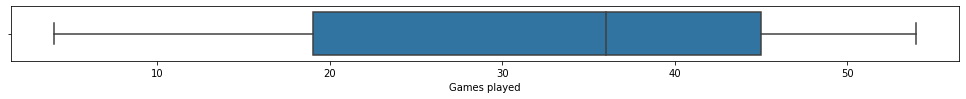

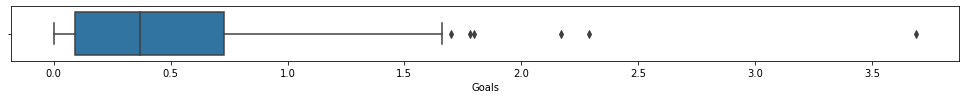

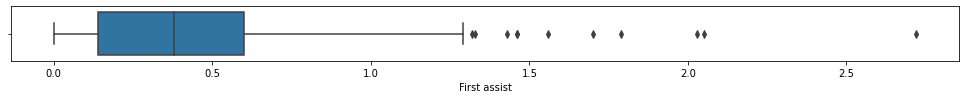

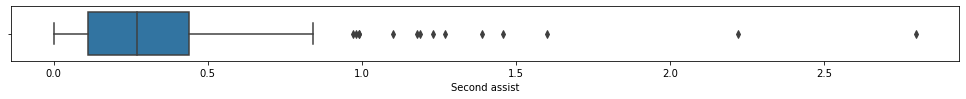

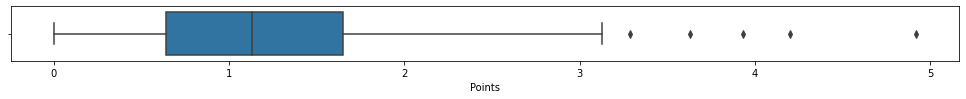

...

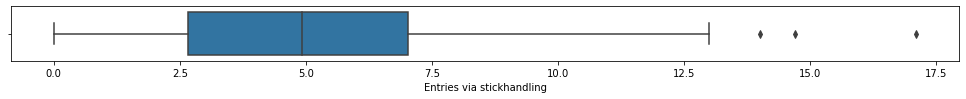

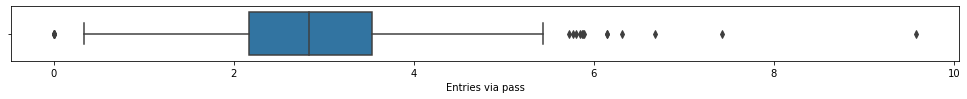

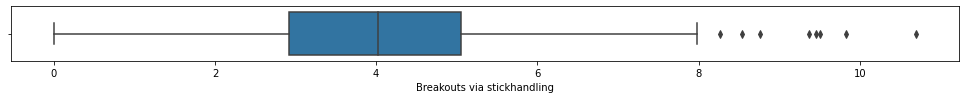

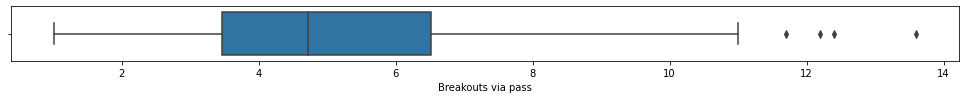

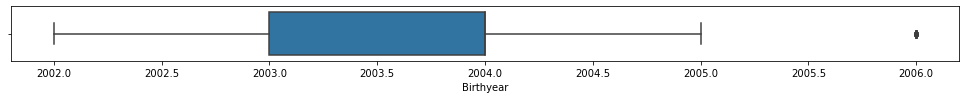

In [32]:
#Examining stat data for outliers or errors for each league
import matplotlib.pyplot as plt
import seaborn as sns

AJ1=AJ.select_dtypes(exclude=['object'])
for column in AJ1:
        plt.figure(figsize=(17,1))
        sns.boxplot(data=AJ1, x=column)

<ipython-input-33-87408b368e8a>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(17,1))


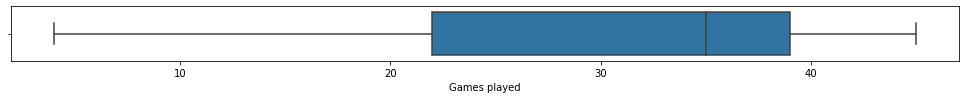

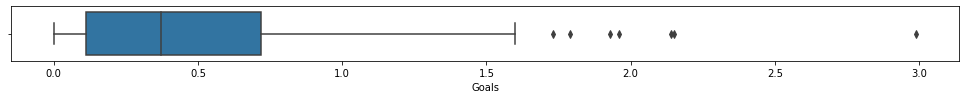

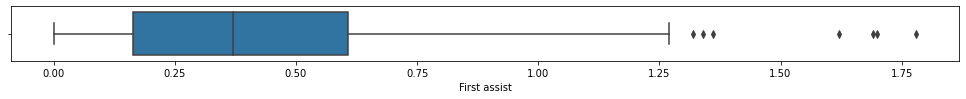

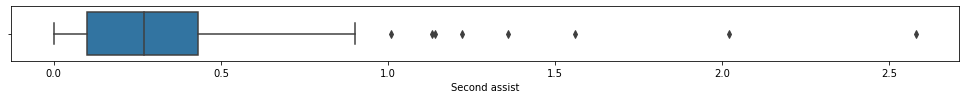

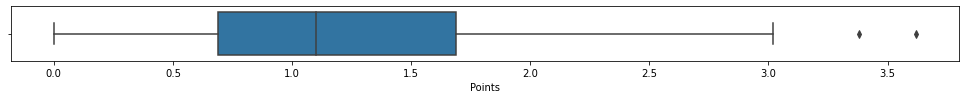

...

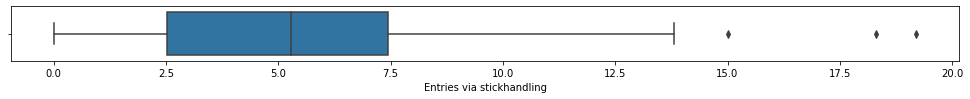

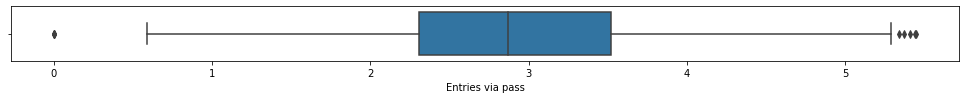

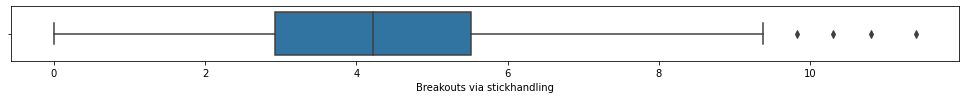

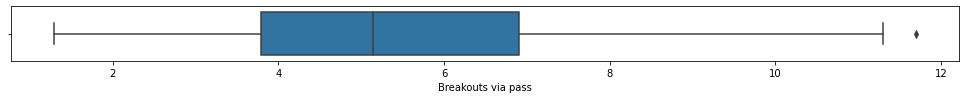

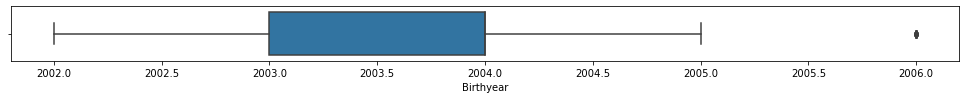

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns

AJ1=BC.select_dtypes(exclude=['object'])
for column in AJ1:
        plt.figure(figsize=(17,1))
        sns.boxplot(data=AJ1, x=column)

<ipython-input-34-e56845d90a5d>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(17,1))


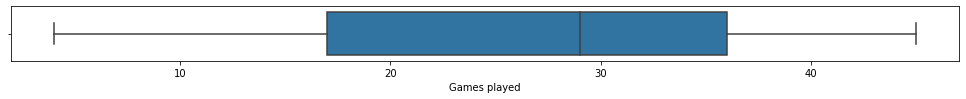

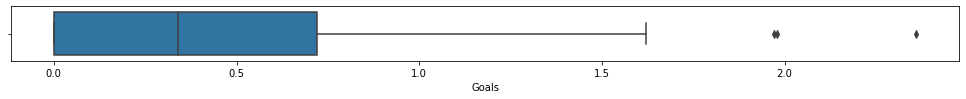

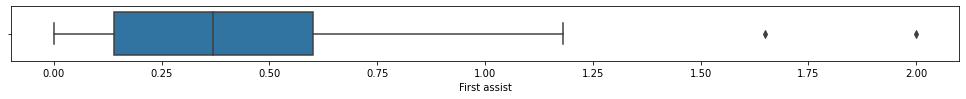

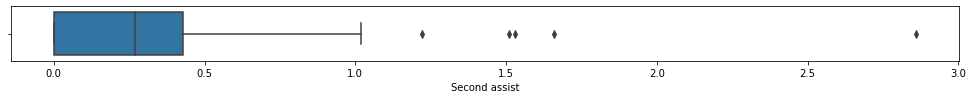

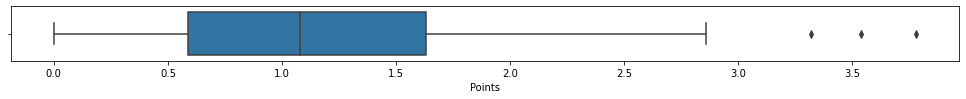

...

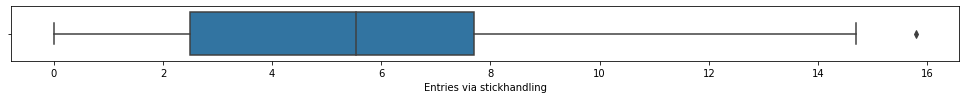

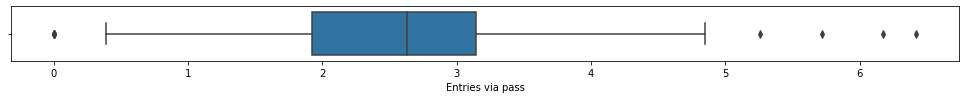

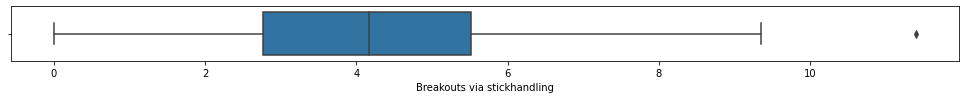

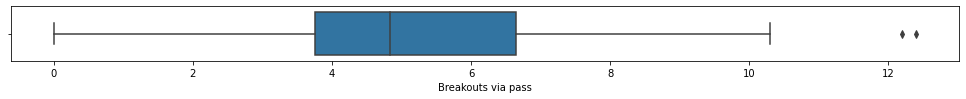

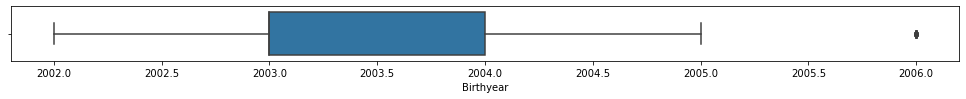

In [34]:
import matplotlib.pyplot as plt
import seaborn as sns

AJ1=CC.select_dtypes(exclude=['object'])
for column in AJ1:
        plt.figure(figsize=(17,1))
        sns.boxplot(data=AJ1, x=column)

<ipython-input-35-ec6c4009cde6>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(17,1))


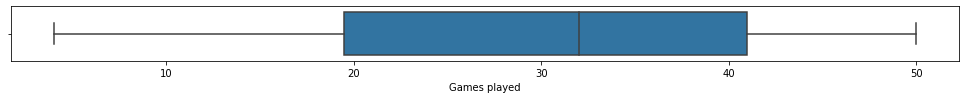

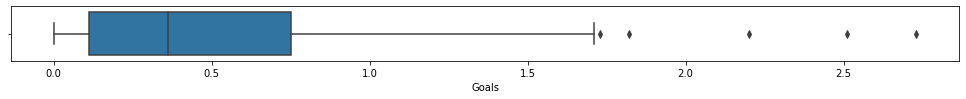

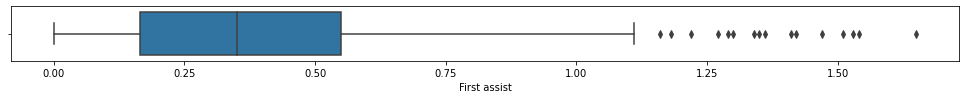

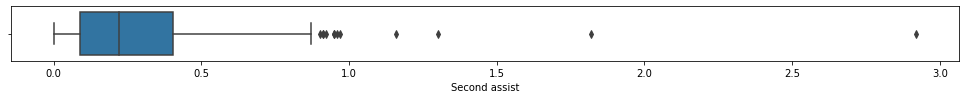

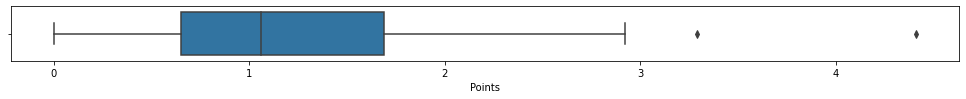

...

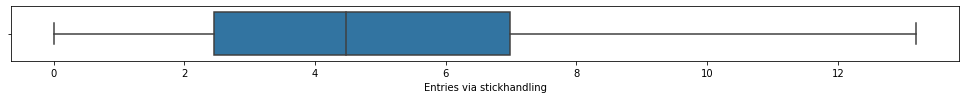

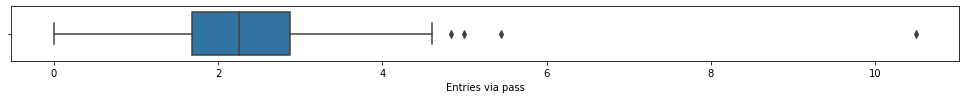

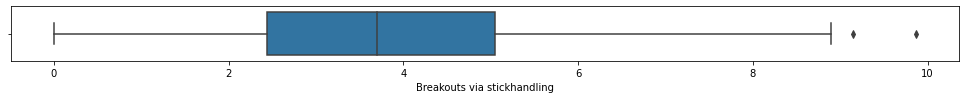

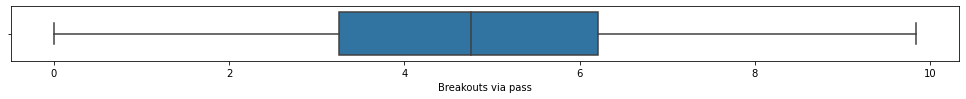

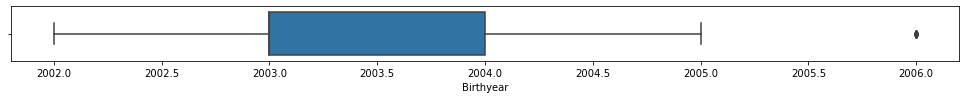

In [35]:
import matplotlib.pyplot as plt
import seaborn as sns

AJ1=MJ.select_dtypes(exclude=['object'])
for column in AJ1:
        plt.figure(figsize=(17,1))
        sns.boxplot(data=AJ1, x=column)

<ipython-input-36-da48be7d0c69>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(17,1))


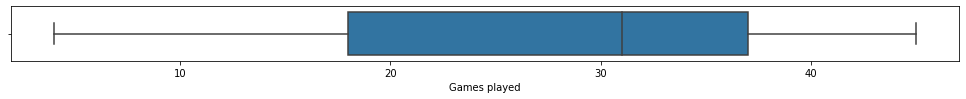

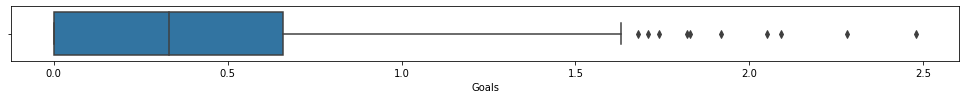

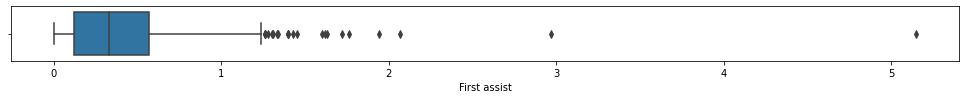

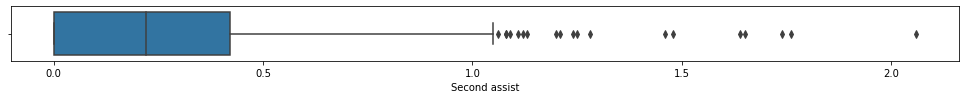

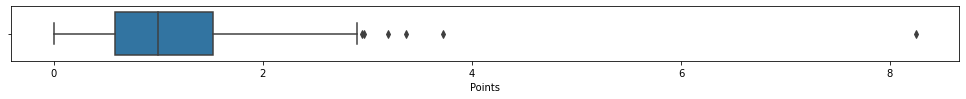

...

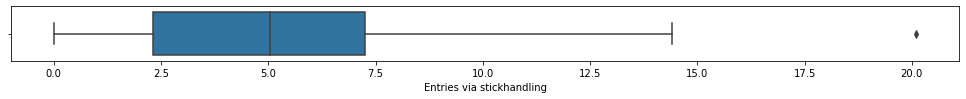

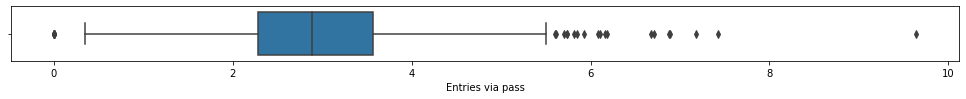

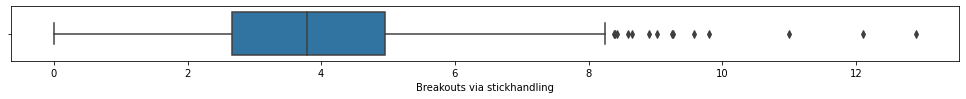

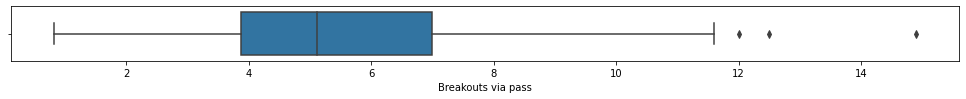

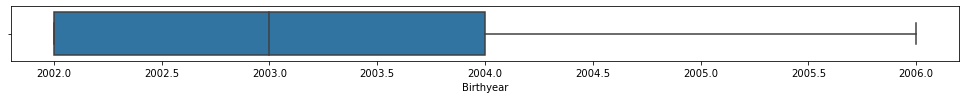

In [36]:
import matplotlib.pyplot as plt
import seaborn as sns

AJ1=NA.select_dtypes(exclude=['object'])
for column in AJ1:
        plt.figure(figsize=(17,1))
        sns.boxplot(data=AJ1, x=column)

<ipython-input-37-6f4f25ba616f>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(17,1))


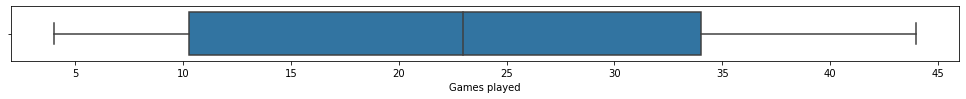

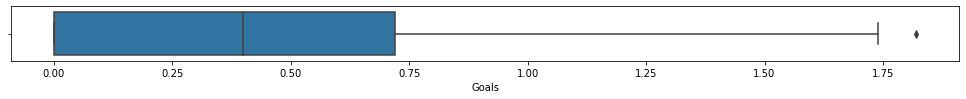

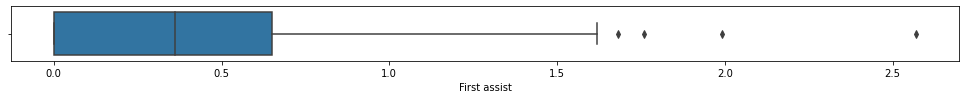

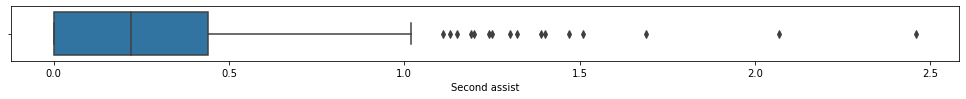

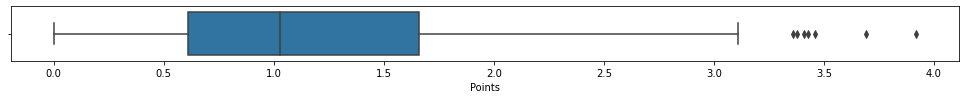

...

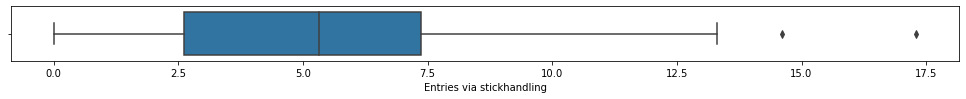

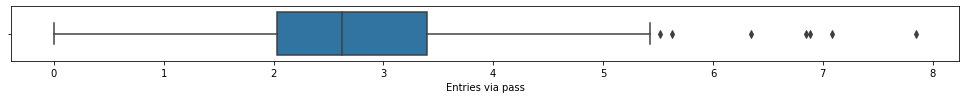

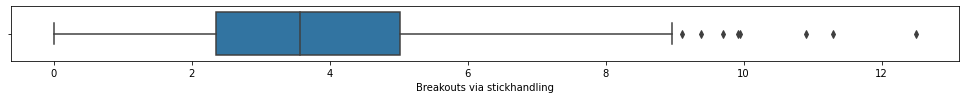

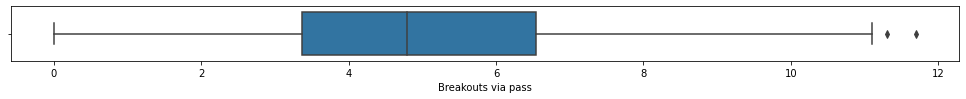

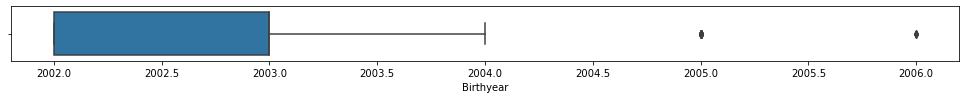

In [37]:
import matplotlib.pyplot as plt
import seaborn as sns

AJ1=NC.select_dtypes(exclude=['object'])
for column in AJ1:
        plt.figure(figsize=(17,1))
        sns.boxplot(data=AJ1, x=column)

<ipython-input-38-35cd2daca429>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(17,1))


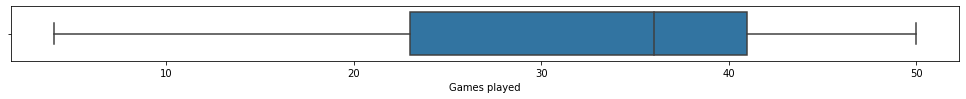

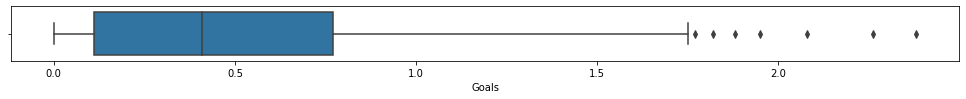

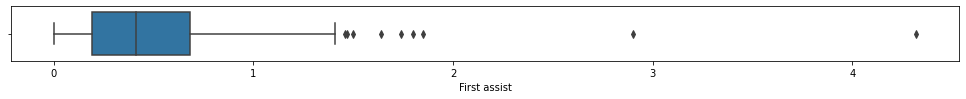

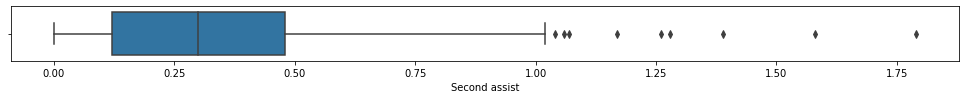

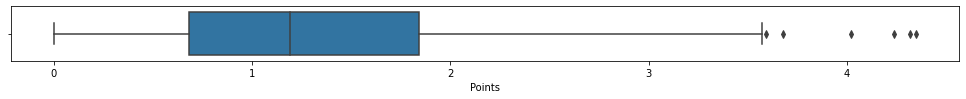

...

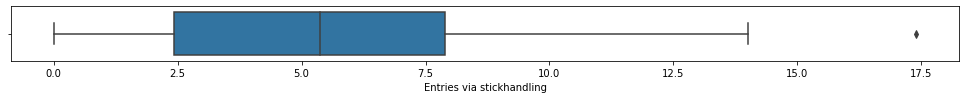

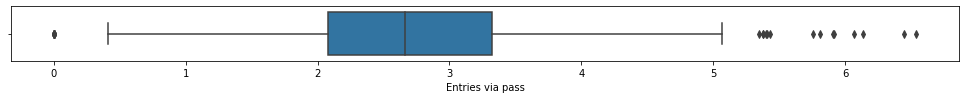

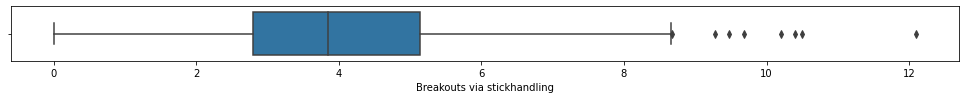

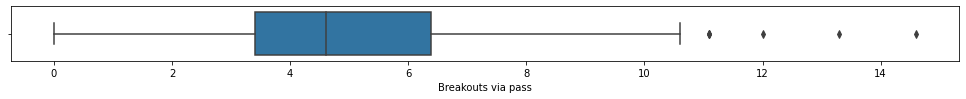

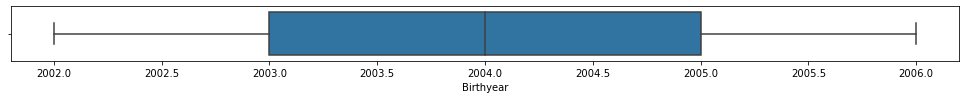

In [38]:
import matplotlib.pyplot as plt
import seaborn as sns

AJ1=OJ.select_dtypes(exclude=['object'])
for column in AJ1:
        plt.figure(figsize=(17,1))
        sns.boxplot(data=AJ1, x=column)

<ipython-input-39-fc70e0298324>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(17,1))


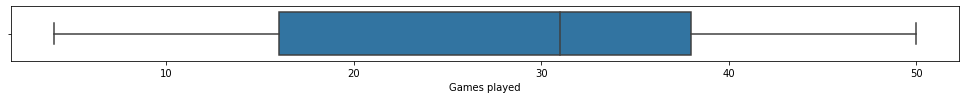

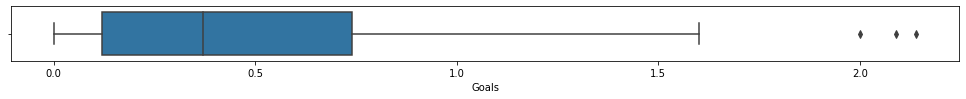

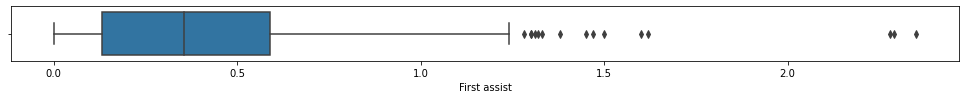

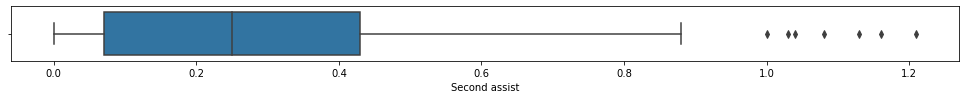

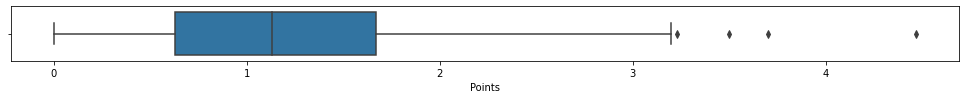

...

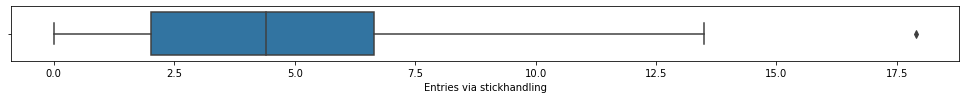

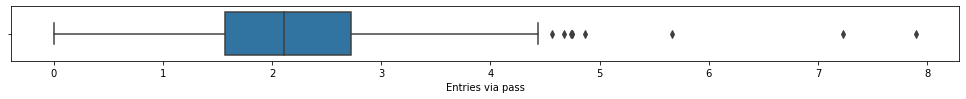

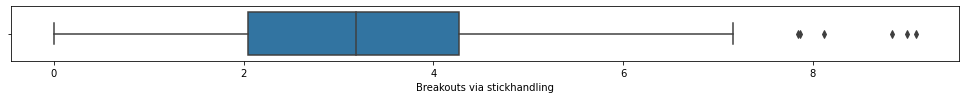

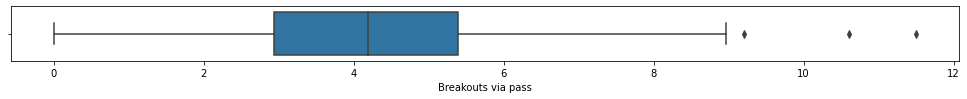

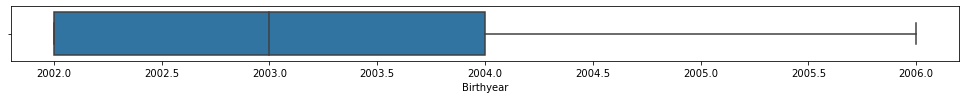

In [39]:
import matplotlib.pyplot as plt
import seaborn as sns

AJ1=SJ.select_dtypes(exclude=['object'])
for column in AJ1:
        plt.figure(figsize=(17,1))
        sns.boxplot(data=AJ1, x=column)

<ipython-input-40-9e9faa75c4a2>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(17,1))


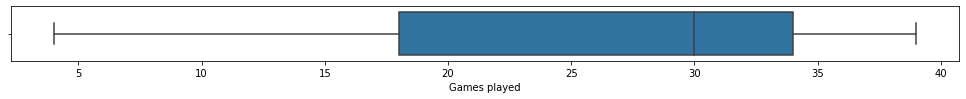

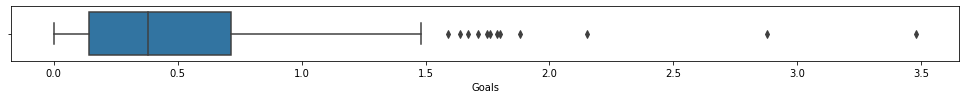

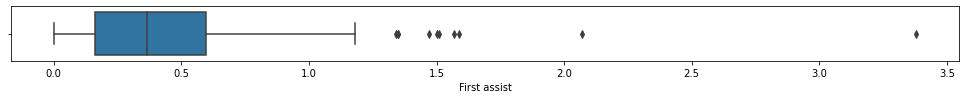

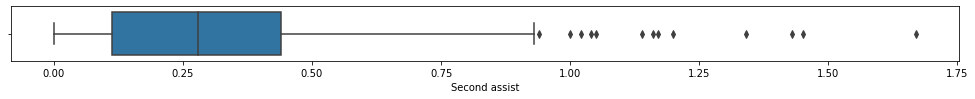

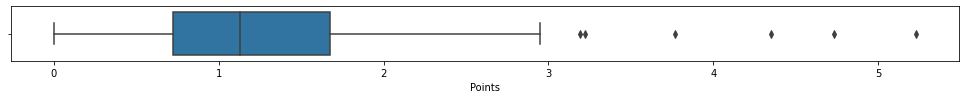

...

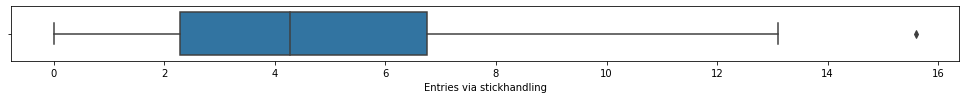

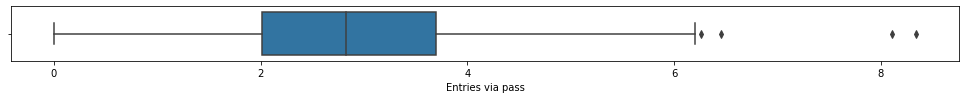

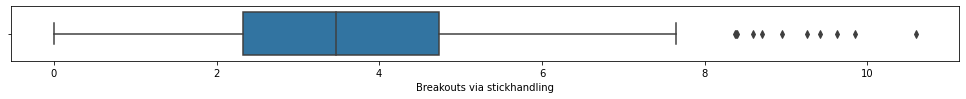

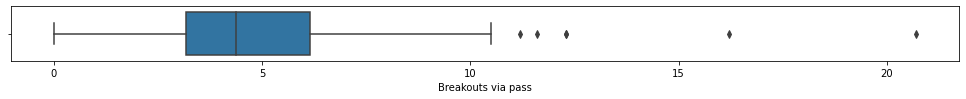

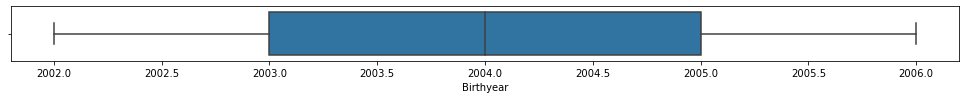

In [40]:
import matplotlib.pyplot as plt
import seaborn as sns

AJ1=US.select_dtypes(exclude=['object'])
for column in AJ1:
        plt.figure(figsize=(17,1))
        sns.boxplot(data=AJ1, x=column)

In [41]:
#Input league rating, league name and age rating into each league
AJ['LeagueRate']=1.5
BC['LeagueRate']=1.7
CC['LeagueRate']=1.35
MJ['LeagueRate']=1.4
NA['LeagueRate']=1.6
NC['LeagueRate']=1.3
OJ['LeagueRate']=1.4
SJ['LeagueRate']=1.25
US['LeagueRate']=1.8

AJ['League']='AJHL'
BC['League']='BCHL'
CC['League']='CCHL'
MJ['League']='MJHL'
NA['League']='NAHL'
NC['League']='NCDC'
OJ['League']='OJHL'
SJ['League']='SJHL'
US['League']='USHL'


AJ['AgeRate'] = AJ['Birthyear'].map({2002: 1, 2003: 1.05, 2004: 1.15, 2005: 1.25, 2006: 1.35})
BC['AgeRate'] = BC['Birthyear'].map({2002: 1, 2003: 1.05, 2004: 1.15, 2005: 1.25, 2006: 1.35})
CC['AgeRate'] = CC['Birthyear'].map({2002: 1, 2003: 1.05, 2004: 1.15, 2005: 1.25, 2006: 1.35})
MJ['AgeRate'] = MJ['Birthyear'].map({2002: 1, 2003: 1.05, 2004: 1.15, 2005: 1.25, 2006: 1.35})
NA['AgeRate'] = NA['Birthyear'].map({2002: 1, 2003: 1.05, 2004: 1.15, 2005: 1.25, 2006: 1.35})
NC['AgeRate'] = NC['Birthyear'].map({2002: 1, 2003: 1.05, 2004: 1.15, 2005: 1.25, 2006: 1.35})
OJ['AgeRate'] = OJ['Birthyear'].map({2002: 1, 2003: 1.05, 2004: 1.15, 2005: 1.25, 2006: 1.35})
SJ['AgeRate'] = SJ['Birthyear'].map({2002: 1, 2003: 1.05, 2004: 1.15, 2005: 1.25, 2006: 1.35})
US['AgeRate'] = US['Birthyear'].map({2002: 1, 2003: 1.05, 2004: 1.15, 2005: 1.25, 2006: 1.35})

AJ.head()

,Player,Team,Date of birth,Position,Games played,Goals,First assist,Second assist,Points,+/-,Puck touches,Penalties drawn,"Faceoffs won, %",Faceoffs won,Hits,Shots,Shots on goal,CORSI-,CORSI+,"CORSI for, %",Puck battles,"Puck battles won, %",Passes,Accurate passes,"Accurate passes, %",Passes to the slot,Pre-shots passes,Scoring chances - total,Inner slot shots - total,Takeaways,Entries via stickhandling,Entries via pass,Breakouts via stickhandling,Breakouts via pass,Birthyear,LeagueRate,League,AgeRate
11,BROCK SOUCH,Sherwood Park Crusaders,2006-10-11,Fwd,50,0.41,0.66,0.33,1.40,-0.25,165.1,1.07,0.0,2.64,2.47,4.94,3.13,40.3,33.4,45.3,30.2,37.1,42.3,33.5,79.1,1.57,1.57,2.47,1.24,7.25,5.19,3.71,3.13,5.93,2006,1.5,AJHL,1.35
15,JAXAN HOPKO,Lloydminster Bobcats,2006-09-13,Def,5,0.82,0.00,0.00,0.82,1.64,153.3,0.00,0.0,0.00,2.46,4.92,2.46,53.3,35.3,39.8,26.2,71.9,41.8,35.3,84.3,0.00,1.64,0.00,0.00,18.00,0.82,1.64,4.10,3.28,2006,1.5,AJHL,1.35
19,NICHOLAS ANISIMOVICZ,Canmore Eagles,2006-08-31,Fwd,9,0.00,0.00,0.00,0.00,-3.08,201.8,1.54,48.6,27.00,3.85,8.47,4.62,59.3,40.0,40.3,35.4,54.4,27.7,17.7,63.9,0.00,1.54,3.08,1.54,9.24,9.24,0.77,4.62,3.08,2006,1.5,AJHL,1.35
24,JACK BIRCH,Drayton Valley Thunder,2006-08-15,Def,7,0.00,0.00,0.00,0.00,-7.18,166.9,0.60,0.0,0.00,0.00,7.78,4.19,76.0,39.5,34.2,26.9,44.4,43.7,32.9,75.3,0.00,0.00,0.00,0.00,17.90,2.99,0.00,2.39,2.99,2006,1.5,AJHL,1.35
28,OTTO HANSON,Blackfalds Bulldogs,2006-06-28,Fwd,31,0.47,0.32,0.32,1.10,-0.79,203.2,0.47,44.0,14.30,5.20,8.98,6.30,39.7,42.2,51.5,37.2,54.7,42.1,33.4,79.4,1.26,2.68,4.57,1.73,14.80,4.73,3.15,3.15,4.57,2006,1.5,AJHL,1.35


In [42]:
#Split each league into forwarda and defensemen
AJF = AJ[AJ['Position'] == 'Fwd']
BCF = BC[BC['Position'] == 'Fwd']
CCF = CC[CC['Position'] == 'Fwd']
MJF = MJ[MJ['Position'] == 'Fwd']
NAF = NA[NA['Position'] == 'Fwd']
NCF = NC[NC['Position'] == 'Fwd']
OJF = OJ[OJ['Position'] == 'Fwd']
SJF = SJ[SJ['Position'] == 'Fwd']
USF = US[US['Position'] == 'Fwd']

AJD = AJ[AJ['Position'] == 'Def']
BCD = BC[BC['Position'] == 'Def']
CCD = CC[CC['Position'] == 'Def']
MJD = MJ[MJ['Position'] == 'Def']
NAD = NA[NA['Position'] == 'Def']
NCD = NC[NC['Position'] == 'Def']
OJD = OJ[OJ['Position'] == 'Def']
SJD = SJ[SJ['Position'] == 'Def']
USD = US[US['Position'] == 'Def']

AJF.head()

,Player,Team,Date of birth,Position,Games played,Goals,First assist,Second assist,Points,+/-,Puck touches,Penalties drawn,"Faceoffs won, %",Faceoffs won,Hits,Shots,Shots on goal,CORSI-,CORSI+,"CORSI for, %",Puck battles,"Puck battles won, %",Passes,Accurate passes,"Accurate passes, %",Passes to the slot,Pre-shots passes,Scoring chances - total,Inner slot shots - total,Takeaways,Entries via stickhandling,Entries via pass,Breakouts via stickhandling,Breakouts via pass,Birthyear,LeagueRate,League,AgeRate
11,BROCK SOUCH,Sherwood Park Crusaders,2006-10-11,Fwd,50,0.41,0.66,0.33,1.40,-0.25,165.1,1.07,0.0,2.64,2.47,4.94,3.13,40.3,33.4,45.3,30.2,37.1,42.3,33.5,79.1,1.57,1.57,2.47,1.24,7.25,5.19,3.71,3.13,5.93,2006,1.5,AJHL,1.35
19,NICHOLAS ANISIMOVICZ,Canmore Eagles,2006-08-31,Fwd,9,0.00,0.00,0.00,0.00,-3.08,201.8,1.54,48.6,27.00,3.85,8.47,4.62,59.3,40.0,40.3,35.4,54.4,27.7,17.7,63.9,0.00,1.54,3.08,1.54,9.24,9.24,0.77,4.62,3.08,2006,1.5,AJHL,1.35
28,OTTO HANSON,Blackfalds Bulldogs,2006-06-28,Fwd,31,0.47,0.32,0.32,1.10,-0.79,203.2,0.47,44.0,14.30,5.20,8.98,6.30,39.7,42.2,51.5,37.2,54.7,42.1,33.4,79.4,1.26,2.68,4.57,1.73,14.80,4.73,3.15,3.15,4.57,2006,1.5,AJHL,1.35
29,NATHAN FREE,Brooks Bandits,2006-06-23,Fwd,45,0.32,0.84,0.63,1.79,0.63,206.7,0.84,0.0,3.27,0.32,8.76,5.59,41.2,49.8,54.8,31.2,39.5,51.1,39.9,78.1,2.43,1.79,4.43,1.27,8.34,7.39,5.80,4.96,5.17,2006,1.5,AJHL,1.35
35,MAX SULLIVAN,Okotoks Oilers,2006-05-25,Fwd,5,0.00,1.24,0.00,1.24,-2.47,186.8,2.47,0.0,2.47,1.24,14.80,9.89,54.4,55.7,50.6,21.0,35.3,37.1,29.7,80.0,1.24,3.71,9.89,2.47,9.89,6.18,7.42,3.71,3.71,2006,1.5,AJHL,1.35


In [43]:
#Chooose F and D stats to keep for model
AJF = AJF.drop(columns=['Breakouts via pass', 'Breakouts via stickhandling', 'Passes', 'Accurate passes', 'Accurate passes, %', 'CORSI-', 'CORSI+'])
BCF = BCF.drop(columns=['Breakouts via pass', 'Breakouts via stickhandling', 'Passes', 'Accurate passes', 'Accurate passes, %', 'CORSI-', 'CORSI+'])
CCF = CCF.drop(columns=['Breakouts via pass', 'Breakouts via stickhandling', 'Passes', 'Accurate passes', 'Accurate passes, %', 'CORSI-', 'CORSI+'])
MJF = MJF.drop(columns=['Breakouts via pass', 'Breakouts via stickhandling', 'Passes', 'Accurate passes', 'Accurate passes, %', 'CORSI-', 'CORSI+'])
NAF = NAF.drop(columns=['Breakouts via pass', 'Breakouts via stickhandling', 'Passes', 'Accurate passes', 'Accurate passes, %', 'CORSI-', 'CORSI+'])
NCF = NCF.drop(columns=['Breakouts via pass', 'Breakouts via stickhandling', 'Passes', 'Accurate passes', 'Accurate passes, %', 'CORSI-', 'CORSI+'])
OJF = OJF.drop(columns=['Breakouts via pass', 'Breakouts via stickhandling', 'Passes', 'Accurate passes', 'Accurate passes, %', 'CORSI-', 'CORSI+'])
SJF = SJF.drop(columns=['Breakouts via pass', 'Breakouts via stickhandling', 'Passes', 'Accurate passes', 'Accurate passes, %', 'CORSI-', 'CORSI+'])
USF = USF.drop(columns=['Breakouts via pass', 'Breakouts via stickhandling', 'Passes', 'Accurate passes', 'Accurate passes, %', 'CORSI-', 'CORSI+'])

AJD = AJD.drop(columns=['Faceoffs won, %', 'Faceoffs won'])
BCD = BCD.drop(columns=['Faceoffs won, %', 'Faceoffs won'])
CCD = CCD.drop(columns=['Faceoffs won, %', 'Faceoffs won'])
MJD = MJD.drop(columns=['Faceoffs won, %', 'Faceoffs won'])
NAD = NAD.drop(columns=['Faceoffs won, %', 'Faceoffs won'])
NCD = NCD.drop(columns=['Faceoffs won, %', 'Faceoffs won'])
OJD = OJD.drop(columns=['Faceoffs won, %', 'Faceoffs won'])
SJD = SJD.drop(columns=['Faceoffs won, %', 'Faceoffs won'])
USD = USD.drop(columns=['Faceoffs won, %', 'Faceoffs won'])

In [44]:
##Get list of columns for each position
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
list(AJF.columns.values)
list(AJD.columns.values)

['Player',
 'Team',
 'Date of birth',
 'Position',
 'Games played',
 'Goals',
 'First assist',
 'Second assist',
 'Points',
 '+/-',
 'Puck touches',
 'Penalties drawn',
 'Hits',
 'Shots',
 'Shots on goal',
 'CORSI-',
 'CORSI+',
 'CORSI for, %',
 'Puck battles',
 'Puck battles won, %',
 'Passes',
 'Accurate passes',
 'Accurate passes, %',
 'Passes to the slot',
 'Pre-shots passes',
 'Scoring chances - total',
 'Inner slot shots - total',
 'Takeaways',
 'Entries via stickhandling',
 'Entries via pass',
 'Breakouts via stickhandling',
 'Breakouts via pass',
 'Birthyear',
 'LeagueRate',
 'League',
 'AgeRate']

In [45]:
#Apply zscores to each stat for each position in each league
import numpy as np
from scipy import stats
AJF[['Goals', 'First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Faceoffs won, %', 'Faceoffs won', 'Hits', 'Shots', 'Shots on goal',
 'CORSI for, %', 'Puck battles', 'Puck battles won, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total', 'Inner slot shots - total',
 'Takeaways', 'Entries via stickhandling', 'Entries via pass']] = AJF[['Goals', 'First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn',
 'Faceoffs won, %', 'Faceoffs won', 'Hits', 'Shots', 'Shots on goal', 'CORSI for, %', 'Puck battles', 'Puck battles won, %', 'Passes to the slot',
 'Pre-shots passes', 'Scoring chances - total', 'Inner slot shots - total', 'Takeaways', 'Entries via stickhandling', 'Entries via pass']].apply(stats.zscore)
AJF.head()

,Player,Team,Date of birth,Position,Games played,Goals,First assist,Second assist,Points,+/-,Puck touches,Penalties drawn,"Faceoffs won, %",Faceoffs won,Hits,Shots,Shots on goal,"CORSI for, %",Puck battles,"Puck battles won, %",Passes to the slot,Pre-shots passes,Scoring chances - total,Inner slot shots - total,Takeaways,Entries via stickhandling,Entries via pass,Birthyear,LeagueRate,League,AgeRate
11,BROCK SOUCH,Sherwood Park Crusaders,2006-10-11,Fwd,50,-0.461196,0.351459,0.054448,-0.078359,0.010555,-0.838740,-0.042481,-0.919610,-0.600090,-0.183188,-1.536018,-1.519257,-0.563039,-0.585009,-1.713572,0.360313,-0.374155,-1.311970,-0.658442,-1.096670,-0.555319,0.680492,2006,1.5,AJHL,1.35
19,NICHOLAS ANISIMOVICZ,Canmore Eagles,2006-08-31,Fwd,9,-1.322563,-1.297805,-1.041513,-1.835995,-1.807702,0.482944,0.626848,1.023767,2.414921,0.499049,-0.268558,-0.697925,-1.242513,0.106365,1.636637,-1.622910,-0.408477,-0.942710,-0.342407,-0.164127,1.177614,-1.762564,2006,1.5,AJHL,1.35
28,OTTO HANSON,Blackfalds Bulldogs,2006-06-28,Fwd,31,-0.335143,-0.498162,0.021237,-0.454995,-0.336391,0.533363,-0.896944,0.839826,0.843056,1.166455,-0.085440,0.228142,0.279509,0.345687,1.694733,-0.031279,0.895754,-0.040747,-0.142251,2.441371,-0.752146,0.215148,2006,1.5,AJHL,1.35
29,NATHAN FREE,Brooks Bandits,2006-06-23,Fwd,45,-0.650277,0.801258,1.050776,0.411268,0.575950,0.659409,-0.370025,-0.919610,-0.522115,-1.246093,-0.164432,-0.163232,0.727962,-0.452052,-1.248803,1.446664,-0.122461,-0.125496,-0.626838,-0.585880,0.386028,2.417222,2006,1.5,AJHL,1.35
35,MAX SULLIVAN,Okotoks Oilers,2006-05-25,Fwd,5,-1.322563,1.800812,-1.041513,-0.279232,-1.415781,-0.057254,1.951266,-0.919610,-0.621131,-0.791268,2.004253,2.207058,0.157204,-1.808208,-2.062148,-0.056543,2.074138,3.179682,0.637301,0.140473,-0.131713,3.763395,2006,1.5,AJHL,1.35


In [46]:
BCF[['Goals', 'First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Faceoffs won, %', 'Faceoffs won', 'Hits', 'Shots', 'Shots on goal',
 'CORSI for, %', 'Puck battles', 'Puck battles won, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total', 'Inner slot shots - total',
 'Takeaways', 'Entries via stickhandling', 'Entries via pass']] = BCF[['Goals', 'First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn',
 'Faceoffs won, %', 'Faceoffs won', 'Hits', 'Shots', 'Shots on goal', 'CORSI for, %', 'Puck battles', 'Puck battles won, %', 'Passes to the slot',
 'Pre-shots passes', 'Scoring chances - total', 'Inner slot shots - total', 'Takeaways', 'Entries via stickhandling', 'Entries via pass']].apply(stats.zscore)

CCF[['Goals', 'First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Faceoffs won, %', 'Faceoffs won', 'Hits', 'Shots', 'Shots on goal',
 'CORSI for, %', 'Puck battles', 'Puck battles won, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total', 'Inner slot shots - total',
 'Takeaways', 'Entries via stickhandling', 'Entries via pass']] = CCF[['Goals', 'First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn',
 'Faceoffs won, %', 'Faceoffs won', 'Hits', 'Shots', 'Shots on goal', 'CORSI for, %', 'Puck battles', 'Puck battles won, %', 'Passes to the slot',
 'Pre-shots passes', 'Scoring chances - total', 'Inner slot shots - total', 'Takeaways', 'Entries via stickhandling', 'Entries via pass']].apply(stats.zscore)

MJF[['Goals', 'First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Faceoffs won, %', 'Faceoffs won', 'Hits', 'Shots', 'Shots on goal',
  'CORSI for, %', 'Puck battles', 'Puck battles won, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total', 'Inner slot shots - total',
 'Takeaways', 'Entries via stickhandling', 'Entries via pass']] = MJF[['Goals', 'First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn',
 'Faceoffs won, %', 'Faceoffs won', 'Hits', 'Shots', 'Shots on goal', 'CORSI for, %', 'Puck battles', 'Puck battles won, %', 'Passes to the slot',
 'Pre-shots passes', 'Scoring chances - total', 'Inner slot shots - total', 'Takeaways', 'Entries via stickhandling', 'Entries via pass']].apply(stats.zscore)

NAF[['Goals', 'First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Faceoffs won, %', 'Faceoffs won', 'Hits', 'Shots', 'Shots on goal',
 'CORSI for, %', 'Puck battles', 'Puck battles won, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total', 'Inner slot shots - total',
 'Takeaways', 'Entries via stickhandling', 'Entries via pass']] = NAF[['Goals', 'First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn',
 'Faceoffs won, %', 'Faceoffs won', 'Hits', 'Shots', 'Shots on goal', 'CORSI for, %', 'Puck battles', 'Puck battles won, %', 'Passes to the slot',
 'Pre-shots passes', 'Scoring chances - total', 'Inner slot shots - total', 'Takeaways', 'Entries via stickhandling', 'Entries via pass']].apply(stats.zscore)

NCF[['Goals', 'First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Faceoffs won, %', 'Faceoffs won', 'Hits', 'Shots', 'Shots on goal',
 'CORSI for, %', 'Puck battles', 'Puck battles won, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total', 'Inner slot shots - total',
 'Takeaways', 'Entries via stickhandling', 'Entries via pass']] = NCF[['Goals', 'First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn',
 'Faceoffs won, %', 'Faceoffs won', 'Hits', 'Shots', 'Shots on goal', 'CORSI for, %', 'Puck battles', 'Puck battles won, %', 'Passes to the slot',
 'Pre-shots passes', 'Scoring chances - total', 'Inner slot shots - total', 'Takeaways', 'Entries via stickhandling', 'Entries via pass']].apply(stats.zscore)

OJF[['Goals', 'First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Faceoffs won, %', 'Faceoffs won', 'Hits', 'Shots', 'Shots on goal',
 'CORSI for, %', 'Puck battles', 'Puck battles won, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total', 'Inner slot shots - total',
 'Takeaways', 'Entries via stickhandling', 'Entries via pass']] = OJF[['Goals', 'First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn',
 'Faceoffs won, %', 'Faceoffs won', 'Hits', 'Shots', 'Shots on goal', 'CORSI for, %', 'Puck battles', 'Puck battles won, %', 'Passes to the slot',
 'Pre-shots passes', 'Scoring chances - total', 'Inner slot shots - total', 'Takeaways', 'Entries via stickhandling', 'Entries via pass']].apply(stats.zscore)

SJF[['Goals', 'First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Faceoffs won, %', 'Faceoffs won', 'Hits', 'Shots', 'Shots on goal',
 'CORSI for, %', 'Puck battles', 'Puck battles won, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total', 'Inner slot shots - total',
 'Takeaways', 'Entries via stickhandling', 'Entries via pass']] = SJF[['Goals', 'First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn',
 'Faceoffs won, %', 'Faceoffs won', 'Hits', 'Shots', 'Shots on goal', 'CORSI for, %', 'Puck battles', 'Puck battles won, %', 'Passes to the slot',
 'Pre-shots passes', 'Scoring chances - total', 'Inner slot shots - total', 'Takeaways', 'Entries via stickhandling', 'Entries via pass']].apply(stats.zscore)

USF[['Goals', 'First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Faceoffs won, %', 'Faceoffs won', 'Hits', 'Shots', 'Shots on goal',
  'CORSI for, %', 'Puck battles', 'Puck battles won, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total', 'Inner slot shots - total',
 'Takeaways', 'Entries via stickhandling', 'Entries via pass']] = USF[['Goals', 'First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn',
 'Faceoffs won, %', 'Faceoffs won', 'Hits', 'Shots', 'Shots on goal', 'CORSI for, %', 'Puck battles', 'Puck battles won, %', 'Passes to the slot',
 'Pre-shots passes', 'Scoring chances - total', 'Inner slot shots - total', 'Takeaways', 'Entries via stickhandling', 'Entries via pass']].apply(stats.zscore)



AJD[['Goals','First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Hits', 'Shots', 'Shots on goal', 'CORSI-', 'CORSI+', 'CORSI for, %',
 'Puck battles', 'Puck battles won, %', 'Passes', 'Accurate passes', 'Accurate passes, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total',
 'Inner slot shots - total', 'Takeaways', 'Entries via stickhandling', 'Entries via pass', 'Breakouts via stickhandling','Breakouts via pass']] = AJD[['Goals',
 'First assist','Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Hits', 'Shots', 'Shots on goal', 'CORSI-', 'CORSI+', 'CORSI for, %',
 'Puck battles', 'Puck battles won, %', 'Passes', 'Accurate passes', 'Accurate passes, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total',
 'Inner slot shots - total', 'Takeaways', 'Entries via stickhandling', 'Entries via pass', 'Breakouts via stickhandling', 'Breakouts via pass']].apply(stats.zscore)

BCD[['Goals','First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Hits', 'Shots', 'Shots on goal', 'CORSI-', 'CORSI+', 'CORSI for, %',
 'Puck battles', 'Puck battles won, %', 'Passes', 'Accurate passes', 'Accurate passes, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total',
 'Inner slot shots - total', 'Takeaways', 'Entries via stickhandling', 'Entries via pass', 'Breakouts via stickhandling','Breakouts via pass']] = BCD[['Goals',
 'First assist','Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Hits', 'Shots', 'Shots on goal', 'CORSI-', 'CORSI+', 'CORSI for, %',
 'Puck battles', 'Puck battles won, %', 'Passes', 'Accurate passes', 'Accurate passes, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total',
 'Inner slot shots - total', 'Takeaways', 'Entries via stickhandling', 'Entries via pass', 'Breakouts via stickhandling', 'Breakouts via pass']].apply(stats.zscore)

CCD[['Goals','First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Hits', 'Shots', 'Shots on goal', 'CORSI-', 'CORSI+', 'CORSI for, %',
 'Puck battles', 'Puck battles won, %', 'Passes', 'Accurate passes', 'Accurate passes, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total',
 'Inner slot shots - total', 'Takeaways', 'Entries via stickhandling', 'Entries via pass', 'Breakouts via stickhandling','Breakouts via pass']] = CCD[['Goals',
 'First assist','Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Hits', 'Shots', 'Shots on goal', 'CORSI-', 'CORSI+', 'CORSI for, %',
 'Puck battles', 'Puck battles won, %', 'Passes', 'Accurate passes', 'Accurate passes, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total',
 'Inner slot shots - total', 'Takeaways', 'Entries via stickhandling', 'Entries via pass', 'Breakouts via stickhandling', 'Breakouts via pass']].apply(stats.zscore)

MJD[['Goals','First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Hits', 'Shots', 'Shots on goal', 'CORSI-', 'CORSI+', 'CORSI for, %',
 'Puck battles', 'Puck battles won, %', 'Passes', 'Accurate passes', 'Accurate passes, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total',
 'Inner slot shots - total', 'Takeaways', 'Entries via stickhandling', 'Entries via pass', 'Breakouts via stickhandling','Breakouts via pass']] = MJD[['Goals',
 'First assist','Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Hits', 'Shots', 'Shots on goal', 'CORSI-', 'CORSI+', 'CORSI for, %',
 'Puck battles', 'Puck battles won, %', 'Passes', 'Accurate passes', 'Accurate passes, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total',
 'Inner slot shots - total', 'Takeaways', 'Entries via stickhandling', 'Entries via pass', 'Breakouts via stickhandling', 'Breakouts via pass']].apply(stats.zscore)

NAD[['Goals','First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Hits', 'Shots', 'Shots on goal', 'CORSI-', 'CORSI+', 'CORSI for, %',
 'Puck battles', 'Puck battles won, %', 'Passes', 'Accurate passes', 'Accurate passes, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total',
 'Inner slot shots - total', 'Takeaways', 'Entries via stickhandling', 'Entries via pass', 'Breakouts via stickhandling','Breakouts via pass']] = NAD[['Goals',
 'First assist','Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Hits', 'Shots', 'Shots on goal', 'CORSI-', 'CORSI+', 'CORSI for, %',
 'Puck battles', 'Puck battles won, %', 'Passes', 'Accurate passes', 'Accurate passes, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total',
 'Inner slot shots - total', 'Takeaways', 'Entries via stickhandling', 'Entries via pass', 'Breakouts via stickhandling', 'Breakouts via pass']].apply(stats.zscore)

NCD[['Goals','First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Hits', 'Shots', 'Shots on goal', 'CORSI-', 'CORSI+', 'CORSI for, %',
 'Puck battles', 'Puck battles won, %', 'Passes', 'Accurate passes', 'Accurate passes, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total',
 'Inner slot shots - total', 'Takeaways', 'Entries via stickhandling', 'Entries via pass', 'Breakouts via stickhandling','Breakouts via pass']] = NCD[['Goals',
 'First assist','Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Hits', 'Shots', 'Shots on goal', 'CORSI-', 'CORSI+', 'CORSI for, %',
 'Puck battles', 'Puck battles won, %', 'Passes', 'Accurate passes', 'Accurate passes, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total',
 'Inner slot shots - total', 'Takeaways', 'Entries via stickhandling', 'Entries via pass', 'Breakouts via stickhandling', 'Breakouts via pass']].apply(stats.zscore)

OJD[['Goals','First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Hits', 'Shots', 'Shots on goal', 'CORSI-', 'CORSI+', 'CORSI for, %',
 'Puck battles', 'Puck battles won, %', 'Passes', 'Accurate passes', 'Accurate passes, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total',
 'Inner slot shots - total', 'Takeaways', 'Entries via stickhandling', 'Entries via pass', 'Breakouts via stickhandling','Breakouts via pass']] = OJD[['Goals',
 'First assist','Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Hits', 'Shots', 'Shots on goal', 'CORSI-', 'CORSI+', 'CORSI for, %',
 'Puck battles', 'Puck battles won, %', 'Passes', 'Accurate passes', 'Accurate passes, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total',
 'Inner slot shots - total', 'Takeaways', 'Entries via stickhandling', 'Entries via pass', 'Breakouts via stickhandling', 'Breakouts via pass']].apply(stats.zscore)

SJD[['Goals','First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Hits', 'Shots', 'Shots on goal', 'CORSI-', 'CORSI+', 'CORSI for, %',
 'Puck battles', 'Puck battles won, %', 'Passes', 'Accurate passes', 'Accurate passes, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total',
 'Inner slot shots - total', 'Takeaways', 'Entries via stickhandling', 'Entries via pass', 'Breakouts via stickhandling','Breakouts via pass']] = SJD[['Goals',
 'First assist','Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Hits', 'Shots', 'Shots on goal', 'CORSI-', 'CORSI+', 'CORSI for, %',
 'Puck battles', 'Puck battles won, %', 'Passes', 'Accurate passes', 'Accurate passes, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total',
 'Inner slot shots - total', 'Takeaways', 'Entries via stickhandling', 'Entries via pass', 'Breakouts via stickhandling', 'Breakouts via pass']].apply(stats.zscore)

USD[['Goals','First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Hits', 'Shots', 'Shots on goal', 'CORSI-', 'CORSI+', 'CORSI for, %',
 'Puck battles', 'Puck battles won, %', 'Passes', 'Accurate passes', 'Accurate passes, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total',
 'Inner slot shots - total', 'Takeaways', 'Entries via stickhandling', 'Entries via pass', 'Breakouts via stickhandling','Breakouts via pass']] = USD[['Goals',
 'First assist','Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Hits', 'Shots', 'Shots on goal', 'CORSI-', 'CORSI+', 'CORSI for, %',
 'Puck battles', 'Puck battles won, %', 'Passes', 'Accurate passes', 'Accurate passes, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total',
 'Inner slot shots - total', 'Takeaways', 'Entries via stickhandling', 'Entries via pass', 'Breakouts via stickhandling', 'Breakouts via pass']].apply(stats.zscore)

USD.head()

,Player,Team,Date of birth,Position,Games played,Goals,First assist,Second assist,Points,+/-,Puck touches,Penalties drawn,Hits,Shots,Shots on goal,CORSI-,CORSI+,"CORSI for, %",Puck battles,"Puck battles won, %",Passes,Accurate passes,"Accurate passes, %",Passes to the slot,Pre-shots passes,Scoring chances - total,Inner slot shots - total,Takeaways,Entries via stickhandling,Entries via pass,Breakouts via stickhandling,Breakouts via pass,Birthyear,LeagueRate,League,AgeRate
1,DAKODA RHEAUME-MULLEN,USNTDP U18,2006-12-18,Def,14,0.402810,-0.055583,-0.099100,0.114674,-0.299868,-1.425597,-0.583508,-0.451454,-0.467205,0.134664,0.914560,-0.324553,-0.942142,-1.089447,-2.580476,-1.344711,-1.614178,-3.210341,0.083958,0.410711,-0.414487,-0.786154,-0.868149,-0.811960,-0.464999,-1.306926,-0.753407,2006,1.8,USHL,1.35
9,LOGAN HENSLER,USNTDP U18,2006-10-14,Def,14,-0.985076,0.110076,-1.237595,-1.041066,-1.403533,-1.931635,-1.234928,-1.117547,0.116722,-0.115830,1.360004,-0.308468,-1.227910,-1.700377,-0.026130,-1.809458,-1.614178,1.475704,-0.566853,-1.522183,0.065224,-0.786154,-1.313360,-0.940540,-0.941012,-1.700951,-1.431362,2006,1.8,USHL,1.35
13,SAM LAURILA,USNTDP U18,2006-09-02,Def,15,0.509570,-1.132367,-1.237595,-1.088239,-1.718865,-1.933816,-0.533399,0.355931,-1.083128,-1.475654,1.028776,-0.131535,-0.906421,-1.629339,0.612457,-1.606659,-1.661905,-1.390760,-0.623446,-0.695908,-0.352986,0.124535,-0.989570,-1.319852,-1.261091,-1.491877,-1.530230,2006,1.8,USHL,1.35
19,COLE HUTSON,USNTDP U18,2006-06-28,Def,15,0.402810,1.021201,2.177891,1.954423,-0.292701,-1.737508,-1.234928,1.297880,-0.795164,-0.437893,0.400585,-1.450486,-1.335073,-1.330978,0.129623,-2.037607,-1.824177,1.799739,0.791361,-1.138555,-0.094680,-0.786154,-0.928860,-0.143342,-0.899977,0.373710,-1.379574,2006,1.8,USHL,1.35
22,NOAH LAPOINTE,USNTDP U18,2006-06-05,Def,14,0.509570,2.387889,-1.237595,0.916616,0.079965,-1.931635,-1.234928,0.006064,-1.167118,-1.253788,-0.044860,-0.807096,-0.513490,-1.728792,-1.022948,-1.986908,-2.120084,-3.135563,-1.415737,-0.268015,-0.340685,0.124535,-1.475255,-0.773385,-0.317270,-1.258678,-0.974684,2006,1.8,USHL,1.35


In [47]:
#Add 10 to each z score to eliminate negative numbers
AJF.loc[:, ['Goals', 'First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Faceoffs won, %', 'Faceoffs won', 'Hits', 'Shots', 'Shots on goal',
 'CORSI for, %', 'Puck battles', 'Puck battles won, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total', 'Inner slot shots - total',
 'Takeaways', 'Entries via stickhandling', 'Entries via pass']] += 10
BCF.loc[:, ['Goals', 'First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Faceoffs won, %', 'Faceoffs won', 'Hits', 'Shots', 'Shots on goal',
 'CORSI for, %', 'Puck battles', 'Puck battles won, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total', 'Inner slot shots - total',
 'Takeaways', 'Entries via stickhandling', 'Entries via pass']] += 10
CCF.loc[:, ['Goals', 'First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Faceoffs won, %', 'Faceoffs won', 'Hits', 'Shots', 'Shots on goal',
  'CORSI for, %', 'Puck battles', 'Puck battles won, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total', 'Inner slot shots - total',
 'Takeaways', 'Entries via stickhandling', 'Entries via pass']] += 10
MJF.loc[:, ['Goals', 'First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Faceoffs won, %', 'Faceoffs won', 'Hits', 'Shots', 'Shots on goal',
 'CORSI for, %', 'Puck battles', 'Puck battles won, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total', 'Inner slot shots - total',
 'Takeaways', 'Entries via stickhandling', 'Entries via pass']] += 10
NAF.loc[:, ['Goals', 'First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Faceoffs won, %', 'Faceoffs won', 'Hits', 'Shots', 'Shots on goal',
 'CORSI for, %', 'Puck battles', 'Puck battles won, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total', 'Inner slot shots - total',
 'Takeaways', 'Entries via stickhandling', 'Entries via pass']] += 10
NCF.loc[:, ['Goals', 'First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Faceoffs won, %', 'Faceoffs won', 'Hits', 'Shots', 'Shots on goal',
  'CORSI for, %', 'Puck battles', 'Puck battles won, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total', 'Inner slot shots - total',
 'Takeaways', 'Entries via stickhandling', 'Entries via pass']] += 10
OJF.loc[:, ['Goals', 'First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Faceoffs won, %', 'Faceoffs won', 'Hits', 'Shots', 'Shots on goal',
 'CORSI for, %', 'Puck battles', 'Puck battles won, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total', 'Inner slot shots - total',
 'Takeaways', 'Entries via stickhandling', 'Entries via pass']] += 10
SJF.loc[:, ['Goals', 'First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Faceoffs won, %', 'Faceoffs won', 'Hits', 'Shots', 'Shots on goal',
 'CORSI for, %', 'Puck battles', 'Puck battles won, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total', 'Inner slot shots - total',
 'Takeaways', 'Entries via stickhandling', 'Entries via pass']] += 10
USF.loc[:, ['Goals', 'First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Faceoffs won, %', 'Faceoffs won', 'Hits', 'Shots', 'Shots on goal',
 'CORSI for, %', 'Puck battles', 'Puck battles won, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total', 'Inner slot shots - total',
 'Takeaways', 'Entries via stickhandling', 'Entries via pass']] += 10

#For D, subtract 10 for CORSI- as it should bring down a players score
AJD.loc[:, ['Goals','First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Hits', 'Shots', 'Shots on goal', 'CORSI-', 'CORSI+', 'CORSI for, %',
 'Puck battles', 'Puck battles won, %', 'Passes', 'Accurate passes', 'Accurate passes, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total',
 'Inner slot shots - total', 'Takeaways', 'Entries via stickhandling', 'Entries via pass', 'Breakouts via stickhandling','Breakouts via pass']] += 10
AJD.loc[:, ['CORSI-']] -= 10
BCD.loc[:, ['Goals','First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Hits', 'Shots', 'Shots on goal', 'CORSI+', 'CORSI for, %',
 'Puck battles', 'Puck battles won, %', 'Passes', 'Accurate passes', 'Accurate passes, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total',
 'Inner slot shots - total', 'Takeaways', 'Entries via stickhandling', 'Entries via pass', 'Breakouts via stickhandling','Breakouts via pass']] += 10
BCD.loc[:, ['CORSI-']] -= 10
CCD.loc[:, ['Goals','First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Hits', 'Shots', 'Shots on goal', 'CORSI+', 'CORSI for, %',
 'Puck battles', 'Puck battles won, %', 'Passes', 'Accurate passes', 'Accurate passes, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total',
 'Inner slot shots - total', 'Takeaways', 'Entries via stickhandling', 'Entries via pass', 'Breakouts via stickhandling','Breakouts via pass']] += 10
CCD.loc[:, ['CORSI-']] -= 10
MJD.loc[:, ['Goals','First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Hits', 'Shots', 'Shots on goal', 'CORSI+', 'CORSI for, %',
 'Puck battles', 'Puck battles won, %', 'Passes', 'Accurate passes', 'Accurate passes, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total',
 'Inner slot shots - total', 'Takeaways', 'Entries via stickhandling', 'Entries via pass', 'Breakouts via stickhandling','Breakouts via pass']] += 10
MJD.loc[:, ['CORSI-']] -= 10
NAD.loc[:, ['Goals','First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Hits', 'Shots', 'Shots on goal', 'CORSI+', 'CORSI for, %',
 'Puck battles', 'Puck battles won, %', 'Passes', 'Accurate passes', 'Accurate passes, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total',
 'Inner slot shots - total', 'Takeaways', 'Entries via stickhandling', 'Entries via pass', 'Breakouts via stickhandling','Breakouts via pass']] += 10
NAD.loc[:, ['CORSI-']] -= 10
NCD.loc[:, ['Goals','First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Hits', 'Shots', 'Shots on goal','CORSI+', 'CORSI for, %',
 'Puck battles', 'Puck battles won, %', 'Passes', 'Accurate passes', 'Accurate passes, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total',
 'Inner slot shots - total', 'Takeaways', 'Entries via stickhandling', 'Entries via pass', 'Breakouts via stickhandling','Breakouts via pass']] += 10
NCD.loc[:, ['CORSI-']] -= 10
OJD.loc[:, ['Goals','First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Hits', 'Shots', 'Shots on goal', 'CORSI+', 'CORSI for, %',
 'Puck battles', 'Puck battles won, %', 'Passes', 'Accurate passes', 'Accurate passes, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total',
 'Inner slot shots - total', 'Takeaways', 'Entries via stickhandling', 'Entries via pass', 'Breakouts via stickhandling','Breakouts via pass']] += 10
OJD.loc[:, ['CORSI-']] -= 10
SJD.loc[:, ['Goals','First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Hits', 'Shots', 'Shots on goal','CORSI+', 'CORSI for, %',
 'Puck battles', 'Puck battles won, %', 'Passes', 'Accurate passes', 'Accurate passes, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total',
 'Inner slot shots - total', 'Takeaways', 'Entries via stickhandling', 'Entries via pass', 'Breakouts via stickhandling','Breakouts via pass']] += 10
SJD.loc[:, ['CORSI-']] -= 10
USD.loc[:, ['Goals','First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Hits', 'Shots', 'Shots on goal', 'CORSI+', 'CORSI for, %',
 'Puck battles', 'Puck battles won, %', 'Passes', 'Accurate passes', 'Accurate passes, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total',
 'Inner slot shots - total', 'Takeaways', 'Entries via stickhandling', 'Entries via pass', 'Breakouts via stickhandling','Breakouts via pass']] += 10
USD.loc[:, ['CORSI-']] -= 10

AJF.head()

,Player,Team,Date of birth,Position,Games played,Goals,First assist,Second assist,Points,+/-,Puck touches,Penalties drawn,"Faceoffs won, %",Faceoffs won,Hits,Shots,Shots on goal,"CORSI for, %",Puck battles,"Puck battles won, %",Passes to the slot,Pre-shots passes,Scoring chances - total,Inner slot shots - total,Takeaways,Entries via stickhandling,Entries via pass,Birthyear,LeagueRate,League,AgeRate
11,BROCK SOUCH,Sherwood Park Crusaders,2006-10-11,Fwd,50,9.538804,10.351459,10.054448,9.921641,10.010555,9.161260,9.957519,9.080390,9.399910,9.816812,8.463982,8.480743,9.436961,9.414991,8.286428,10.360313,9.625845,8.688030,9.341558,8.903330,9.444681,10.680492,2006,1.5,AJHL,1.35
19,NICHOLAS ANISIMOVICZ,Canmore Eagles,2006-08-31,Fwd,9,8.677437,8.702195,8.958487,8.164005,8.192298,10.482944,10.626848,11.023767,12.414921,10.499049,9.731442,9.302075,8.757487,10.106365,11.636637,8.377090,9.591523,9.057290,9.657593,9.835873,11.177614,8.237436,2006,1.5,AJHL,1.35
28,OTTO HANSON,Blackfalds Bulldogs,2006-06-28,Fwd,31,9.664857,9.501838,10.021237,9.545005,9.663609,10.533363,9.103056,10.839826,10.843056,11.166455,9.914560,10.228142,10.279509,10.345687,11.694733,9.968721,10.895754,9.959253,9.857749,12.441371,9.247854,10.215148,2006,1.5,AJHL,1.35
29,NATHAN FREE,Brooks Bandits,2006-06-23,Fwd,45,9.349723,10.801258,11.050776,10.411268,10.575950,10.659409,9.629975,9.080390,9.477885,8.753907,9.835568,9.836768,10.727962,9.547948,8.751197,11.446664,9.877539,9.874504,9.373162,9.414120,10.386028,12.417222,2006,1.5,AJHL,1.35
35,MAX SULLIVAN,Okotoks Oilers,2006-05-25,Fwd,5,8.677437,11.800812,8.958487,9.720768,8.584219,9.942746,11.951266,9.080390,9.378869,9.208732,12.004253,12.207058,10.157204,8.191792,7.937852,9.943457,12.074138,13.179682,10.637301,10.140473,9.868287,13.763395,2006,1.5,AJHL,1.35


In [48]:
#Apply stat weights
AJF.loc[:, ["Goals"]] *= 2
AJF.loc[:, ["First assist"]] *= 1.7
AJF.loc[:, ['Second assist']] *= 1.5
AJF.loc[:, ['Points']] *= 1
AJF.loc[:, ["+/-"]] *= 1.05
AJF.loc[:, ["Puck touches"]] *= 1.1
AJF.loc[:, ["Penalties drawn"]] *= 1.4
AJF.loc[:, ["Faceoffs won, %"]] *= 1.1
AJF.loc[:, ['Faceoffs won']] *= 1.15
AJF.loc[:, ['Hits']] *= 1.1
AJF.loc[:, ["Shots"]] *= 1.05
AJF.loc[:, ["Shots on goal"]] *= 1.15
AJF.loc[:, ["CORSI for, %"]] *= 1.15
AJF.loc[:, ["Puck battles"]] *= 1.15
AJF.loc[:, ['Puck battles won, %']] *= 1.05
AJF.loc[:, ['Passes to the slot']] *= 1.3
AJF.loc[:, ["Pre-shots passes"]] *= 1.1
AJF.loc[:, ["Scoring chances - total"]] *= 1.35
AJF.loc[:, ["Inner slot shots - total"]] *= 1.5
AJF.loc[:, ["Takeaways"]] *= 1.1
AJF.loc[:, ['Entries via stickhandling']] *= 1.3
AJF.loc[:, ['Entries via pass']] *= 1.1

BCF.loc[:, ["Goals"]] *= 2
BCF.loc[:, ["First assist"]] *= 1.7
BCF.loc[:, ['Second assist']] *= 1.5
BCF.loc[:, ['Points']] *= 1
BCF.loc[:, ["+/-"]] *= 1.05
BCF.loc[:, ["Puck touches"]] *= 1.1
BCF.loc[:, ["Penalties drawn"]] *= 1.4
BCF.loc[:, ["Faceoffs won, %"]] *= 1.1
BCF.loc[:, ['Faceoffs won']] *= 1.15
BCF.loc[:, ['Hits']] *= 1.1
BCF.loc[:, ["Shots"]] *= 1.05
BCF.loc[:, ["Shots on goal"]] *= 1.15
BCF.loc[:, ["CORSI for, %"]] *= 1.15
BCF.loc[:, ["Puck battles"]] *= 1.15
BCF.loc[:, ['Puck battles won, %']] *= 1.05
BCF.loc[:, ['Passes to the slot']] *= 1.3
BCF.loc[:, ["Pre-shots passes"]] *= 1.1
BCF.loc[:, ["Scoring chances - total"]] *= 1.35
BCF.loc[:, ["Inner slot shots - total"]] *= 1.5
BCF.loc[:, ["Takeaways"]] *= 1.1
BCF.loc[:, ['Entries via stickhandling']] *= 1.3
BCF.loc[:, ['Entries via pass']] *= 1.1

CCF.loc[:, ["Goals"]] *= 2
CCF.loc[:, ["First assist"]] *= 1.7
CCF.loc[:, ['Second assist']] *= 1.5
CCF.loc[:, ['Points']] *= 1
CCF.loc[:, ["+/-"]] *= 1.05
CCF.loc[:, ["Puck touches"]] *= 1.1
CCF.loc[:, ["Penalties drawn"]] *= 1.4
CCF.loc[:, ["Faceoffs won, %"]] *= 1.1
CCF.loc[:, ['Faceoffs won']] *= 1.15
CCF.loc[:, ['Hits']] *= 1.1
CCF.loc[:, ["Shots"]] *= 1.05
CCF.loc[:, ["Shots on goal"]] *= 1.15
CCF.loc[:, ["CORSI for, %"]] *= 1.15
CCF.loc[:, ["Puck battles"]] *= 1.15
CCF.loc[:, ['Puck battles won, %']] *= 1.05
CCF.loc[:, ['Passes to the slot']] *= 1.3
CCF.loc[:, ["Pre-shots passes"]] *= 1.1
CCF.loc[:, ["Scoring chances - total"]] *= 1.35
CCF.loc[:, ["Inner slot shots - total"]] *= 1.5
CCF.loc[:, ["Takeaways"]] *= 1.1
CCF.loc[:, ['Entries via stickhandling']] *= 1.3
CCF.loc[:, ['Entries via pass']] *= 1.1

MJF.loc[:, ["Goals"]] *= 2
MJF.loc[:, ["First assist"]] *= 1.7
MJF.loc[:, ['Second assist']] *= 1.5
MJF.loc[:, ['Points']] *= 1
MJF.loc[:, ["+/-"]] *= 1.05
MJF.loc[:, ["Puck touches"]] *= 1.1
MJF.loc[:, ["Penalties drawn"]] *= 1.4
MJF.loc[:, ["Faceoffs won, %"]] *= 1.1
MJF.loc[:, ['Faceoffs won']] *= 1.15
MJF.loc[:, ['Hits']] *= 1.1
MJF.loc[:, ["Shots"]] *= 1.05
MJF.loc[:, ["Shots on goal"]] *= 1.15
MJF.loc[:, ["CORSI for, %"]] *= 1.15
MJF.loc[:, ["Puck battles"]] *= 1.15
MJF.loc[:, ['Puck battles won, %']] *= 1.05
MJF.loc[:, ['Passes to the slot']] *= 1.3
MJF.loc[:, ["Pre-shots passes"]] *= 1.1
MJF.loc[:, ["Scoring chances - total"]] *= 1.35
MJF.loc[:, ["Inner slot shots - total"]] *= 1.5
MJF.loc[:, ["Takeaways"]] *= 1.1
MJF.loc[:, ['Entries via stickhandling']] *= 1.3
MJF.loc[:, ['Entries via pass']] *= 1.1

NAF.loc[:, ["Goals"]] *= 2
NAF.loc[:, ["First assist"]] *= 1.7
NAF.loc[:, ['Second assist']] *= 1.5
NAF.loc[:, ['Points']] *= 1
NAF.loc[:, ["+/-"]] *= 1.05
NAF.loc[:, ["Puck touches"]] *= 1.1
NAF.loc[:, ["Penalties drawn"]] *= 1.4
NAF.loc[:, ["Faceoffs won, %"]] *= 1.1
NAF.loc[:, ['Faceoffs won']] *= 1.15
NAF.loc[:, ['Hits']] *= 1.1
NAF.loc[:, ["Shots"]] *= 1.05
NAF.loc[:, ["Shots on goal"]] *= 1.15
NAF.loc[:, ["CORSI for, %"]] *= 1.15
NAF.loc[:, ["Puck battles"]] *= 1.15
NAF.loc[:, ['Puck battles won, %']] *= 1.05
NAF.loc[:, ['Passes to the slot']] *= 1.3
NAF.loc[:, ["Pre-shots passes"]] *= 1.1
NAF.loc[:, ["Scoring chances - total"]] *= 1.35
NAF.loc[:, ["Inner slot shots - total"]] *= 1.5
NAF.loc[:, ["Takeaways"]] *= 1.1
NAF.loc[:, ['Entries via stickhandling']] *= 1.3
NAF.loc[:, ['Entries via pass']] *= 1.1

NCF.loc[:, ["Goals"]] *= 2
NCF.loc[:, ["First assist"]] *= 1.7
NCF.loc[:, ['Second assist']] *= 1.5
NCF.loc[:, ['Points']] *= 1
NCF.loc[:, ["+/-"]] *= 1.05
NCF.loc[:, ["Puck touches"]] *= 1.1
NCF.loc[:, ["Penalties drawn"]] *= 1.4
NCF.loc[:, ["Faceoffs won, %"]] *= 1.1
NCF.loc[:, ['Faceoffs won']] *= 1.15
NCF.loc[:, ['Hits']] *= 1.1
NCF.loc[:, ["Shots"]] *= 1.05
NCF.loc[:, ["Shots on goal"]] *= 1.15
NCF.loc[:, ["CORSI for, %"]] *= 1.15
NCF.loc[:, ["Puck battles"]] *= 1.15
NCF.loc[:, ['Puck battles won, %']] *= 1.05
NCF.loc[:, ['Passes to the slot']] *= 1.3
NCF.loc[:, ["Pre-shots passes"]] *= 1.1
NCF.loc[:, ["Scoring chances - total"]] *= 1.35
NCF.loc[:, ["Inner slot shots - total"]] *= 1.5
NCF.loc[:, ["Takeaways"]] *= 1.1
NCF.loc[:, ['Entries via stickhandling']] *= 1.3
NCF.loc[:, ['Entries via pass']] *= 1.1

OJF.loc[:, ["Goals"]] *= 2
OJF.loc[:, ["First assist"]] *= 1.7
OJF.loc[:, ['Second assist']] *= 1.5
OJF.loc[:, ['Points']] *= 1
OJF.loc[:, ["+/-"]] *= 1.05
OJF.loc[:, ["Puck touches"]] *= 1.1
OJF.loc[:, ["Penalties drawn"]] *= 1.4
OJF.loc[:, ["Faceoffs won, %"]] *= 1.1
OJF.loc[:, ['Faceoffs won']] *= 1.15
OJF.loc[:, ['Hits']] *= 1.1
OJF.loc[:, ["Shots"]] *= 1.05
OJF.loc[:, ["Shots on goal"]] *= 1.15
OJF.loc[:, ["CORSI for, %"]] *= 1.15
OJF.loc[:, ["Puck battles"]] *= 1.15
OJF.loc[:, ['Puck battles won, %']] *= 1.05
OJF.loc[:, ['Passes to the slot']] *= 1.3
OJF.loc[:, ["Pre-shots passes"]] *= 1.1
OJF.loc[:, ["Scoring chances - total"]] *= 1.35
OJF.loc[:, ["Inner slot shots - total"]] *= 1.5
OJF.loc[:, ["Takeaways"]] *= 1.1
OJF.loc[:, ['Entries via stickhandling']] *= 1.3
OJF.loc[:, ['Entries via pass']] *= 1.1

SJF.loc[:, ["Goals"]] *= 2
SJF.loc[:, ["First assist"]] *= 1.7
SJF.loc[:, ['Second assist']] *= 1.5
SJF.loc[:, ['Points']] *= 1
SJF.loc[:, ["+/-"]] *= 1.05
SJF.loc[:, ["Puck touches"]] *= 1.1
SJF.loc[:, ["Penalties drawn"]] *= 1.4
SJF.loc[:, ["Faceoffs won, %"]] *= 1.1
SJF.loc[:, ['Faceoffs won']] *= 1.15
SJF.loc[:, ['Hits']] *= 1.1
SJF.loc[:, ["Shots"]] *= 1.05
SJF.loc[:, ["Shots on goal"]] *= 1.15
SJF.loc[:, ["CORSI for, %"]] *= 1.15
SJF.loc[:, ["Puck battles"]] *= 1.15
SJF.loc[:, ['Puck battles won, %']] *= 1.05
SJF.loc[:, ['Passes to the slot']] *= 1.3
SJF.loc[:, ["Pre-shots passes"]] *= 1.1
SJF.loc[:, ["Scoring chances - total"]] *= 1.35
SJF.loc[:, ["Inner slot shots - total"]] *= 1.5
SJF.loc[:, ["Takeaways"]] *= 1.1
SJF.loc[:, ['Entries via stickhandling']] *= 1.3
SJF.loc[:, ['Entries via pass']] *= 1.1

USF.loc[:, ["Goals"]] *= 2
USF.loc[:, ["First assist"]] *= 1.7
USF.loc[:, ['Second assist']] *= 1.5
USF.loc[:, ['Points']] *= 1
USF.loc[:, ["+/-"]] *= 1.05
USF.loc[:, ["Puck touches"]] *= 1.1
USF.loc[:, ["Penalties drawn"]] *= 1.4
USF.loc[:, ["Faceoffs won, %"]] *= 1.1
USF.loc[:, ['Faceoffs won']] *= 1.15
USF.loc[:, ['Hits']] *= 1.1
USF.loc[:, ["Shots"]] *= 1.05
USF.loc[:, ["Shots on goal"]] *= 1.15
USF.loc[:, ["CORSI for, %"]] *= 1.15
USF.loc[:, ["Puck battles"]] *= 1.15
USF.loc[:, ['Puck battles won, %']] *= 1.05
USF.loc[:, ['Passes to the slot']] *= 1.3
USF.loc[:, ["Pre-shots passes"]] *= 1.1
USF.loc[:, ["Scoring chances - total"]] *= 1.35
USF.loc[:, ["Inner slot shots - total"]] *= 1.5
USF.loc[:, ["Takeaways"]] *= 1.1
USF.loc[:, ['Entries via stickhandling']] *= 1.3
USF.loc[:, ['Entries via pass']] *= 1.1

AJD.loc[:, ["Goals"]] *= 1.6
AJD.loc[:, ["First assist"]] *= 1.5
AJD.loc[:, ['Second assist']] *= 1.4
AJD.loc[:, ['Points']] *= 1
AJD.loc[:, ["+/-"]] *= 1.1
AJD.loc[:, ["Puck touches"]] *= 1.1
AJD.loc[:, ["Penalties drawn"]] *= 1.35
AJD.loc[:, ["CORSI+"]] *= 1.1
AJD.loc[:, ['CORSI-']] *= 1.1
AJD.loc[:, ['Hits']] *= 1.15
AJD.loc[:, ["Shots"]] *= 1.05
AJD.loc[:, ["Shots on goal"]] *= 1.15
AJD.loc[:, ["CORSI for, %"]] *= 1.15
AJD.loc[:, ["Puck battles"]] *= 1
AJD.loc[:, ['Puck battles won, %']] *= 1.15
AJD.loc[:, ['Passes to the slot']] *= 1.25
AJD.loc[:, ["Pre-shots passes"]] *= 1.2
AJD.loc[:, ["Scoring chances - total"]] *= 1.3
AJD.loc[:, ["Inner slot shots - total"]] *= 1.35
AJD.loc[:, ["Takeaways"]] *= 1.3
AJD.loc[:, ['Entries via stickhandling']] *= 1.3
AJD.loc[:, ['Entries via pass']] *= 1.2
AJD.loc[:, ["Passes"]] *= 1.05
AJD.loc[:, ["Accurate passes"]] *= 1.15
AJD.loc[:, ["Accurate passes, %"]] *= 1.25
AJD.loc[:, ['Breakouts via stickhandling']] *= 1.3
AJD.loc[:, ['Breakouts via pass']] *= 1.2

BCD.loc[:, ["Goals"]] *= 1.6
BCD.loc[:, ["First assist"]] *= 1.5
BCD.loc[:, ['Second assist']] *= 1.4
BCD.loc[:, ['Points']] *= 1
BCD.loc[:, ["+/-"]] *= 1.1
BCD.loc[:, ["Puck touches"]] *= 1.1
BCD.loc[:, ["Penalties drawn"]] *= 1.35
BCD.loc[:, ["CORSI+"]] *= 1.1
BCD.loc[:, ['CORSI-']] *= 1.1
BCD.loc[:, ['Hits']] *= 1.15
BCD.loc[:, ["Shots"]] *= 1.05
BCD.loc[:, ["Shots on goal"]] *= 1.15
BCD.loc[:, ["CORSI for, %"]] *= 1.15
BCD.loc[:, ["Puck battles"]] *= 1
BCD.loc[:, ['Puck battles won, %']] *= 1.15
BCD.loc[:, ['Passes to the slot']] *= 1.25
BCD.loc[:, ["Pre-shots passes"]] *= 1.2
BCD.loc[:, ["Scoring chances - total"]] *= 1.3
BCD.loc[:, ["Inner slot shots - total"]] *= 1.35
BCD.loc[:, ["Takeaways"]] *= 1.3
BCD.loc[:, ['Entries via stickhandling']] *= 1.3
BCD.loc[:, ['Entries via pass']] *= 1.2
BCD.loc[:, ["Passes"]] *= 1.05
BCD.loc[:, ["Accurate passes"]] *= 1.15
BCD.loc[:, ["Accurate passes, %"]] *= 1.25
BCD.loc[:, ['Breakouts via stickhandling']] *= 1.3
BCD.loc[:, ['Breakouts via pass']] *= 1.2

CCD.loc[:, ["Goals"]] *= 1.6
CCD.loc[:, ["First assist"]] *= 1.5
CCD.loc[:, ['Second assist']] *= 1.4
CCD.loc[:, ['Points']] *= 1
CCD.loc[:, ["+/-"]] *= 1.1
CCD.loc[:, ["Puck touches"]] *= 1.1
CCD.loc[:, ["Penalties drawn"]] *= 1.35
CCD.loc[:, ["CORSI+"]] *= 1.1
CCD.loc[:, ['CORSI-']] *= 1.1
CCD.loc[:, ['Hits']] *= 1.15
CCD.loc[:, ["Shots"]] *= 1.05
CCD.loc[:, ["Shots on goal"]] *= 1.15
CCD.loc[:, ["CORSI for, %"]] *= 1.15
CCD.loc[:, ["Puck battles"]] *= 1
CCD.loc[:, ['Puck battles won, %']] *= 1.15
CCD.loc[:, ['Passes to the slot']] *= 1.25
CCD.loc[:, ["Pre-shots passes"]] *= 1.2
CCD.loc[:, ["Scoring chances - total"]] *= 1.3
CCD.loc[:, ["Inner slot shots - total"]] *= 1.35
CCD.loc[:, ["Takeaways"]] *= 1.3
CCD.loc[:, ['Entries via stickhandling']] *= 1.3
CCD.loc[:, ['Entries via pass']] *= 1.2
CCD.loc[:, ["Passes"]] *= 1.05
CCD.loc[:, ["Accurate passes"]] *= 1.15
CCD.loc[:, ["Accurate passes, %"]] *= 1.25
CCD.loc[:, ['Breakouts via stickhandling']] *= 1.3
CCD.loc[:, ['Breakouts via pass']] *= 1.2

MJD.loc[:, ["Goals"]] *= 1.6
MJD.loc[:, ["First assist"]] *= 1.5
MJD.loc[:, ['Second assist']] *= 1.4
MJD.loc[:, ['Points']] *= 1
MJD.loc[:, ["+/-"]] *= 1.1
MJD.loc[:, ["Puck touches"]] *= 1.1
MJD.loc[:, ["Penalties drawn"]] *= 1.35
MJD.loc[:, ["CORSI+"]] *= 1.1
MJD.loc[:, ['CORSI-']] *= 1.1
MJD.loc[:, ['Hits']] *= 1.15
MJD.loc[:, ["Shots"]] *= 1.05
MJD.loc[:, ["Shots on goal"]] *= 1.15
MJD.loc[:, ["CORSI for, %"]] *= 1.15
MJD.loc[:, ["Puck battles"]] *= 1
MJD.loc[:, ['Puck battles won, %']] *= 1.15
MJD.loc[:, ['Passes to the slot']] *= 1.25
MJD.loc[:, ["Pre-shots passes"]] *= 1.2
MJD.loc[:, ["Scoring chances - total"]] *= 1.3
MJD.loc[:, ["Inner slot shots - total"]] *= 1.35
MJD.loc[:, ["Takeaways"]] *= 1.3
MJD.loc[:, ['Entries via stickhandling']] *= 1.3
MJD.loc[:, ['Entries via pass']] *= 1.2
MJD.loc[:, ["Passes"]] *= 1.05
MJD.loc[:, ["Accurate passes"]] *= 1.15
MJD.loc[:, ["Accurate passes, %"]] *= 1.25
MJD.loc[:, ['Breakouts via stickhandling']] *= 1.3
MJD.loc[:, ['Breakouts via pass']] *= 1.2

NAD.loc[:, ["Goals"]] *= 1.6
NAD.loc[:, ["First assist"]] *= 1.5
NAD.loc[:, ['Second assist']] *= 1.4
NAD.loc[:, ['Points']] *= 1
NAD.loc[:, ["+/-"]] *= 1.1
NAD.loc[:, ["Puck touches"]] *= 1.1
NAD.loc[:, ["Penalties drawn"]] *= 1.35
NAD.loc[:, ["CORSI+"]] *= 1.1
NAD.loc[:, ['CORSI-']] *= 1.1
NAD.loc[:, ['Hits']] *= 1.15
NAD.loc[:, ["Shots"]] *= 1.05
NAD.loc[:, ["Shots on goal"]] *= 1.15
NAD.loc[:, ["CORSI for, %"]] *= 1.15
NAD.loc[:, ["Puck battles"]] *= 1
NAD.loc[:, ['Puck battles won, %']] *= 1.15
NAD.loc[:, ['Passes to the slot']] *= 1.25
NAD.loc[:, ["Pre-shots passes"]] *= 1.2
NAD.loc[:, ["Scoring chances - total"]] *= 1.3
NAD.loc[:, ["Inner slot shots - total"]] *= 1.35
NAD.loc[:, ["Takeaways"]] *= 1.3
NAD.loc[:, ['Entries via stickhandling']] *= 1.3
NAD.loc[:, ['Entries via pass']] *= 1.2
NAD.loc[:, ["Passes"]] *= 1.05
NAD.loc[:, ["Accurate passes"]] *= 1.15
NAD.loc[:, ["Accurate passes, %"]] *= 1.25
NAD.loc[:, ['Breakouts via stickhandling']] *= 1.3
NAD.loc[:, ['Breakouts via pass']] *= 1.2

NCD.loc[:, ["Goals"]] *= 1.6
NCD.loc[:, ["First assist"]] *= 1.5
NCD.loc[:, ['Second assist']] *= 1.4
NCD.loc[:, ['Points']] *= 1
NCD.loc[:, ["+/-"]] *= 1.1
NCD.loc[:, ["Puck touches"]] *= 1.1
NCD.loc[:, ["Penalties drawn"]] *= 1.35
NCD.loc[:, ["CORSI+"]] *= 1.1
NCD.loc[:, ['CORSI-']] *= 1.1
NCD.loc[:, ['Hits']] *= 1.15
NCD.loc[:, ["Shots"]] *= 1.05
NCD.loc[:, ["Shots on goal"]] *= 1.15
NCD.loc[:, ["CORSI for, %"]] *= 1.15
NCD.loc[:, ["Puck battles"]] *= 1
NCD.loc[:, ['Puck battles won, %']] *= 1.15
NCD.loc[:, ['Passes to the slot']] *= 1.25
NCD.loc[:, ["Pre-shots passes"]] *= 1.2
NCD.loc[:, ["Scoring chances - total"]] *= 1.3
NCD.loc[:, ["Inner slot shots - total"]] *= 1.35
NCD.loc[:, ["Takeaways"]] *= 1.3
NCD.loc[:, ['Entries via stickhandling']] *= 1.3
NCD.loc[:, ['Entries via pass']] *= 1.2
NCD.loc[:, ["Passes"]] *= 1.05
NCD.loc[:, ["Accurate passes"]] *= 1.15
NCD.loc[:, ["Accurate passes, %"]] *= 1.25
NCD.loc[:, ['Breakouts via stickhandling']] *= 1.3
NCD.loc[:, ['Breakouts via pass']] *= 1.2

OJD.loc[:, ["Goals"]] *= 1.6
OJD.loc[:, ["First assist"]] *= 1.5
OJD.loc[:, ['Second assist']] *= 1.4
OJD.loc[:, ['Points']] *= 1
OJD.loc[:, ["+/-"]] *= 1.1
OJD.loc[:, ["Puck touches"]] *= 1.1
OJD.loc[:, ["Penalties drawn"]] *= 1.35
OJD.loc[:, ["CORSI+"]] *= 1.1
OJD.loc[:, ['CORSI-']] *= 1.1
OJD.loc[:, ['Hits']] *= 1.15
OJD.loc[:, ["Shots"]] *= 1.05
OJD.loc[:, ["Shots on goal"]] *= 1.15
OJD.loc[:, ["CORSI for, %"]] *= 1.15
OJD.loc[:, ["Puck battles"]] *= 1
OJD.loc[:, ['Puck battles won, %']] *= 1.15
OJD.loc[:, ['Passes to the slot']] *= 1.25
OJD.loc[:, ["Pre-shots passes"]] *= 1.2
OJD.loc[:, ["Scoring chances - total"]] *= 1.3
OJD.loc[:, ["Inner slot shots - total"]] *= 1.35
OJD.loc[:, ["Takeaways"]] *= 1.3
OJD.loc[:, ['Entries via stickhandling']] *= 1.3
OJD.loc[:, ['Entries via pass']] *= 1.2
OJD.loc[:, ["Passes"]] *= 1.05
OJD.loc[:, ["Accurate passes"]] *= 1.15
OJD.loc[:, ["Accurate passes, %"]] *= 1.25
OJD.loc[:, ['Breakouts via stickhandling']] *= 1.3
OJD.loc[:, ['Breakouts via pass']] *= 1.2

SJD.loc[:, ["Goals"]] *= 1.6
SJD.loc[:, ["First assist"]] *= 1.5
SJD.loc[:, ['Second assist']] *= 1.4
SJD.loc[:, ['Points']] *= 1
SJD.loc[:, ["+/-"]] *= 1.1
SJD.loc[:, ["Puck touches"]] *= 1.1
SJD.loc[:, ["Penalties drawn"]] *= 1.35
SJD.loc[:, ["CORSI+"]] *= 1.1
SJD.loc[:, ['CORSI-']] *= 1.1
SJD.loc[:, ['Hits']] *= 1.15
SJD.loc[:, ["Shots"]] *= 1.05
SJD.loc[:, ["Shots on goal"]] *= 1.15
SJD.loc[:, ["CORSI for, %"]] *= 1.15
SJD.loc[:, ["Puck battles"]] *= 1
SJD.loc[:, ['Puck battles won, %']] *= 1.15
SJD.loc[:, ['Passes to the slot']] *= 1.25
SJD.loc[:, ["Pre-shots passes"]] *= 1.2
SJD.loc[:, ["Scoring chances - total"]] *= 1.3
SJD.loc[:, ["Inner slot shots - total"]] *= 1.35
SJD.loc[:, ["Takeaways"]] *= 1.3
SJD.loc[:, ['Entries via stickhandling']] *= 1.3
SJD.loc[:, ['Entries via pass']] *= 1.2
SJD.loc[:, ["Passes"]] *= 1.05
SJD.loc[:, ["Accurate passes"]] *= 1.15
SJD.loc[:, ["Accurate passes, %"]] *= 1.25
SJD.loc[:, ['Breakouts via stickhandling']] *= 1.3
SJD.loc[:, ['Breakouts via pass']] *= 1.2

USD.loc[:, ["Goals"]] *= 1.6
USD.loc[:, ["First assist"]] *= 1.5
USD.loc[:, ['Second assist']] *= 1.4
USD.loc[:, ['Points']] *= 1
USD.loc[:, ["+/-"]] *= 1.1
USD.loc[:, ["Puck touches"]] *= 1.1
USD.loc[:, ["Penalties drawn"]] *= 1.35
USD.loc[:, ["CORSI+"]] *= 1.1
USD.loc[:, ['CORSI-']] *= 1.1
USD.loc[:, ['Hits']] *= 1.15
USD.loc[:, ["Shots"]] *= 1.05
USD.loc[:, ["Shots on goal"]] *= 1.15
USD.loc[:, ["CORSI for, %"]] *= 1.15
USD.loc[:, ["Puck battles"]] *= 1
USD.loc[:, ['Puck battles won, %']] *= 1.15
USD.loc[:, ['Passes to the slot']] *= 1.25
USD.loc[:, ["Pre-shots passes"]] *= 1.2
USD.loc[:, ["Scoring chances - total"]] *= 1.3
USD.loc[:, ["Inner slot shots - total"]] *= 1.35
USD.loc[:, ["Takeaways"]] *= 1.3
USD.loc[:, ['Entries via stickhandling']] *= 1.3
USD.loc[:, ['Entries via pass']] *= 1.2
USD.loc[:, ["Passes"]] *= 1.05
USD.loc[:, ["Accurate passes"]] *= 1.15
USD.loc[:, ["Accurate passes, %"]] *= 1.25
USD.loc[:, ['Breakouts via stickhandling']] *= 1.3
USD.loc[:, ['Breakouts via pass']] *= 1.2

AJF.head()
USD.head()

,Player,Team,Date of birth,Position,Games played,Goals,First assist,Second assist,Points,+/-,Puck touches,Penalties drawn,"Faceoffs won, %",Faceoffs won,Hits,Shots,Shots on goal,"CORSI for, %",Puck battles,"Puck battles won, %",Passes to the slot,Pre-shots passes,Scoring chances - total,Inner slot shots - total,Takeaways,Entries via stickhandling,Entries via pass,Birthyear,LeagueRate,League,AgeRate
11,BROCK SOUCH,Sherwood Park Crusaders,2006-10-11,Fwd,50,19.077607,17.597480,15.081672,9.921641,10.511083,10.077386,13.940527,9.988429,10.809897,10.798494,8.887181,9.752854,10.852505,10.827240,8.700750,13.468406,10.588430,11.728841,14.012338,9.793663,12.278086,11.748541,2006,1.5,AJHL,1.35
19,NICHOLAS ANISIMOVICZ,Canmore Eagles,2006-08-31,Fwd,9,17.354874,14.793731,13.437730,8.164005,8.601913,11.531239,14.877588,12.126143,14.277159,11.548954,10.218014,10.697387,10.071110,11.622320,12.218469,10.890217,10.550676,12.227342,14.486390,10.819461,14.530899,9.061180,2006,1.5,AJHL,1.35
28,OTTO HANSON,Blackfalds Bulldogs,2006-06-28,Fwd,31,19.329715,16.153124,15.031855,9.545005,10.146789,11.586699,12.744279,11.923808,12.469514,12.283100,10.410288,11.762363,11.821435,11.897540,12.279470,12.959337,11.985329,13.444991,14.786623,13.685509,12.022211,11.236663,2006,1.5,AJHL,1.35
29,NATHAN FREE,Brooks Bandits,2006-06-23,Fwd,45,18.699446,18.362139,16.576164,10.411268,11.104747,11.725350,13.481965,9.988429,10.899567,9.629298,10.327346,11.312284,12.337156,10.980140,9.188757,14.880663,10.865293,13.330581,14.059743,10.355532,13.501836,13.658944,2006,1.5,AJHL,1.35
35,MAX SULLIVAN,Okotoks Oilers,2006-05-25,Fwd,5,17.354874,20.061381,13.437730,9.720768,9.013430,10.937021,16.731772,9.988429,10.785700,10.129605,12.604466,14.038116,11.680784,9.420561,8.334744,12.926494,13.281551,17.792571,15.955951,11.154520,12.828773,15.139735,2006,1.5,AJHL,1.35


,Player,Team,Date of birth,Position,Games played,Goals,First assist,Second assist,Points,+/-,Puck touches,Penalties drawn,Hits,Shots,Shots on goal,CORSI-,CORSI+,"CORSI for, %",Puck battles,"Puck battles won, %",Passes,Accurate passes,"Accurate passes, %",Passes to the slot,Pre-shots passes,Scoring chances - total,Inner slot shots - total,Takeaways,Entries via stickhandling,Entries via pass,Breakouts via stickhandling,Breakouts via pass,Birthyear,LeagueRate,League,AgeRate
1,DAKODA RHEAUME-MULLEN,USNTDP U18,2006-12-18,Def,14,16.644496,14.916625,13.861260,10.114674,10.670145,9.431843,12.712264,10.980828,10.009435,11.654864,-9.993984,10.642992,10.416537,8.910553,8.532453,9.088054,9.643695,8.487074,12.604947,12.492853,12.461167,12.438692,11.871406,11.944453,11.442001,11.300996,11.095911,2006,1.8,USHL,1.35
9,LOGAN HENSLER,USNTDP U18,2006-10-14,Def,14,14.423879,15.165114,12.267367,8.958934,9.456114,8.875202,11.832847,10.214821,10.622558,11.366796,-9.503995,10.660685,10.087904,8.299623,11.469951,8.600069,9.643695,14.344630,11.791433,10.173381,13.084791,12.438692,11.292632,11.777298,10.870785,10.788763,10.282366,2006,1.8,USHL,1.35
13,SAM LAURILA,USNTDP U18,2006-09-02,Def,15,16.815313,13.301449,12.267367,8.911761,9.109248,8.872803,12.779911,11.909321,9.362715,9.802998,-9.868346,10.855311,10.457616,8.370661,12.204325,8.813008,9.588809,10.761551,11.720693,11.164911,12.541119,13.668122,11.713559,11.284192,10.486691,11.060560,10.163723,2006,1.8,USHL,1.35
19,COLE HUTSON,USNTDP U18,2006-06-28,Def,15,16.644496,16.531802,17.049047,11.954423,10.678029,9.088741,11.832847,12.992562,9.665078,10.996423,-10.559357,9.404465,9.964666,8.669022,11.649067,8.360512,9.402197,14.749674,13.489201,10.633734,12.876916,12.438692,11.792483,12.813656,10.920028,13.485823,10.344511,2006,1.8,USHL,1.35
22,NOAH LAPOINTE,USNTDP U18,2006-06-05,Def,14,16.815313,18.581834,12.267367,10.916616,11.087961,8.875202,11.832847,11.506974,9.274526,10.058144,-11.049346,10.112195,10.909487,8.271208,10.323610,8.413747,9.061903,8.580546,10.730329,11.678382,12.557109,13.668122,11.082168,11.994599,11.619275,11.363718,10.830379,2006,1.8,USHL,1.35


In [49]:
#Add up stat columns, then multiply by the age rate and league rate
column_names = ['Goals', 'First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Faceoffs won, %', 'Faceoffs won', 'Hits', 'Shots', 'Shots on goal',
 'CORSI for, %', 'Puck battles', 'Puck battles won, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total', 'Inner slot shots - total',
 'Takeaways', 'Entries via stickhandling', 'Entries via pass']
AJF['Rating']= AJF[column_names].sum(axis=1)
AJF['Rating']=AJF['Rating'] * AJF['AgeRate'] * AJF['LeagueRate']
AJF.head()

,Player,Team,Date of birth,Position,Games played,Goals,First assist,Second assist,Points,+/-,Puck touches,Penalties drawn,"Faceoffs won, %",Faceoffs won,Hits,Shots,Shots on goal,"CORSI for, %",Puck battles,"Puck battles won, %",Passes to the slot,Pre-shots passes,Scoring chances - total,Inner slot shots - total,Takeaways,Entries via stickhandling,Entries via pass,Birthyear,LeagueRate,League,AgeRate,Rating
11,BROCK SOUCH,Sherwood Park Crusaders,2006-10-11,Fwd,50,19.077607,17.597480,15.081672,9.921641,10.511083,10.077386,13.940527,9.988429,10.809897,10.798494,8.887181,9.752854,10.852505,10.827240,8.700750,13.468406,10.588430,11.728841,14.012338,9.793663,12.278086,11.748541,2006,1.5,AJHL,1.35,527.397177
19,NICHOLAS ANISIMOVICZ,Canmore Eagles,2006-08-31,Fwd,9,17.354874,14.793731,13.437730,8.164005,8.601913,11.531239,14.877588,12.126143,14.277159,11.548954,10.218014,10.697387,10.071110,11.622320,12.218469,10.890217,10.550676,12.227342,14.486390,10.819461,14.530899,9.061180,2006,1.5,AJHL,1.35,534.816267
28,OTTO HANSON,Blackfalds Bulldogs,2006-06-28,Fwd,31,19.329715,16.153124,15.031855,9.545005,10.146789,11.586699,12.744279,11.923808,12.469514,12.283100,10.410288,11.762363,11.821435,11.897540,12.279470,12.959337,11.985329,13.444991,14.786623,13.685509,12.022211,11.236663,2006,1.5,AJHL,1.35,565.998933
29,NATHAN FREE,Brooks Bandits,2006-06-23,Fwd,45,18.699446,18.362139,16.576164,10.411268,11.104747,11.725350,13.481965,9.988429,10.899567,9.629298,10.327346,11.312284,12.337156,10.980140,9.188757,14.880663,10.865293,13.330581,14.059743,10.355532,13.501836,13.658944,2006,1.5,AJHL,1.35,558.245215
35,MAX SULLIVAN,Okotoks Oilers,2006-05-25,Fwd,5,17.354874,20.061381,13.437730,9.720768,9.013430,10.937021,16.731772,9.988429,10.785700,10.129605,12.604466,14.038116,11.680784,9.420561,8.334744,12.926494,13.281551,17.792571,15.955951,11.154520,12.828773,15.139735,2006,1.5,AJHL,1.35,573.720931


In [50]:
BCF['Rating']= BCF[column_names].sum(axis=1)
BCF['Rating']=BCF['Rating'] * BCF['AgeRate'] * BCF['LeagueRate']

CCF['Rating']= CCF[column_names].sum(axis=1)
CCF['Rating']=CCF['Rating'] * CCF['AgeRate'] * CCF['LeagueRate']

MJF['Rating']= MJF[column_names].sum(axis=1)
MJF['Rating']=MJF['Rating'] * MJF['AgeRate'] * MJF['LeagueRate']

NAF['Rating']= NAF[column_names].sum(axis=1)
NAF['Rating']=NAF['Rating'] * NAF['AgeRate'] * NAF['LeagueRate']

NCF['Rating']= NCF[column_names].sum(axis=1)
NCF['Rating']=NCF['Rating'] * NCF['AgeRate'] * NCF['LeagueRate']

OJF['Rating']= OJF[column_names].sum(axis=1)
OJF['Rating']=OJF['Rating'] * OJF['AgeRate'] * OJF['LeagueRate']

SJF['Rating']= SJF[column_names].sum(axis=1)
SJF['Rating']=SJF['Rating'] * SJF['AgeRate'] * SJF['LeagueRate']

USF['Rating']= USF[column_names].sum(axis=1)
USF['Rating']=USF['Rating'] * USF['AgeRate'] * USF['LeagueRate']

OJF.head()

,Player,Team,Date of birth,Position,Games played,Goals,First assist,Second assist,Points,+/-,Puck touches,Penalties drawn,"Faceoffs won, %",Faceoffs won,Hits,Shots,Shots on goal,"CORSI for, %",Puck battles,"Puck battles won, %",Passes to the slot,Pre-shots passes,Scoring chances - total,Inner slot shots - total,Takeaways,Entries via stickhandling,Entries via pass,Birthyear,LeagueRate,League,AgeRate,Rating
9,NIKOLAS IAFRATE,Georgetown,2006-12-27,Fwd,7,21.105231,14.541967,18.221728,10.362571,9.600983,8.705651,11.633923,9.999732,10.476832,10.053013,12.176447,12.167336,11.148892,11.308374,10.077248,13.874539,9.762953,16.859751,19.964713,8.085170,11.314914,12.139392,2006,1.4,OJHL,1.35,517.068769
18,JACK GALLO,Burlington,2006-09-24,Fwd,5,16.986237,14.541967,13.178478,8.069529,10.003181,9.853943,11.633923,12.563577,14.201704,12.478743,10.216267,11.833929,10.176266,10.709450,10.016698,12.635059,9.997997,15.886745,17.835113,10.413413,11.162976,9.530755,2006,1.4,OJHL,1.35,498.820042
20,HUNTER COLEY,Brantford,2006-09-19,Fwd,4,16.986237,14.541967,13.178478,8.069529,9.546632,10.921585,16.579799,9.999732,10.476832,10.576014,9.109498,11.283808,9.818518,12.905507,7.291932,10.692091,10.938170,12.873334,11.936460,12.983267,11.412938,10.360776,2006,1.4,OJHL,1.35,477.193062
23,ANTHONY GIACALONE,Toronto Patriots,2006-09-14,Fwd,35,19.110770,16.686942,13.815520,9.385011,10.106448,11.048320,14.922930,12.026855,11.669283,12.902125,10.542964,11.789475,12.132698,12.223398,11.066238,12.517811,11.005325,13.229134,16.449183,11.094314,11.354124,10.657212,2006,1.4,OJHL,1.35,521.141193
27,JONATHAN MORELLO,St. Michael's,2006-07-31,Fwd,43,19.761138,18.262843,15.832820,10.459121,10.557563,10.310955,12.326346,11.849426,12.751093,10.356852,9.962910,10.855935,10.970019,11.624474,11.530457,12.233066,10.915785,13.359836,14.691418,11.357889,13.020541,10.973411,2006,1.4,OJHL,1.35,517.791762


In [51]:
column_names = ['Goals','First assist', 'Second assist', 'Points', '+/-', 'Puck touches', 'Penalties drawn', 'Hits', 'Shots', 'Shots on goal', 'CORSI+', 'CORSI-', 'CORSI for, %',
 'Puck battles', 'Puck battles won, %', 'Passes', 'Accurate passes', 'Accurate passes, %', 'Passes to the slot', 'Pre-shots passes', 'Scoring chances - total',
 'Inner slot shots - total', 'Takeaways', 'Entries via stickhandling', 'Entries via pass', 'Breakouts via stickhandling','Breakouts via pass']

AJD['Rating']= AJD[column_names].sum(axis=1)
AJD['Rating']=AJD['Rating'] * AJD['AgeRate'] * AJD['LeagueRate']

BCD['Rating']= BCD[column_names].sum(axis=1)
BCD['Rating']=BCD['Rating'] * BCD['AgeRate'] * BCD['LeagueRate']

CCD['Rating']= CCD[column_names].sum(axis=1)
CCD['Rating']=CCD['Rating'] * CCD['AgeRate'] * CCD['LeagueRate']

MJD['Rating']= MJD[column_names].sum(axis=1)
MJD['Rating']=MJD['Rating'] * MJD['AgeRate'] * MJD['LeagueRate']

NAD['Rating']= NAD[column_names].sum(axis=1)
NAD['Rating']=NAD['Rating'] * NAD['AgeRate'] * NAD['LeagueRate']

NCD['Rating']= NCD[column_names].sum(axis=1)
NCD['Rating']=NCD['Rating'] * NCD['AgeRate'] * NCD['LeagueRate']

OJD['Rating']= OJD[column_names].sum(axis=1)
OJD['Rating']=OJD['Rating'] * OJD['AgeRate'] * OJD['LeagueRate']

SJD['Rating']= SJD[column_names].sum(axis=1)
SJD['Rating']=SJD['Rating'] * SJD['AgeRate'] * SJD['LeagueRate']

USD['Rating']= USD[column_names].sum(axis=1)
USD['Rating']=USD['Rating'] * USD['AgeRate'] * USD['LeagueRate']

USD.head()

,Player,Team,Date of birth,Position,Games played,Goals,First assist,Second assist,Points,+/-,Puck touches,Penalties drawn,Hits,Shots,Shots on goal,CORSI-,CORSI+,"CORSI for, %",Puck battles,"Puck battles won, %",Passes,Accurate passes,"Accurate passes, %",Passes to the slot,Pre-shots passes,Scoring chances - total,Inner slot shots - total,Takeaways,Entries via stickhandling,Entries via pass,Breakouts via stickhandling,Breakouts via pass,Birthyear,LeagueRate,League,AgeRate,Rating
1,DAKODA RHEAUME-MULLEN,USNTDP U18,2006-12-18,Def,14,16.644496,14.916625,13.861260,10.114674,10.670145,9.431843,12.712264,10.980828,10.009435,11.654864,-9.993984,10.642992,10.416537,8.910553,8.532453,9.088054,9.643695,8.487074,12.604947,12.492853,12.461167,12.438692,11.871406,11.944453,11.442001,11.300996,11.095911,2006,1.8,USHL,1.35,691.034246
9,LOGAN HENSLER,USNTDP U18,2006-10-14,Def,14,14.423879,15.165114,12.267367,8.958934,9.456114,8.875202,11.832847,10.214821,10.622558,11.366796,-9.503995,10.660685,10.087904,8.299623,11.469951,8.600069,9.643695,14.344630,11.791433,10.173381,13.084791,12.438692,11.292632,11.777298,10.870785,10.788763,10.282366,2006,1.8,USHL,1.35,678.665797
13,SAM LAURILA,USNTDP U18,2006-09-02,Def,15,16.815313,13.301449,12.267367,8.911761,9.109248,8.872803,12.779911,11.909321,9.362715,9.802998,-9.868346,10.855311,10.457616,8.370661,12.204325,8.813008,9.588809,10.761551,11.720693,11.164911,12.541119,13.668122,11.713559,11.284192,10.486691,11.060560,10.163723,2006,1.8,USHL,1.35,675.830123
19,COLE HUTSON,USNTDP U18,2006-06-28,Def,15,16.644496,16.531802,17.049047,11.954423,10.678029,9.088741,11.832847,12.992562,9.665078,10.996423,-10.559357,9.404465,9.964666,8.669022,11.649067,8.360512,9.402197,14.749674,13.489201,10.633734,12.876916,12.438692,11.792483,12.813656,10.920028,13.485823,10.344511,2006,1.8,USHL,1.35,723.821029
22,NOAH LAPOINTE,USNTDP U18,2006-06-05,Def,14,16.815313,18.581834,12.267367,10.916616,11.087961,8.875202,11.832847,11.506974,9.274526,10.058144,-11.049346,10.112195,10.909487,8.271208,10.323610,8.413747,9.061903,8.580546,10.730329,11.678382,12.557109,13.668122,11.082168,11.994599,11.619275,11.363718,10.830379,2006,1.8,USHL,1.35,683.715041


In [52]:
#Append the forward dfs together
DFF = AJF.append([BCF, CCF, MJF, NAF, NCF, OJF, SJF, USF])
DFF.head(500)

,Player,Team,Date of birth,Position,Games played,Goals,First assist,Second assist,Points,+/-,Puck touches,Penalties drawn,"Faceoffs won, %",Faceoffs won,Hits,Shots,Shots on goal,"CORSI for, %",Puck battles,"Puck battles won, %",Passes to the slot,Pre-shots passes,Scoring chances - total,Inner slot shots - total,Takeaways,Entries via stickhandling,Entries via pass,Birthyear,LeagueRate,League,AgeRate,Rating
11,BROCK SOUCH,Sherwood Park Crusaders,2006-10-11,Fwd,50,19.077607,17.597480,15.081672,9.921641,10.511083,10.077386,13.940527,9.988429,10.809897,10.798494,8.887181,9.752854,10.852505,10.827240,8.700750,13.468406,10.588430,11.728841,14.012338,9.793663,12.278086,11.748541,2006,1.5,AJHL,1.35,527.397177
19,NICHOLAS ANISIMOVICZ,Canmore Eagles,2006-08-31,Fwd,9,17.354874,14.793731,13.437730,8.164005,8.601913,11.531239,14.877588,12.126143,14.277159,11.548954,10.218014,10.697387,10.071110,11.622320,12.218469,10.890217,10.550676,12.227342,14.486390,10.819461,14.530899,9.061180,2006,1.5,AJHL,1.35,534.816267
28,OTTO HANSON,Blackfalds Bulldogs,2006-06-28,Fwd,31,19.329715,16.153124,15.031855,9.545005,10.146789,11.586699,12.744279,11.923808,12.469514,12.283100,10.410288,11.762363,11.821435,11.897540,12.279470,12.959337,11.985329,13.444991,14.786623,13.685509,12.022211,11.236663,2006,1.5,AJHL,1.35,565.998933
29,NATHAN FREE,Brooks Bandits,2006-06-23,Fwd,45,18.699446,18.362139,16.576164,10.411268,11.104747,11.725350,13.481965,9.988429,10.899567,9.629298,10.327346,11.312284,12.337156,10.980140,9.188757,14.880663,10.865293,13.330581,14.059743,10.355532,13.501836,13.658944,2006,1.5,AJHL,1.35,558.245215
35,MAX SULLIVAN,Okotoks Oilers,2006-05-25,Fwd,5,17.354874,20.061381,13.437730,9.720768,9.013430,10.937021,16.731772,9.988429,10.785700,10.129605,12.604466,14.038116,11.680784,9.420561,8.334744,12.926494,13.281551,17.792571,15.955951,11.154520,12.828773,15.139735,2006,1.5,AJHL,1.35,573.720931
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
436,ARVEGA HOVSEPYAN,Wenatchee Wild,2003-04-02,Fwd,13,18.796434,16.244983,13.354713,8.931382,9.815416,12.706188,12.808866,10.076385,10.736687,9.887289,11.453055,12.721679,13.539939,11.356029,9.402263,13.225948,12.618949,13.415889,15.143732,11.765949,15.289926,12.961004,2003,1.7,BCHL,1.05,493.111079
437,JACKSON MOREHOUSE,Victoria Grizzlies,2003-04-01,Fwd,24,19.162219,15.562726,14.532228,9.155285,11.613888,10.437964,13.945940,10.076385,10.635667,10.953965,11.234599,11.750834,11.383648,11.007454,9.052155,11.878679,9.790647,13.424098,12.555548,11.256931,12.941470,11.608277,2003,1.7,BCHL,1.05,471.169681
438,TYLER KOPFF,Coquitlam Express,2003-04-01,Fwd,37,23.323023,16.829774,16.940781,11.573437,11.061660,12.062278,14.339543,10.076385,10.564954,9.716218,12.654567,13.774402,13.139982,10.675478,10.080599,14.657422,13.290671,15.673281,16.712818,11.155127,15.655241,10.717456,2003,1.7,BCHL,1.05,525.995050
439,MATHIEU BOURGAULT,Salmon Arm Silverbacks,2003-03-31,Fwd,6,21.311206,14.490609,13.354713,9.200065,9.263188,11.422523,12.021661,10.076385,10.552327,10.440753,11.744331,12.300590,10.688070,14.061631,10.802698,13.849060,10.910183,15.065837,15.159908,9.266668,12.727499,10.761447,2003,1.7,BCHL,1.05,481.006365


In [53]:
#Append the defensemen dfs together
DFD = AJD.append([BCD, CCD, MJD, NAD, NCD, OJD, SJD, USD])
DFD.head(500)

,Player,Team,Date of birth,Position,Games played,Goals,First assist,Second assist,Points,+/-,Puck touches,Penalties drawn,Hits,Shots,Shots on goal,CORSI-,CORSI+,"CORSI for, %",Puck battles,"Puck battles won, %",Passes,Accurate passes,"Accurate passes, %",Passes to the slot,Pre-shots passes,Scoring chances - total,Inner slot shots - total,Takeaways,Entries via stickhandling,Entries via pass,Breakouts via stickhandling,Breakouts via pass,Birthyear,LeagueRate,League,AgeRate,Rating
15,JAXAN HOPKO,Lloydminster Bobcats,2006-09-13,Def,5,21.835416,13.477950,12.511860,10.249508,12.314331,9.286773,11.756140,11.725958,9.314759,10.357874,0.902054,9.426096,9.805817,10.048407,14.690980,9.993617,11.105245,13.114319,10.858081,13.409054,11.104480,12.516459,12.898105,11.528634,10.548662,14.105519,9.446810,2006,1.5,AJHL,1.35,624.374137
24,JACK BIRCH,Drayton Valley Thunder,2006-08-15,Def,7,14.566880,13.477950,12.511860,8.319353,5.859070,9.959754,13.284544,10.060433,10.604760,11.868484,3.640043,10.183105,8.802987,10.204721,8.928831,10.253244,10.709105,9.795282,10.858081,9.885032,11.104480,12.516459,12.858262,13.610995,8.797272,12.320023,9.242593,2006,1.5,AJHL,1.35,575.552796
56,FINN MCLAUGHLIN,Canmore Eagles,2006-02-28,Def,36,16.162413,14.037144,13.819960,9.566892,10.206491,10.291296,12.443922,10.358331,10.176263,11.388232,0.395466,9.858672,10.468402,8.976538,10.500326,10.212250,10.857658,10.754115,11.859747,11.023893,12.712740,12.874507,11.782504,13.044823,11.830166,12.977837,11.573484,2006,1.5,AJHL,1.35,607.811996
68,CONNOR FROST,Calgary,2006-01-26,Def,33,15.630569,15.652594,12.511860,9.425661,10.162577,11.904469,14.456321,11.983234,9.923676,10.890517,0.841746,11.697123,11.184709,10.472688,11.149878,10.280573,10.973198,11.049140,11.303266,12.162754,13.453624,12.516459,15.049621,13.121592,12.588390,14.021987,11.629820,2006,1.5,AJHL,1.35,639.977040
76,CARTER RIMSTAD,Camrose,2006-01-01,Def,5,14.566880,13.477950,15.806335,9.919969,12.109402,10.098309,13.488332,16.966267,10.171753,9.999868,-1.003683,11.300594,12.509878,9.825101,9.829822,8.750139,9.900320,13.519979,10.858081,11.346212,12.333263,12.516459,12.778576,12.046825,10.986509,11.965012,11.939666,2006,1.5,AJHL,1.35,623.715832
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
349,LUKE SCHAEFFER,Niverville Nighthawks,2003-05-08,Def,22,16.244891,17.185026,13.525965,10.391925,12.310961,10.400146,12.184224,12.336999,10.389347,11.541152,-10.491813,11.714564,11.516265,9.811593,10.780942,10.179341,11.155701,12.416578,12.152994,10.174256,14.225225,13.456660,11.126845,11.964756,11.226380,12.154116,12.168876,2003,1.4,MJHL,1.05,444.298556
354,BRIGGS JOWETT,WPG Freeze,2003-04-28,Def,42,15.476483,13.675836,12.839110,8.835493,9.205031,10.432880,13.387499,15.031708,11.053366,11.745078,-8.835627,9.874135,9.655586,9.864182,11.364173,9.943748,10.626142,11.023817,11.971215,9.890963,13.243832,15.185568,12.152073,12.563408,10.503516,11.642544,11.428679,2003,1.4,MJHL,1.05,431.857238
357,CARSON HINKEL-LYSAK,Selkirk Steelers,2003-04-21,Def,9,14.861756,13.065542,12.839110,8.494358,11.041787,7.851001,13.141374,12.434398,8.865027,10.718167,-10.750945,10.526256,11.040602,8.672171,10.987895,8.502473,9.390502,11.308054,10.844186,12.638907,12.458718,12.592207,9.991771,11.459645,10.950377,12.297357,9.501080,2003,1.4,MJHL,1.05,405.313950
365,TAYEM GISLASON,Portage Terriers,2003-04-06,Def,17,14.861756,14.438703,16.311542,10.818344,12.894308,10.866603,13.168721,11.046461,9.900729,11.053188,-11.900135,11.410241,12.327689,9.601238,11.985031,11.426598,12.551813,13.212441,13.461803,10.684184,13.557878,13.456660,13.030840,12.488576,12.685252,12.358746,10.973765,2003,1.4,MJHL,1.05,453.749276


In [54]:
#Check for F duplicates
pd.concat(g for _, g in DFF.groupby("Player") if len(g) > 1)

,Player,Team,Date of birth,Position,Games played,Goals,First assist,Second assist,Points,+/-,Puck touches,Penalties drawn,"Faceoffs won, %",Faceoffs won,Hits,Shots,Shots on goal,"CORSI for, %",Puck battles,"Puck battles won, %",Passes to the slot,Pre-shots passes,Scoring chances - total,Inner slot shots - total,Takeaways,Entries via stickhandling,Entries via pass,Birthyear,LeagueRate,League,AgeRate,Rating
467,AARON NEAL,Powell River Kings,2003-02-12,Fwd,15,18.842157,16.293715,13.354713,8.931382,8.987074,11.567922,12.021661,12.231461,12.964161,10.813084,9.355871,9.534267,9.853376,13.464075,8.898982,11.996565,8.753603,12.529350,12.798191,10.498493,12.842313,12.598077,2003,1.70,BCHL,1.05,462.547926
385,AARON NEAL,Dauphin Kings,2003-02-12,Fwd,19,18.017666,17.511889,15.803626,9.697366,10.881900,10.919767,15.162976,12.055450,12.215546,10.893870,9.393671,10.368992,11.574844,11.074362,10.179219,12.661977,9.756265,11.948780,13.309767,11.478983,12.518727,11.511737,2003,1.40,MJHL,1.05,395.337950
538,ADAM GRENIER,Drayton Valley Thunder,2003-01-27,Fwd,19,18.909536,15.600871,15.280937,9.331577,9.802734,10.414110,13.661402,11.783053,12.782650,10.260120,9.471541,10.703726,9.961714,11.087170,12.381138,13.025023,11.872067,12.284547,14.107148,11.314318,11.554960,12.251279,2003,1.50,AJHL,1.05,421.850554
483,ADAM GRENIER,Cowichan Valley Capitals,2003-01-27,Fwd,4,17.150402,14.490609,18.118295,9.170211,7.964706,10.907395,19.828112,10.076385,10.552327,10.868430,11.962788,13.780251,10.914133,10.476293,12.071842,10.767181,10.863045,17.889629,20.870088,9.200496,12.189964,7.748055,2003,1.70,BCHL,1.05,495.981234
684,ADDISON ZACHER,Austin Bruins,2003-01-01,Fwd,4,22.465760,19.459316,13.541376,11.126226,13.068658,10.644694,14.257624,13.114069,12.561524,12.470877,10.592458,12.458691,14.427860,9.280116,14.660848,12.683339,13.818065,10.861839,14.101205,11.467794,11.752937,10.194785,2003,1.60,NAHL,1.05,485.536908
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
243,WILL SCHUMACHER,Waterloo,2004-05-04,Fwd,4,17.320896,14.833645,13.359589,8.066132,8.477951,11.944357,11.845848,10.159462,10.803716,9.677735,11.093144,12.042436,9.403360,11.601609,5.128156,13.410875,10.590791,14.231849,14.263395,10.411813,12.775053,12.208352,2004,1.80,USHL,1.15,525.055840
551,WYATT COOK,Bonnyville Pontiacs,2003-01-01,Fwd,5,22.691145,14.793731,19.764415,11.352859,12.393268,11.848155,19.423330,9.988429,10.434134,14.295204,14.225594,12.605469,10.602459,13.212480,5.101696,15.061301,8.612635,14.907805,14.059743,9.334889,12.928898,10.679081,2003,1.50,AJHL,1.05,454.098834
408,WYATT COOK,Flin Flon Bombers,2003-01-01,Fwd,31,23.567199,16.346803,15.334223,10.947139,10.507068,11.099182,13.379693,11.721606,10.980575,11.512444,11.375416,11.614215,10.578539,12.835888,9.869300,11.362453,9.826223,14.414114,16.710987,10.934002,11.998822,10.234634,2003,1.25,SJHL,1.05,363.760063
995,ZEV PODOLSKI,El Paso Rhinos,2002-01-01,Fwd,11,17.349833,19.538200,15.434582,10.202750,11.237342,11.715251,14.296563,12.302683,12.647132,10.174384,9.454260,11.057147,11.274110,11.619028,11.801954,12.713894,11.340100,13.592924,14.134683,12.370748,13.175392,10.591835,2002,1.60,NAHL,1.00,444.839670


In [55]:
#Check for duplicates where player name is the same but  date of birth is different- meaning these are actually two differnet players
df = DFF[['Player','Date of birth']]
df.head()

,Player,Date of birth
11,BROCK SOUCH,2006-10-11
19,NICHOLAS ANISIMOVICZ,2006-08-31
28,OTTO HANSON,2006-06-28
29,NATHAN FREE,2006-06-23
35,MAX SULLIVAN,2006-05-25


In [56]:
x = df.drop_duplicates().Player.value_counts().gt(1)
df.loc[df.Player.isin(x[x].index)]

,Player,Date of birth
270,RYAN JOHNSON,2004-02-17
517,RYAN JOHNSON,2003-05-05
404,AIDAN TAYLOR,2003-07-16
567,RYAN SMITH,2002-05-18
120,AIDAN TAYLOR,2004-08-30
81,RYAN SMITH,2005-10-03


In [57]:
#Setting up final dataframe and final duplicate cleaning
df1 = DFF[['Player','Position', 'Birthyear', 'Date of birth', 'League', 'Team', 'Games played', 'Rating']]
df1.head()

,Player,Position,Birthyear,Date of birth,League,Team,Games played,Rating
11,BROCK SOUCH,Fwd,2006,2006-10-11,AJHL,Sherwood Park Crusaders,50,527.397177
19,NICHOLAS ANISIMOVICZ,Fwd,2006,2006-08-31,AJHL,Canmore Eagles,9,534.816267
28,OTTO HANSON,Fwd,2006,2006-06-28,AJHL,Blackfalds Bulldogs,31,565.998933
29,NATHAN FREE,Fwd,2006,2006-06-23,AJHL,Brooks Bandits,45,558.245215
35,MAX SULLIVAN,Fwd,2006,2006-05-25,AJHL,Okotoks Oilers,5,573.720931


In [58]:
#Group duplicates
pd.concat(g for _, g in df1.groupby("Player") if len(g) > 1)

,Player,Position,Birthyear,Date of birth,League,Team,Games played,Rating
467,AARON NEAL,Fwd,2003,2003-02-12,BCHL,Powell River Kings,15,462.547926
385,AARON NEAL,Fwd,2003,2003-02-12,MJHL,Dauphin Kings,19,395.337950
538,ADAM GRENIER,Fwd,2003,2003-01-27,AJHL,Drayton Valley Thunder,19,421.850554
483,ADAM GRENIER,Fwd,2003,2003-01-27,BCHL,Cowichan Valley Capitals,4,495.981234
684,ADDISON ZACHER,Fwd,2003,2003-01-01,NAHL,Austin Bruins,4,485.536908
...,...,...,...,...,...,...,...,...
243,WILL SCHUMACHER,Fwd,2004,2004-05-04,USHL,Waterloo,4,525.055840
551,WYATT COOK,Fwd,2003,2003-01-01,AJHL,Bonnyville Pontiacs,5,454.098834
408,WYATT COOK,Fwd,2003,2003-01-01,SJHL,Flin Flon Bombers,31,363.760063
995,ZEV PODOLSKI,Fwd,2002,2002-01-01,NAHL,El Paso Rhinos,11,444.839670


In [59]:
# Create a games played percentage so that we can take weighted average of players rating based on number of games for each team

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', -1)

summed_games = (df1.groupby(['Player', 'Position', 'Birthyear', 'Date of birth'])
                .sum()
                .reset_index()
                .rename(columns={'Games played':'GP_total'}))
summed_games

<ipython-input-59-9d5d7522bf84>:6: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


,Player,Position,Birthyear,Date of birth,GP_total,Rating
0,A.J. LACROIX,Fwd,2005,2005-04-25,40,572.232191
1,A.J. VASKO,Fwd,2002,2002-10-29,39,458.183073
2,AARON ANDRADE,Fwd,2004,2004-05-24,41,475.285981
3,AARON CATRON,Fwd,2002,2002-02-04,43,356.824584
4,AARON DAVIDSON,Fwd,2002,2002-06-10,28,489.193964
5,AARON NEAL,Fwd,2003,2003-02-12,34,857.885876
6,AARON SCHWARTZ,Fwd,2004,2004-03-22,37,552.883612
7,ADAM ARMIJO,Fwd,2004,2004-02-26,36,477.726164
8,ADAM GRENIER,Fwd,2003,2003-01-27,23,917.831788
9,ADAM JOHNSON,Fwd,2003,2003-05-22,36,450.226255


In [60]:
player_list = list(df1['Player'].unique())
player_list

['BROCK SOUCH',
 'NICHOLAS ANISIMOVICZ',
 'OTTO HANSON',
 'NATHAN FREE',
 'MAX SULLIVAN',
 'JASON HUANG',
 'KADE DUELL',
 'MAX HEISE',
 'KEETS FAWCETT',
 'REIS NYLAND',
 'GAVIN GARLAND',
 'DEVON WINDER',
 'SIMON LOVSIN',
 'JACOB GOUDREAU',
 'YIBIN YOO',
 'COY PIGHIN',
 'BRETT WILSON',
 'WYATT YULE',
 'EVAN SUNDAR',
 'SPENCER RHEAUME',
 'RHETT MILLER',
 'KADE FENDELET',
 'RYLEY CALLAN',
 'HUDSON SCRIMSHAW',
 'JACKSON BESSETTE',
 'CARTER HENSCH',
 'JADON IYOGUN',
 'HAYDEN FECHNER',
 'ZEPHYR LAPLANTE',
 'LAYNE LOOMER',
 'ZACHARY WILSON',
 'BRENT HOSHOWSKI',
 'RYAN ARNOLD',
 'TY SAUER',
 'KAI MATTHEW',
 'CONNOR DICK',
 'KAIDEN EMOND',
 'ETHAN KRONEWITT',
 'XANDER SCHULTE',
 'NIKLAS GUDMUNSON',
 'DAWSON MADDEN',
 'HUNTER SAWKA',
 'TEAGUE MCALLISTER',
 'CARTER OAKENFOLD',
 'JACK PLANDOWSKI',
 'KEIFER MILLER',
 'CARTER COUTU',
 'BRONSON SEYMOUR',
 'JUNSHI HIDESHIMA',
 'CADE MEIKLEJOHN',
 'AIDEN LONG',
 'ASHTON HUTCHINSON',
 'CARMELO CRANDELL',
 'BRAXTON THORNTON',
 'ETHAN SHORT',
 'CONNOR KOP

In [61]:
df1 = df1.merge(summed_games, how='left')

In [62]:
df1['GP_total'] = df1['GP_total'].fillna(summed_games['GP_total'])

In [63]:
df1.sort_values(by='Player')

,Player,Position,Birthyear,Date of birth,League,Team,Games played,Rating,GP_total
318,A.J. LACROIX,Fwd,2005,2005-04-25,BCHL,Chilliwack Chiefs,40,572.232191,40.0
535,A.J. VASKO,Fwd,2002,2002-10-29,BCHL,Alberni Valley Bulldogs,39,458.183073,39.0
1931,AARON ANDRADE,Fwd,2004,2004-05-24,OJHL,Georgetown,41,475.285981,41.0
1792,AARON CATRON,Fwd,2002,2002-02-04,NCDC,Junior Bruins,43,356.824584,43.0
557,AARON DAVIDSON,Fwd,2002,2002-06-10,BCHL,Chilliwack Chiefs,28,489.193964,28.0
513,AARON NEAL,Fwd,2003,2003-02-12,BCHL,Powell River Kings,15,462.547926,40.0
944,AARON NEAL,Fwd,2003,2003-02-12,MJHL,Dauphin Kings,19,395.337950,31.0
407,AARON SCHWARTZ,Fwd,2004,2004-03-22,BCHL,Surrey Eagles,37,552.883612,37.0
1122,ADAM ARMIJO,Fwd,2004,2004-02-26,NAHL,Odessa Jackalopes,36,477.726164,36.0
219,ADAM GRENIER,Fwd,2003,2003-01-27,AJHL,Drayton Valley Thunder,19,421.850554,35.0


In [64]:
for name in player_list:
    df1.loc[df1['Player'] == name, ['GP_total']] = summed_games[summed_games['Player'] == name]['GP_total'].iloc[0]

In [65]:
df1.sort_values(by='Player')

,Player,Position,Birthyear,Date of birth,League,Team,Games played,Rating,GP_total
318,A.J. LACROIX,Fwd,2005,2005-04-25,BCHL,Chilliwack Chiefs,40,572.232191,40.0
535,A.J. VASKO,Fwd,2002,2002-10-29,BCHL,Alberni Valley Bulldogs,39,458.183073,39.0
1931,AARON ANDRADE,Fwd,2004,2004-05-24,OJHL,Georgetown,41,475.285981,41.0
1792,AARON CATRON,Fwd,2002,2002-02-04,NCDC,Junior Bruins,43,356.824584,43.0
557,AARON DAVIDSON,Fwd,2002,2002-06-10,BCHL,Chilliwack Chiefs,28,489.193964,28.0
513,AARON NEAL,Fwd,2003,2003-02-12,BCHL,Powell River Kings,15,462.547926,34.0
944,AARON NEAL,Fwd,2003,2003-02-12,MJHL,Dauphin Kings,19,395.337950,34.0
407,AARON SCHWARTZ,Fwd,2004,2004-03-22,BCHL,Surrey Eagles,37,552.883612,37.0
1122,ADAM ARMIJO,Fwd,2004,2004-02-26,NAHL,Odessa Jackalopes,36,477.726164,36.0
219,ADAM GRENIER,Fwd,2003,2003-01-27,AJHL,Drayton Valley Thunder,19,421.850554,23.0


In [66]:
#Processing same names, but actuallly 2 different players

#Aidan Taylor
df1.loc[
    (df1['Player'] == 'AIDAN TAYLOR') & (df1['Date of birth'] == '2003-07-16'), ['GP_total']
] = summed_games[(summed_games['Player'] == 'AIDAN TAYLOR') & (summed_games['Date of birth'] == '2003-07-16')]['GP_total'].iloc[0]

df1.loc[
    (df1['Player'] == 'AIDAN TAYLOR') & (df1['Date of birth'] == '2004-08-30'), ['GP_total']
] = summed_games[(summed_games['Player'] == 'AIDAN TAYLOR') & (summed_games['Date of birth'] == '2004-08-30')]['GP_total'].iloc[0]

#Ryan Johnson
df1.loc[
    (df1['Player'] == 'RYAN JOHNSON') & (df1['Date of birth'] == '2003-05-05'), ['GP_total']
] = summed_games[(summed_games['Player'] == 'RYAN JOHNSON') & (summed_games['Date of birth'] == '2003-05-05')]['GP_total'].iloc[0]

df1.loc[
    (df1['Player'] == 'RYAN JOHNSON') & (df1['Date of birth'] == '2004-02-17'), ['GP_total']
] = summed_games[(summed_games['Player'] == 'RYAN JOHNSON') & (summed_games['Date of birth'] == '2004-02-17')]['GP_total'].iloc[0]

#Ryan Smith
df1.loc[
    (df1['Player'] == 'RYAN SMITH') & (df1['Date of birth'] == '2002-05-18'), ['GP_total']
] = summed_games[(summed_games['Player'] == 'RYAN SMITH') & (summed_games['Date of birth'] == '2002-05-18')]['GP_total'].iloc[0]

df1.loc[
    (df1['Player'] == 'RYAN SMITH') & (df1['Date of birth'] == '2005-10-03'), ['GP_total']
] = summed_games[(summed_games['Player'] == 'RYAN SMITH') & (summed_games['Date of birth'] == '2005-10-03')]['GP_total'].iloc[0]

In [67]:
df1['GP_perc'] = df1['Games played'] / df1['GP_total']
df1['weighted_rating'] = df1['GP_perc'] * df1['Rating']

In [68]:
df1 = df1.sort_values(by='Player')
df1

,Player,Position,Birthyear,Date of birth,League,Team,Games played,Rating,GP_total,GP_perc,weighted_rating
318,A.J. LACROIX,Fwd,2005,2005-04-25,BCHL,Chilliwack Chiefs,40,572.232191,40.0,1.000000,572.232191
535,A.J. VASKO,Fwd,2002,2002-10-29,BCHL,Alberni Valley Bulldogs,39,458.183073,39.0,1.000000,458.183073
1931,AARON ANDRADE,Fwd,2004,2004-05-24,OJHL,Georgetown,41,475.285981,41.0,1.000000,475.285981
1792,AARON CATRON,Fwd,2002,2002-02-04,NCDC,Junior Bruins,43,356.824584,43.0,1.000000,356.824584
557,AARON DAVIDSON,Fwd,2002,2002-06-10,BCHL,Chilliwack Chiefs,28,489.193964,28.0,1.000000,489.193964
513,AARON NEAL,Fwd,2003,2003-02-12,BCHL,Powell River Kings,15,462.547926,34.0,0.441176,204.065261
944,AARON NEAL,Fwd,2003,2003-02-12,MJHL,Dauphin Kings,19,395.337950,34.0,0.558824,220.924149
407,AARON SCHWARTZ,Fwd,2004,2004-03-22,BCHL,Surrey Eagles,37,552.883612,37.0,1.000000,552.883612
1122,ADAM ARMIJO,Fwd,2004,2004-02-26,NAHL,Odessa Jackalopes,36,477.726164,36.0,1.000000,477.726164
219,ADAM GRENIER,Fwd,2003,2003-01-27,AJHL,Drayton Valley Thunder,19,421.850554,23.0,0.826087,348.485240


In [69]:
df2 = (df1.groupby(['Player', 'Position', 'Date of birth', 'Birthyear'])
       .agg({ 'League':'last', 'Team':'last', 'Games played':'sum', 'Rating':'sum', 'GP_total':'sum', 'GP_perc':'sum', 'weighted_rating':'sum'})
       .reset_index())
df2

,Player,Position,Date of birth,Birthyear,League,Team,Games played,Rating,GP_total,GP_perc,weighted_rating
0,A.J. LACROIX,Fwd,2005-04-25,2005,BCHL,Chilliwack Chiefs,40,572.232191,40.0,1.0,572.232191
1,A.J. VASKO,Fwd,2002-10-29,2002,BCHL,Alberni Valley Bulldogs,39,458.183073,39.0,1.0,458.183073
2,AARON ANDRADE,Fwd,2004-05-24,2004,OJHL,Georgetown,41,475.285981,41.0,1.0,475.285981
3,AARON CATRON,Fwd,2002-02-04,2002,NCDC,Junior Bruins,43,356.824584,43.0,1.0,356.824584
4,AARON DAVIDSON,Fwd,2002-06-10,2002,BCHL,Chilliwack Chiefs,28,489.193964,28.0,1.0,489.193964
5,AARON NEAL,Fwd,2003-02-12,2003,MJHL,Dauphin Kings,34,857.885876,68.0,1.0,424.989410
6,AARON SCHWARTZ,Fwd,2004-03-22,2004,BCHL,Surrey Eagles,37,552.883612,37.0,1.0,552.883612
7,ADAM ARMIJO,Fwd,2004-02-26,2004,NAHL,Odessa Jackalopes,36,477.726164,36.0,1.0,477.726164
8,ADAM GRENIER,Fwd,2003-01-27,2003,BCHL,Cowichan Valley Capitals,23,917.831788,46.0,1.0,434.742846
9,ADAM JOHNSON,Fwd,2003-05-22,2003,NAHL,Minnesota Wilderness,36,450.226255,36.0,1.0,450.226255


In [70]:
#Rating for Fs completed
FinalF = df2[['Player','Position', 'Date of birth', 'Birthyear', 'League', 'Team', 'Games played', 'weighted_rating']]
FinalF.head()

,Player,Position,Date of birth,Birthyear,League,Team,Games played,weighted_rating
0,A.J. LACROIX,Fwd,2005-04-25,2005,BCHL,Chilliwack Chiefs,40,572.232191
1,A.J. VASKO,Fwd,2002-10-29,2002,BCHL,Alberni Valley Bulldogs,39,458.183073
2,AARON ANDRADE,Fwd,2004-05-24,2004,OJHL,Georgetown,41,475.285981
3,AARON CATRON,Fwd,2002-02-04,2002,NCDC,Junior Bruins,43,356.824584
4,AARON DAVIDSON,Fwd,2002-06-10,2002,BCHL,Chilliwack Chiefs,28,489.193964


In [71]:
#Clean up column names
FinalF.rename(columns={'weighted_rating':'Rating'}, inplace=True)
FinalF.head()

/Users/nicholaspappacena/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4296: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().rename(


,Player,Position,Date of birth,Birthyear,League,Team,Games played,Rating
0,A.J. LACROIX,Fwd,2005-04-25,2005,BCHL,Chilliwack Chiefs,40,572.232191
1,A.J. VASKO,Fwd,2002-10-29,2002,BCHL,Alberni Valley Bulldogs,39,458.183073
2,AARON ANDRADE,Fwd,2004-05-24,2004,OJHL,Georgetown,41,475.285981
3,AARON CATRON,Fwd,2002-02-04,2002,NCDC,Junior Bruins,43,356.824584
4,AARON DAVIDSON,Fwd,2002-06-10,2002,BCHL,Chilliwack Chiefs,28,489.193964


In [72]:
#Turn rating into 0 to 5 star rating to make more sense to viewer
a, b = 0, 5
x, y = FinalF.Rating.min(), FinalF.Rating.max()
FinalF['Stars'] = (FinalF.Rating - x) / (y - x) * (b - a) + a
FinalF.head()

<ipython-input-72-750726a6a6f2>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  FinalF['Stars'] = (FinalF.Rating - x) / (y - x) * (b - a) + a


,Player,Position,Date of birth,Birthyear,League,Team,Games played,Rating,Stars
0,A.J. LACROIX,Fwd,2005-04-25,2005,BCHL,Chilliwack Chiefs,40,572.232191,3.360020
1,A.J. VASKO,Fwd,2002-10-29,2002,BCHL,Alberni Valley Bulldogs,39,458.183073,2.079390
2,AARON ANDRADE,Fwd,2004-05-24,2004,OJHL,Georgetown,41,475.285981,2.271434
3,AARON CATRON,Fwd,2002-02-04,2002,NCDC,Junior Bruins,43,356.824584,0.941260
4,AARON DAVIDSON,Fwd,2002-06-10,2002,BCHL,Chilliwack Chiefs,28,489.193964,2.427604


In [73]:
#Repeating duplicate steps from above but for D
df = DFD[['Player','Date of birth']]
df.head()

,Player,Date of birth
15,JAXAN HOPKO,2006-09-13
24,JACK BIRCH,2006-08-15
56,FINN MCLAUGHLIN,2006-02-28
68,CONNOR FROST,2006-01-26
76,CARTER RIMSTAD,2006-01-01


In [74]:
x = df.drop_duplicates().Player.value_counts().gt(1)
df.loc[df.Player.isin(x[x].index)]

,Player,Date of birth


In [75]:
df1 = DFD[['Player','Position', 'Birthyear', 'Date of birth', 'League', 'Team', 'Games played', 'Rating']]
df1.head()

,Player,Position,Birthyear,Date of birth,League,Team,Games played,Rating
15,JAXAN HOPKO,Def,2006,2006-09-13,AJHL,Lloydminster Bobcats,5,624.374137
24,JACK BIRCH,Def,2006,2006-08-15,AJHL,Drayton Valley Thunder,7,575.552796
56,FINN MCLAUGHLIN,Def,2006,2006-02-28,AJHL,Canmore Eagles,36,607.811996
68,CONNOR FROST,Def,2006,2006-01-26,AJHL,Calgary,33,639.977040
76,CARTER RIMSTAD,Def,2006,2006-01-01,AJHL,Camrose,5,623.715832


In [76]:
pd.concat(g for _, g in df1.groupby("Player") if len(g) > 1)

,Player,Position,Birthyear,Date of birth,League,Team,Games played,Rating
317,AARON BROWN,Def,2004,2004-04-09,AJHL,Brooks Bandits,10,566.133268
257,AARON BROWN,Def,2004,2004-04-09,BCHL,Cowichan Valley Capitals,33,588.219336
289,AIDEN MOSER,Def,2003,2003-09-26,MJHL,Waywayseecappo Wolverines,22,460.708989
386,AIDEN MOSER,Def,2003,2003-09-26,NAHL,Aberdeen Wings,11,497.120064
533,AKSEL JALOJARVI,Def,2003,2003-04-23,NAHL,Anchorage Wolverines,7,498.290732
246,AKSEL JALOJARVI,Def,2003,2003-04-23,NCDC,Boston Advantage,8,411.572242
219,ALEKSY BANDU,Def,2004,2004-06-10,BCHL,Prince George Spruce Kings,13,574.811240
142,ALEKSY BANDU,Def,2004,2004-06-10,CCHL,Hawkesbury,11,500.774332
444,ALEX IZYK,Def,2003,2003-07-23,AJHL,Calgary,24,495.434394
310,ALEX IZYK,Def,2003,2003-07-23,SJHL,Battlefords North Stars,10,481.259880


In [77]:
summed_games = (df1.groupby(['Player', 'Position', 'Birthyear', 'Date of birth'])
                .sum()
                .reset_index()
                .rename(columns={'Games played':'GP_total'}))
summed_games

,Player,Position,Birthyear,Date of birth,GP_total,Rating
0,AARON BROWN,Def,2004,2004-04-09,43,1154.352604
1,AARON CHIAROT,Def,2002,2002-03-19,39,432.827485
2,AARON KOSKINEN,Def,2004,2004-02-01,24,532.101672
3,AARON PIONK,Def,2003,2003-01-16,35,612.995228
4,ABRAM WIEBE,Def,2003,2003-08-28,42,560.880057
5,ADAM BARONE,Def,2004,2004-01-01,31,495.906292
6,ADAM BOURGEOIS,Def,2004,2004-09-15,6,567.131434
7,ADAM CARDONA,Def,2003,2003-10-05,36,574.307511
8,ADAM KLEBER,Def,2006,2006-03-24,35,723.472261
9,ADAM LANG,Def,2005,2005-08-22,34,626.217576


In [78]:
player_list = list(df1['Player'].unique())
player_list

['JAXAN HOPKO',
 'JACK BIRCH',
 'FINN MCLAUGHLIN',
 'CONNOR FROST',
 'CARTER RIMSTAD',
 'MATTHEW GOMEZ',
 'CARTER FRANKIW',
 'LUCAS LEMIEUX',
 'GUNNAR EVARTS',
 'CASEY BLACK',
 'ADAM LANG',
 'WESLEY GOLDEN',
 'JOSH KARMAN',
 'EASTON HEWSON',
 'SPENCER KUNZ',
 'BLAKE MATHESON',
 'COLE UNGER',
 'COOPER SHARP',
 'RYDER DENYS',
 'JACOB DENNIS',
 'EASTON ADRIAN',
 'MORGAN BRADY',
 'WILL HARRIS',
 'KEEGAN BEAGLE',
 'NOAH HEINRICH',
 'DYLAN HEBERT',
 'KENNY SUTTON',
 'CODY NORDSTROM',
 'JOSHUA MISSFELDT',
 'DYLAN CAI',
 'BEN COSTANTINO',
 'RYLAN BROWN',
 'DYLAN BIDYK',
 'JOSH METTIMANO',
 'DOMINIC PAYNE',
 'ASHTON FUNK',
 'CADE CHRISTENSON',
 'JACE MOFFATT',
 'AIDEN CELEBRINI',
 'TATE YULE',
 'MATTHEW SUTTER',
 'JETT MCCULLUM',
 'TYLER MILLER',
 'CARSON BRISSON',
 'BRODY MORTENSEN',
 'KAIDEN BUGERA',
 'ANDON COLES',
 'AVERY TROTTER',
 'NATHAN WHITE',
 'NOLAN KAZEIL',
 'NICHOLAS WOLFENBERG',
 'RYAN HENDERSON',
 'JAXSON MARTIN',
 'KAIDEN ELLERTSON',
 'JED MAGARRELL',
 'JACKSON SMITH',
 'WILLIAM

In [79]:
df1 = df1.merge(summed_games, how='left')

In [80]:
df1['GP_total'] = df1['GP_total'].fillna(summed_games['GP_total'])

In [81]:
df1.sort_values(by='Player')

,Player,Position,Birthyear,Date of birth,League,Team,Games played,Rating,GP_total
60,AARON BROWN,Def,2004,2004-04-09,AJHL,Brooks Bandits,10,566.133268,35.0
210,AARON BROWN,Def,2004,2004-04-09,BCHL,Cowichan Valley Capitals,33,588.219336,21.0
1133,AARON CHIAROT,Def,2002,2002-03-19,OJHL,Cobourg,39,432.827485,39.0
617,AARON KOSKINEN,Def,2004,2004-02-01,NAHL,Aberdeen Wings,24,532.101672,24.0
1399,AARON PIONK,Def,2003,2003-01-16,USHL,Waterloo,35,612.995228,35.0
240,ABRAM WIEBE,Def,2003,2003-08-28,BCHL,Chilliwack Chiefs,42,560.880057,42.0
1061,ADAM BARONE,Def,2004,2004-01-01,OJHL,Cobourg,31,495.906292,31.0
190,ADAM BOURGEOIS,Def,2004,2004-09-15,BCHL,Salmon Arm Silverbacks,6,567.131434,6.0
1357,ADAM CARDONA,Def,2003,2003-10-05,USHL,Omaha,36,574.307511,36.0
1271,ADAM KLEBER,Def,2006,2006-03-24,USHL,Lincoln,35,723.472261,35.0


In [82]:
for name in player_list:
    df1.loc[df1['Player'] == name, ['GP_total']] = summed_games[summed_games['Player'] == name]['GP_total'].iloc[0]

In [83]:
df1.sort_values(by='Player')

,Player,Position,Birthyear,Date of birth,League,Team,Games played,Rating,GP_total
60,AARON BROWN,Def,2004,2004-04-09,AJHL,Brooks Bandits,10,566.133268,43.0
210,AARON BROWN,Def,2004,2004-04-09,BCHL,Cowichan Valley Capitals,33,588.219336,43.0
1133,AARON CHIAROT,Def,2002,2002-03-19,OJHL,Cobourg,39,432.827485,39.0
617,AARON KOSKINEN,Def,2004,2004-02-01,NAHL,Aberdeen Wings,24,532.101672,24.0
1399,AARON PIONK,Def,2003,2003-01-16,USHL,Waterloo,35,612.995228,35.0
240,ABRAM WIEBE,Def,2003,2003-08-28,BCHL,Chilliwack Chiefs,42,560.880057,42.0
1061,ADAM BARONE,Def,2004,2004-01-01,OJHL,Cobourg,31,495.906292,31.0
190,ADAM BOURGEOIS,Def,2004,2004-09-15,BCHL,Salmon Arm Silverbacks,6,567.131434,6.0
1357,ADAM CARDONA,Def,2003,2003-10-05,USHL,Omaha,36,574.307511,36.0
1271,ADAM KLEBER,Def,2006,2006-03-24,USHL,Lincoln,35,723.472261,35.0


In [84]:
df1['GP_perc'] = df1['Games played'] / df1['GP_total']
df1['weighted_rating'] = df1['GP_perc'] * df1['Rating']

In [85]:
df1 = df1.sort_values(by='Player')
df1

,Player,Position,Birthyear,Date of birth,League,Team,Games played,Rating,GP_total,GP_perc,weighted_rating
60,AARON BROWN,Def,2004,2004-04-09,AJHL,Brooks Bandits,10,566.133268,43.0,0.232558,131.658900
210,AARON BROWN,Def,2004,2004-04-09,BCHL,Cowichan Valley Capitals,33,588.219336,43.0,0.767442,451.424141
1133,AARON CHIAROT,Def,2002,2002-03-19,OJHL,Cobourg,39,432.827485,39.0,1.000000,432.827485
617,AARON KOSKINEN,Def,2004,2004-02-01,NAHL,Aberdeen Wings,24,532.101672,24.0,1.000000,532.101672
1399,AARON PIONK,Def,2003,2003-01-16,USHL,Waterloo,35,612.995228,35.0,1.000000,612.995228
240,ABRAM WIEBE,Def,2003,2003-08-28,BCHL,Chilliwack Chiefs,42,560.880057,42.0,1.000000,560.880057
1061,ADAM BARONE,Def,2004,2004-01-01,OJHL,Cobourg,31,495.906292,31.0,1.000000,495.906292
190,ADAM BOURGEOIS,Def,2004,2004-09-15,BCHL,Salmon Arm Silverbacks,6,567.131434,6.0,1.000000,567.131434
1357,ADAM CARDONA,Def,2003,2003-10-05,USHL,Omaha,36,574.307511,36.0,1.000000,574.307511
1271,ADAM KLEBER,Def,2006,2006-03-24,USHL,Lincoln,35,723.472261,35.0,1.000000,723.472261


In [86]:
df2 = (df1.groupby(['Player', 'Position', 'Date of birth', 'Birthyear'])
       .agg({ 'League':'last', 'Team':'last', 'Games played':'sum', 'Rating':'sum', 'GP_total':'sum', 'GP_perc':'sum', 'weighted_rating':'sum'})
       .reset_index())
df2

,Player,Position,Date of birth,Birthyear,League,Team,Games played,Rating,GP_total,GP_perc,weighted_rating
0,AARON BROWN,Def,2004-04-09,2004,BCHL,Cowichan Valley Capitals,43,1154.352604,86.0,1.0,583.083041
1,AARON CHIAROT,Def,2002-03-19,2002,OJHL,Cobourg,39,432.827485,39.0,1.0,432.827485
2,AARON KOSKINEN,Def,2004-02-01,2004,NAHL,Aberdeen Wings,24,532.101672,24.0,1.0,532.101672
3,AARON PIONK,Def,2003-01-16,2003,USHL,Waterloo,35,612.995228,35.0,1.0,612.995228
4,ABRAM WIEBE,Def,2003-08-28,2003,BCHL,Chilliwack Chiefs,42,560.880057,42.0,1.0,560.880057
5,ADAM BARONE,Def,2004-01-01,2004,OJHL,Cobourg,31,495.906292,31.0,1.0,495.906292
6,ADAM BOURGEOIS,Def,2004-09-15,2004,BCHL,Salmon Arm Silverbacks,6,567.131434,6.0,1.0,567.131434
7,ADAM CARDONA,Def,2003-10-05,2003,USHL,Omaha,36,574.307511,36.0,1.0,574.307511
8,ADAM KLEBER,Def,2006-03-24,2006,USHL,Lincoln,35,723.472261,35.0,1.0,723.472261
9,ADAM LANG,Def,2005-08-22,2005,AJHL,Spruce Grove Saints,34,626.217576,34.0,1.0,626.217576


In [87]:
FinalD = df2[['Player','Position', 'Date of birth', 'Birthyear', 'League', 'Team', 'Games played', 'weighted_rating']]
FinalD.head()

,Player,Position,Date of birth,Birthyear,League,Team,Games played,weighted_rating
0,AARON BROWN,Def,2004-04-09,2004,BCHL,Cowichan Valley Capitals,43,583.083041
1,AARON CHIAROT,Def,2002-03-19,2002,OJHL,Cobourg,39,432.827485
2,AARON KOSKINEN,Def,2004-02-01,2004,NAHL,Aberdeen Wings,24,532.101672
3,AARON PIONK,Def,2003-01-16,2003,USHL,Waterloo,35,612.995228
4,ABRAM WIEBE,Def,2003-08-28,2003,BCHL,Chilliwack Chiefs,42,560.880057


In [88]:
FinalD.rename(columns={'weighted_rating':'Rating'}, inplace=True)
FinalD.head()

/Users/nicholaspappacena/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4296: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().rename(


,Player,Position,Date of birth,Birthyear,League,Team,Games played,Rating
0,AARON BROWN,Def,2004-04-09,2004,BCHL,Cowichan Valley Capitals,43,583.083041
1,AARON CHIAROT,Def,2002-03-19,2002,OJHL,Cobourg,39,432.827485
2,AARON KOSKINEN,Def,2004-02-01,2004,NAHL,Aberdeen Wings,24,532.101672
3,AARON PIONK,Def,2003-01-16,2003,USHL,Waterloo,35,612.995228
4,ABRAM WIEBE,Def,2003-08-28,2003,BCHL,Chilliwack Chiefs,42,560.880057


In [89]:
a, b = 0, 5
x, y = FinalD.Rating.min(), FinalD.Rating.max()
FinalD['Stars'] = (FinalD.Rating - x) / (y - x) * (b - a) + a
FinalD.head()

<ipython-input-89-c77dba714975>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  FinalD['Stars'] = (FinalD.Rating - x) / (y - x) * (b - a) + a


,Player,Position,Date of birth,Birthyear,League,Team,Games played,Rating,Stars
0,AARON BROWN,Def,2004-04-09,2004,BCHL,Cowichan Valley Capitals,43,583.083041,2.918111
1,AARON CHIAROT,Def,2002-03-19,2002,OJHL,Cobourg,39,432.827485,1.302329
2,AARON KOSKINEN,Def,2004-02-01,2004,NAHL,Aberdeen Wings,24,532.101672,2.369880
3,AARON PIONK,Def,2003-01-16,2003,USHL,Waterloo,35,612.995228,3.239774
4,ABRAM WIEBE,Def,2003-08-28,2003,BCHL,Chilliwack Chiefs,42,560.880057,2.679350


In [90]:
#Merge the F and D dfs together
Final = FinalF.append([FinalD])
Final.head()
Final.tail()

,Player,Position,Date of birth,Birthyear,League,Team,Games played,Rating,Stars
0,A.J. LACROIX,Fwd,2005-04-25,2005,BCHL,Chilliwack Chiefs,40,572.232191,3.360020
1,A.J. VASKO,Fwd,2002-10-29,2002,BCHL,Alberni Valley Bulldogs,39,458.183073,2.079390
2,AARON ANDRADE,Fwd,2004-05-24,2004,OJHL,Georgetown,41,475.285981,2.271434
3,AARON CATRON,Fwd,2002-02-04,2002,NCDC,Junior Bruins,43,356.824584,0.941260
4,AARON DAVIDSON,Fwd,2002-06-10,2002,BCHL,Chilliwack Chiefs,28,489.193964,2.427604


,Player,Position,Date of birth,Birthyear,League,Team,Games played,Rating,Stars
1328,ZANDER LIZOTTE,Def,2002-02-20,2002,NCDC,New Hampshire Jr. Monarchs,37,399.193650,0.940646
1329,ZANDER STEWART,Def,2003-04-12,2003,SJHL,Nipawin Hawks,45,401.036296,0.960461
1330,ZANE BURLEIGH,Def,2002-12-10,2002,OJHL,Caledon Admirals,20,415.218113,1.112966
1331,ZANE FLORENCE,Def,2002-12-01,2002,SJHL,Battlefords North Stars,38,439.508121,1.374170
1332,ZEEV BUIUM,Def,2005-12-07,2005,USHL,USNTDP U18,13,639.946645,3.529597


In [91]:
#Merge stat df and commit df together
from functools import reduce
Final=reduce(lambda x,y: pd.merge(x,y, on=['Player', 'Position'], how='outer'), [Commit,Final])

In [92]:
Final.head(40)

,Player,Position,College,Current Team,Date of birth,Birthyear,League,Team,Games played,Rating,Stars
0,SULLIVAN SCHOLLE,Fwd,University of Maine Black Bears,New Mexico Ice Wolves (NAHL),NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,BOBBY LANDRY,Fwd,Colby College,South Shore Kings (NCDC),2004-03-22,2004.0,BCHL,Salmon Arm Silverbacks,36.0,453.112697,2.022456
2,BROCK SOUCH,Fwd,St. Cloud State University Huskies,Sherwood Park Crusaders (AJHL),2006-10-11,2006.0,AJHL,Sherwood Park Crusaders,50.0,527.397177,2.856578
3,JAMES SCHNEID,Fwd,Princeton University Tigers,Northwood School Prep Huskies (USPL18),NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,MAX SEGUIN,Fwd,Princeton University Tigers,Bonnyville Pontiacs (AJHL),2004-07-11,2004.0,BCHL,Vernon Vipers,53.0,482.907414,2.357014
5,VINCENT VELOCCI,Fwd,UMass Amherst Minutemen,Ottawa Jr. Senators (CCHL),2002-03-11,2002.0,CCHL,Ottawa Jr. Senators,37.0,390.102059,1.314925
6,COLE GORDON,Fwd,Arizona State University Sun Devils,Minnesota Wilderness (NAHL),2002-12-09,2002.0,NAHL,Minnesota Wilderness,42.0,434.890617,1.817845
7,JEFF HUTCHINSON,Def,Augustana Univeristy Vikings,New Mexico Ice Wolves (NAHL),2002-01-01,2002.0,NAHL,New Mexico Ice Wolves,42.0,496.830523,1.990590
8,STEVEN ARMSTRONG,Fwd,Saint Anselm College,Islanders HC (NCDC),2002-01-04,2002.0,NCDC,New Hampshire Jr. Monarchs,23.0,372.677024,1.119263
9,HEATH ARMSTRONG,Fwd,Long Island University Sharks,Brooks Bandits (AJHL),2002-05-12,2002.0,AJHL,Brooks Bandits,48.0,424.237558,1.698224


In [93]:
#Drop duplicate columns
Final = Final.drop('Current Team', axis=1)
Final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4099 entries, 0 to 4098
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Player         4099 non-null   object 
 1   Position       4099 non-null   object 
 2   College        1154 non-null   object 
 3   Date of birth  3779 non-null   object 
 4   Birthyear      3779 non-null   float64
 5   League         3779 non-null   object 
 6   Team           3779 non-null   object 
 7   Games played   3779 non-null   float64
 8   Rating         3779 non-null   float64
 9   Stars          3779 non-null   float64
dtypes: float64(4), object(6)
memory usage: 352.3+ KB


In [94]:
#Delete players not included in the junior hockey study
Final = Final[Final['Stars'].notna()]
Final.head()
Final.info()

,Player,Position,College,Date of birth,Birthyear,League,Team,Games played,Rating,Stars
1,BOBBY LANDRY,Fwd,Colby College,2004-03-22,2004.0,BCHL,Salmon Arm Silverbacks,36.0,453.112697,2.022456
2,BROCK SOUCH,Fwd,St. Cloud State University Huskies,2006-10-11,2006.0,AJHL,Sherwood Park Crusaders,50.0,527.397177,2.856578
4,MAX SEGUIN,Fwd,Princeton University Tigers,2004-07-11,2004.0,BCHL,Vernon Vipers,53.0,482.907414,2.357014
5,VINCENT VELOCCI,Fwd,UMass Amherst Minutemen,2002-03-11,2002.0,CCHL,Ottawa Jr. Senators,37.0,390.102059,1.314925
6,COLE GORDON,Fwd,Arizona State University Sun Devils,2002-12-09,2002.0,NAHL,Minnesota Wilderness,42.0,434.890617,1.817845


<class 'pandas.core.frame.DataFrame'>
Int64Index: 3779 entries, 1 to 4098
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Player         3779 non-null   object 
 1   Position       3779 non-null   object 
 2   College        834 non-null    object 
 3   Date of birth  3779 non-null   object 
 4   Birthyear      3779 non-null   float64
 5   League         3779 non-null   object 
 6   Team           3779 non-null   object 
 7   Games played   3779 non-null   float64
 8   Rating         3779 non-null   float64
 9   Stars          3779 non-null   float64
dtypes: float64(4), object(6)
memory usage: 324.8+ KB


In [95]:
#Replace NaNs with None for colleges
Final['College'] = Final['College'].replace(np.nan, 'None')
Final.tail()

,Player,Position,College,Date of birth,Birthyear,League,Team,Games played,Rating,Stars
4094,ZANDER LIZOTTE,Def,None,2002-02-20,2002.0,NCDC,New Hampshire Jr. Monarchs,37.0,399.193650,0.940646
4095,ZANDER STEWART,Def,None,2003-04-12,2003.0,SJHL,Nipawin Hawks,45.0,401.036296,0.960461
4096,ZANE BURLEIGH,Def,None,2002-12-10,2002.0,OJHL,Caledon Admirals,20.0,415.218113,1.112966
4097,ZANE FLORENCE,Def,None,2002-12-01,2002.0,SJHL,Battlefords North Stars,38.0,439.508121,1.374170
4098,ZEEV BUIUM,Def,None,2005-12-07,2005.0,USHL,USNTDP U18,13.0,639.946645,3.529597


In [96]:
Final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3779 entries, 1 to 4098
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Player         3779 non-null   object 
 1   Position       3779 non-null   object 
 2   College        3779 non-null   object 
 3   Date of birth  3779 non-null   object 
 4   Birthyear      3779 non-null   float64
 5   League         3779 non-null   object 
 6   Team           3779 non-null   object 
 7   Games played   3779 non-null   float64
 8   Rating         3779 non-null   float64
 9   Stars          3779 non-null   float64
dtypes: float64(4), object(6)
memory usage: 324.8+ KB


In [97]:
#Check for duplicates
x=pd.concat(g for _, g in Final.groupby("Player") if len(g) > 1)
x

,Player,Position,College,Date of birth,Birthyear,League,Team,Games played,Rating,Stars
1190,AIDAN TAYLOR,Fwd,None,2003-07-16,2003.0,OJHL,Oakville,41.0,391.785157,1.333824
1191,AIDAN TAYLOR,Fwd,None,2004-08-30,2004.0,SJHL,Kindersley Klippers,24.0,403.670250,1.467279
1254,ANDREW MILLER,Fwd,None,2002-11-27,2002.0,NCDC,Islanders Hockey Club,4.0,341.128548,0.765013
3107,ANDREW MILLER,Def,None,2004-04-06,2004.0,NCDC,Islanders Hockey Club,11.0,488.415582,1.900099
268,CONNOR SMITH,Fwd,Union College Dutchmen,2003-06-06,2003.0,USHL,Cedar Rapids,9.0,513.287901,2.698149
269,CONNOR SMITH,Fwd,Union College Dutchmen,2003-06-06,2003.0,USHL,Cedar Rapids,9.0,513.287901,2.698149
1763,ETHAN BROWN,Fwd,None,2002-11-30,2002.0,MJHL,Selkirk Steelers,7.0,369.519275,1.083806
3386,ETHAN BROWN,Def,None,2003-03-19,2003.0,MJHL,Selkirk Steelers,33.0,456.548131,1.557411
1770,ETHAN JOHNSON,Fwd,None,2004-08-31,2004.0,AJHL,Sherwood Park Crusaders,29.0,454.074109,2.033251
3392,ETHAN JOHNSON,Def,None,2003-07-05,2003.0,MJHL,Steinbach Pistons,26.0,454.610794,1.536577


In [98]:
#Change incorrect merge cell
Final.loc[(Final.Player== 'RYAN SMITH') & (Final['Date of birth']== '2002-05-18'),'College'] = 'None'

In [99]:
x=pd.concat(g for _, g in Final.groupby("Player") if len(g) > 1)
x

,Player,Position,College,Date of birth,Birthyear,League,Team,Games played,Rating,Stars
1190,AIDAN TAYLOR,Fwd,None,2003-07-16,2003.0,OJHL,Oakville,41.0,391.785157,1.333824
1191,AIDAN TAYLOR,Fwd,None,2004-08-30,2004.0,SJHL,Kindersley Klippers,24.0,403.670250,1.467279
1254,ANDREW MILLER,Fwd,None,2002-11-27,2002.0,NCDC,Islanders Hockey Club,4.0,341.128548,0.765013
3107,ANDREW MILLER,Def,None,2004-04-06,2004.0,NCDC,Islanders Hockey Club,11.0,488.415582,1.900099
268,CONNOR SMITH,Fwd,Union College Dutchmen,2003-06-06,2003.0,USHL,Cedar Rapids,9.0,513.287901,2.698149
269,CONNOR SMITH,Fwd,Union College Dutchmen,2003-06-06,2003.0,USHL,Cedar Rapids,9.0,513.287901,2.698149
1763,ETHAN BROWN,Fwd,None,2002-11-30,2002.0,MJHL,Selkirk Steelers,7.0,369.519275,1.083806
3386,ETHAN BROWN,Def,None,2003-03-19,2003.0,MJHL,Selkirk Steelers,33.0,456.548131,1.557411
1770,ETHAN JOHNSON,Fwd,None,2004-08-31,2004.0,AJHL,Sherwood Park Crusaders,29.0,454.074109,2.033251
3392,ETHAN JOHNSON,Def,None,2003-07-05,2003.0,MJHL,Steinbach Pistons,26.0,454.610794,1.536577


In [100]:
#Delete actual duplicates
Final.drop_duplicates(inplace=True)

In [101]:
x=pd.concat(g for _, g in Final.groupby("Player") if len(g) > 1)
x

,Player,Position,College,Date of birth,Birthyear,League,Team,Games played,Rating,Stars
1190,AIDAN TAYLOR,Fwd,None,2003-07-16,2003.0,OJHL,Oakville,41.0,391.785157,1.333824
1191,AIDAN TAYLOR,Fwd,None,2004-08-30,2004.0,SJHL,Kindersley Klippers,24.0,403.670250,1.467279
1254,ANDREW MILLER,Fwd,None,2002-11-27,2002.0,NCDC,Islanders Hockey Club,4.0,341.128548,0.765013
3107,ANDREW MILLER,Def,None,2004-04-06,2004.0,NCDC,Islanders Hockey Club,11.0,488.415582,1.900099
1763,ETHAN BROWN,Fwd,None,2002-11-30,2002.0,MJHL,Selkirk Steelers,7.0,369.519275,1.083806
3386,ETHAN BROWN,Def,None,2003-03-19,2003.0,MJHL,Selkirk Steelers,33.0,456.548131,1.557411
1770,ETHAN JOHNSON,Fwd,None,2004-08-31,2004.0,AJHL,Sherwood Park Crusaders,29.0,454.074109,2.033251
3392,ETHAN JOHNSON,Def,None,2003-07-05,2003.0,MJHL,Steinbach Pistons,26.0,454.610794,1.536577
1900,HUNTER BROWN,Fwd,None,2004-07-21,2004.0,AJHL,Spruce Grove Saints,37.0,506.253953,2.619166
3453,HUNTER BROWN,Def,None,2003-05-13,2003.0,CCHL,Smiths Falls,40.0,411.219623,1.069968


In [102]:
#Change birthyear to int from float
Final.Birthyear = Final.Birthyear.astype(int)
Final.head()

,Player,Position,College,Date of birth,Birthyear,League,Team,Games played,Rating,Stars
1,BOBBY LANDRY,Fwd,Colby College,2004-03-22,2004,BCHL,Salmon Arm Silverbacks,36.0,453.112697,2.022456
2,BROCK SOUCH,Fwd,St. Cloud State University Huskies,2006-10-11,2006,AJHL,Sherwood Park Crusaders,50.0,527.397177,2.856578
4,MAX SEGUIN,Fwd,Princeton University Tigers,2004-07-11,2004,BCHL,Vernon Vipers,53.0,482.907414,2.357014
5,VINCENT VELOCCI,Fwd,UMass Amherst Minutemen,2002-03-11,2002,CCHL,Ottawa Jr. Senators,37.0,390.102059,1.314925
6,COLE GORDON,Fwd,Arizona State University Sun Devils,2002-12-09,2002,NAHL,Minnesota Wilderness,42.0,434.890617,1.817845


In [103]:
Final.describe()

,Birthyear,Games played,Rating,Stars
count,3777.000000,3777.000000,3777.000000,3777.000000
mean,2003.395817,29.932751,471.637209,2.044075
std,1.091819,11.989324,77.039406,0.797967
min,2002.000000,4.000000,272.998737,0.000000
25%,2003.000000,22.000000,414.244636,1.437579
50%,2003.000000,33.000000,463.562095,1.945342
75%,2004.000000,39.000000,517.311315,2.535305
max,2006.000000,54.000000,776.683032,5.000000


In [104]:
#Export final recruiting list to excel
Final.to_excel("FinalStars.xlsx")

# Model Validation with NHL data


In [105]:
df_nhl = pd.read_html('https://www.hockey-reference.com/leagues/NHL_2022_skaters.html')[0]
df_nhl.columns = df_nhl.columns.droplevel()
df_nhl.info()

df_nhl.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1212 entries, 0 to 1211
Data columns (total 28 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Rk      1212 non-null   object
 1   Player  1212 non-null   object
 2   Age     1212 non-null   object
 3   Tm      1212 non-null   object
 4   Pos     1212 non-null   object
 5   GP      1212 non-null   object
 6   G       1212 non-null   object
 7   A       1212 non-null   object
 8   PTS     1212 non-null   object
 9   +/-     1212 non-null   object
 10  PIM     1212 non-null   object
 11  PS      1212 non-null   object
 12  EV      1212 non-null   object
 13  PP      1212 non-null   object
 14  SH      1212 non-null   object
 15  GW      1212 non-null   object
 16  EV      1212 non-null   object
 17  PP      1212 non-null   object
 18  SH      1212 non-null   object
 19  S       1212 non-null   object
 20  S%      1179 non-null   object
 21  TOI     1212 non-null   object
 22  ATOI    1212 non-null   

,Rk,Player,Age,Tm,Pos,GP,G,A,PTS,+/-,PIM,PS,EV,PP,SH,GW,EV,PP,SH,S,S%,TOI,ATOI,BLK,HIT,FOW,FOL,FO%
0,1,Nicholas Abruzzese,22,TOR,C,9,1,0,1,-1,2,0.0,1,0,0,1,0,0,0,8,12.5,92,10:13,3,7,2,5,28.6
1,2,Noel Acciari,30,FLA,C,20,3,5,8,2,11,0.6,3,0,0,1,5,0,0,32,9.4,240,11:59,16,48,84,82,50.6
2,3,Calen Addison,21,MIN,D,15,2,2,4,-4,2,0.3,2,0,0,0,2,0,0,17,11.8,207,13:47,6,12,0,0,NaN
3,4,Andrew Agozzino,31,OTT,LW,1,0,0,0,0,0,0.0,0,0,0,0,0,0,0,1,0.0,7,6:52,0,4,1,2,33.3
4,5,Jack Ahcan,24,BOS,D,6,1,0,1,-3,0,0.1,0,1,0,0,0,0,0,5,20.0,96,16:02,5,8,0,0,NaN


In [106]:
cols_to_drop = ['Rk','PIM','EV', 'PP', 'SH', 'GW', 'EV', 'PP', 'SH', 'TOI', 'ATOI', 'FOL']
df_nhl = df_nhl.drop(columns=cols_to_drop)
df_nhl.rename(columns={'GP':'Games played', 'G':'Goals', 'A':'Assists', 'SoT%':'Shots on Target %', 'S':'Shots'}, inplace = True)

df_nhl.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1212 entries, 0 to 1211
Data columns (total 16 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Player        1212 non-null   object
 1   Age           1212 non-null   object
 2   Tm            1212 non-null   object
 3   Pos           1212 non-null   object
 4   Games played  1212 non-null   object
 5   Goals         1212 non-null   object
 6   Assists       1212 non-null   object
 7   PTS           1212 non-null   object
 8   +/-           1212 non-null   object
 9   PS            1212 non-null   object
 10  Shots         1212 non-null   object
 11  S%            1179 non-null   object
 12  BLK           1212 non-null   object
 13  HIT           1212 non-null   object
 14  FOW           1212 non-null   object
 15  FO%           748 non-null    object
dtypes: object(16)
memory usage: 151.6+ KB


In [107]:
df_nhl

,Player,Age,Tm,Pos,Games played,Goals,Assists,PTS,+/-,PS,Shots,S%,BLK,HIT,FOW,FO%
0,Nicholas Abruzzese,22,TOR,C,9,1,0,1,-1,0.0,8,12.5,3,7,2,28.6
1,Noel Acciari,30,FLA,C,20,3,5,8,2,0.6,32,9.4,16,48,84,50.6
2,Calen Addison,21,MIN,D,15,2,2,4,-4,0.3,17,11.8,6,12,0,NaN
3,Andrew Agozzino,31,OTT,LW,1,0,0,0,0,0.0,1,0.0,0,4,1,33.3
4,Jack Ahcan,24,BOS,D,6,1,0,1,-3,0.1,5,20.0,5,8,0,NaN
5,Sebastian Aho,24,CAR,F,79,37,44,81,18,9.5,221,16.7,23,76,555,52.4
6,Sebastian Aho,25,NYI,D,36,2,10,12,-6,1.7,34,5.9,42,32,0,NaN
7,Alexander Alexeyev,22,WSH,D,1,0,0,0,0,0.0,0,NaN,0,1,0,NaN
8,Wade Allison,24,PHI,RW,1,0,0,0,-1,0.0,2,0.0,0,1,0,NaN
9,Michael Amadio,25,TOT,C,56,11,7,18,1,1.7,64,17.2,16,42,30,41.7


In [108]:
# Dropping unwanted rows
df_nhl = df_nhl[df_nhl["Player"].str.contains("Player") == False]

# COnvert columns to int
df_nhl["Games played"] = pd.to_numeric(df_nhl["Games played"])
df_nhl["Goals"] = pd.to_numeric(df_nhl["Goals"])
df_nhl["Assists"] = pd.to_numeric(df_nhl["Assists"])
df_nhl["PTS"] = pd.to_numeric(df_nhl["PTS"])
df_nhl["+/-"] = pd.to_numeric(df_nhl["+/-"])
df_nhl["PS"] = pd.to_numeric(df_nhl["PS"])
df_nhl["HIT"] = pd.to_numeric(df_nhl["HIT"])
df_nhl["Shots"] = pd.to_numeric(df_nhl["Shots"])
df_nhl["S%"] = pd.to_numeric(df_nhl["S%"])
df_nhl["BLK"] = pd.to_numeric(df_nhl["BLK"])
df_nhl["FOW"] = pd.to_numeric(df_nhl["FOW"])
df_nhl["FO%"] = pd.to_numeric(df_nhl["FO%"])

df_nhl.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1162 entries, 0 to 1211
Data columns (total 16 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Player        1162 non-null   object 
 1   Age           1162 non-null   object 
 2   Tm            1162 non-null   object 
 3   Pos           1162 non-null   object 
 4   Games played  1162 non-null   int64  
 5   Goals         1162 non-null   int64  
 6   Assists       1162 non-null   int64  
 7   PTS           1162 non-null   int64  
 8   +/-           1162 non-null   int64  
 9   PS            1162 non-null   float64
 10  Shots         1162 non-null   int64  
 11  S%            1129 non-null   float64
 12  BLK           1162 non-null   int64  
 13  HIT           1162 non-null   int64  
 14  FOW           1162 non-null   int64  
 15  FO%           698 non-null    float64
dtypes: float64(3), int64(9), object(4)
memory usage: 154.3+ KB


<ipython-input-108-1f349097ac9c>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_nhl["Games played"] = pd.to_numeric(df_nhl["Games played"])
<ipython-input-108-1f349097ac9c>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_nhl["Goals"] = pd.to_numeric(df_nhl["Goals"])
<ipython-input-108-1f349097ac9c>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://panda

In [109]:
df_nhl.loc[:, ["Games played"]] *= 1.3
df_nhl.loc[:, ["Goals"]] *= 1.75
df_nhl.loc[:, ["Assists"]] *= 1.3
df_nhl.loc[:, ['PTS']] *= 1.25
df_nhl.loc[:, ["+/-"]] *= 1.5
df_nhl.loc[:, ["PS"]] *= 1.5
df_nhl.loc[:, ['HIT']] *= 1.25
df_nhl.loc[:, ["Shots"]] *= 1.15
df_nhl.loc[:, ["S%"]] *= 1.2
df_nhl.loc[:, ["BLK"]] *= .5
df_nhl.loc[:, ["FOW"]] *= .1
df_nhl.loc[:, ["FO%"]] *= 1.15

df_nhl.head()

/Users/nicholaspappacena/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1717: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, v)


,Player,Age,Tm,Pos,Games played,Goals,Assists,PTS,+/-,PS,Shots,S%,BLK,HIT,FOW,FO%
0,Nicholas Abruzzese,22,TOR,C,11.7,1.75,0.0,1.25,-1.5,0.00,9.20,15.00,1.5,8.75,0.2,32.890
1,Noel Acciari,30,FLA,C,26.0,5.25,6.5,10.00,3.0,0.90,36.80,11.28,8.0,60.00,8.4,58.190
2,Calen Addison,21,MIN,D,19.5,3.50,2.6,5.00,-6.0,0.45,19.55,14.16,3.0,15.00,0.0,NaN
3,Andrew Agozzino,31,OTT,LW,1.3,0.00,0.0,0.00,0.0,0.00,1.15,0.00,0.0,5.00,0.1,38.295
4,Jack Ahcan,24,BOS,D,7.8,1.75,0.0,1.25,-4.5,0.15,5.75,24.00,2.5,10.00,0.0,NaN


In [110]:
#Add up stat columns, then multiply by the age rate and league rate
nhl_column_names = ["Games played","Goals","Assists",'PTS',"+/-","PS",'HIT',"Shots","S%","BLK","FOW","FO%"]

df_nhl['Rating']= df_nhl[nhl_column_names].sum(axis=1)
df_nhl.head()

<ipython-input-110-fc9dad454702>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_nhl['Rating']= df_nhl[nhl_column_names].sum(axis=1)


,Player,Age,Tm,Pos,Games played,Goals,Assists,PTS,+/-,PS,Shots,S%,BLK,HIT,FOW,FO%,Rating
0,Nicholas Abruzzese,22,TOR,C,11.7,1.75,0.0,1.25,-1.5,0.00,9.20,15.00,1.5,8.75,0.2,32.890,80.740
1,Noel Acciari,30,FLA,C,26.0,5.25,6.5,10.00,3.0,0.90,36.80,11.28,8.0,60.00,8.4,58.190,234.320
2,Calen Addison,21,MIN,D,19.5,3.50,2.6,5.00,-6.0,0.45,19.55,14.16,3.0,15.00,0.0,NaN,76.760
3,Andrew Agozzino,31,OTT,LW,1.3,0.00,0.0,0.00,0.0,0.00,1.15,0.00,0.0,5.00,0.1,38.295,45.845
4,Jack Ahcan,24,BOS,D,7.8,1.75,0.0,1.25,-4.5,0.15,5.75,24.00,2.5,10.00,0.0,NaN,48.700


In [111]:
#Turn rating into 0 to 5 star rating to make more sense to viewer
a, b = 0, 5
x, y = df_nhl.Rating.min(), df_nhl.Rating.max()
df_nhl['Stars'] = (df_nhl.Rating - x) / (y - x) * (b - a) + a
NHL_Final = df_nhl.sort_values(by=['Stars'],ascending=False)
NHL_Final

<ipython-input-111-252ee61ba825>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_nhl['Stars'] = (df_nhl.Rating - x) / (y - x) * (b - a) + a


,Player,Age,Tm,Pos,Games played,Goals,Assists,PTS,+/-,PS,Shots,S%,BLK,HIT,FOW,FO%,Rating,Stars
727,Auston Matthews,24,TOR,C,94.9,105.00,59.8,132.50,30.0,20.70,400.20,20.64,31.0,83.75,69.1,64.630,1112.220,5.000000
741,Connor McDavid,25,EDM,C,104.0,77.00,102.7,153.75,42.0,21.00,361.10,16.80,13.0,93.75,56.2,61.755,1103.055,4.958867
1124,Brady Tkachuk,22,OTT,LW,102.7,52.50,48.1,83.75,-10.5,10.65,331.20,12.48,12.5,337.50,21.8,57.615,1060.295,4.766958
771,J.T. Miller,28,VAN,C,104.0,56.00,87.1,123.75,22.5,15.90,236.90,18.60,28.0,215.00,66.7,62.215,1036.665,4.660906
284,Leon Draisaitl,26,EDM,C,104.0,96.25,71.5,137.50,25.5,19.95,319.70,23.76,12.5,66.25,88.7,61.410,1027.020,4.617618
836,Alex Ovechkin,36,WSH,LW,100.1,87.50,52.0,112.50,12.0,17.10,384.10,18.00,12.5,195.00,0.4,35.420,1026.620,4.615823
754,Timo Meier,25,SJS,RW,100.1,61.25,53.3,95.00,-4.5,13.05,374.90,12.84,30.5,202.50,1.8,55.890,996.630,4.481226
1057,Steven Stamkos,31,TBL,C,105.3,73.50,83.2,132.50,36.0,18.75,277.15,20.88,15.5,116.25,54.5,58.650,992.180,4.461255
1125,Matthew Tkachuk,24,CGY,RW,106.6,73.50,80.6,130.00,85.5,20.55,290.95,19.92,10.0,116.25,2.0,53.475,989.345,4.448531
670,Elias Lindholm,27,CGY,C,106.6,73.50,52.0,102.50,91.5,17.10,270.25,21.48,26.0,82.50,84.2,60.835,988.465,4.444582


In [112]:
#Export final NHL list to excel
NHL_Final.to_excel("NHL Final Stars 2022.xlsx")